# Import and preparation

In [1]:
import os

In [2]:
import sys


In [3]:
import pandas as pd

In [4]:
import matplotlib.pyplot as plt

In [5]:
import seaborn as sns

In [6]:
import scipy.stats as stat

In [7]:
current_directory = os.getcwd()
print(current_directory)


/home/borela/fontes/ind-ir/code


In [9]:
from util import util_evaluation

OpenAI tiktoken module is not available for Python < 3.8,Linux ARM64 and AARCH64. Falling back to GPT2TokenizerFast.


In [10]:
import numpy as np

In [11]:
import importlib


In [12]:
importlib.reload(util_evaluation)

<module 'util.util_evaluation' from '/home/borela/fontes/ind-ir/code/util/util_evaluation.py'>

In [38]:
def config_display():
  """
  Esta função configura as opções de display do Pandas.
  """

  # Configurando formato saída Pandas
  # define o número máximo de colunas que serão exibidas
  pd.options.display.max_columns = None

  # define a largura máxima de uma linha
  pd.options.display.width = 1000

  # define o número máximo de linhas que serão exibidas
  pd.options.display.max_rows = 100

  # define o número máximo de caracteres por coluna
  pd.options.display.max_colwidth = 50

  # se deve exibir o número de linhas e colunas de um DataFrame.
  pd.options.display.show_dimensions = True

  # número de dígitos após a vírgula decimal a serem exibidos para floats.
  pd.options.display.precision = 7

In [39]:
config_display()

In [13]:
DATASET_NAME = 'juris_tcu_index'

In [14]:
util_evaluation.consolidate_result(DATASET_NAME)

df_experiment.shape[0] 73
df_experiment_result.shape[0] 7300
df_experiment_result.shape (7500, 23)
df_query.shape[0] 16045
df_qrel.shape[0] 94809
df_search_data.shape[0] 94809


/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/transformers/convert_slow_tokenizer.py:447: UserWarning: The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.
  "The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option"


Generated file with 7500 records


In [15]:
df_result = util_evaluation.return_consolidate_result(DATASET_NAME)

In [16]:
df_result.shape

(7500, 35)

In [17]:
# retirando busca em toda a base
# df_result = df_result[df_result['COUNT_QUERY_RUN']!=16045]

(7500, 35)

In [19]:
len(df_result['QUERY_ID'].unique()), len(df_result['TIME'].unique())

(100, 72)

In [20]:
df_result.groupby(['CRITERIA'])['TIME'].agg( ['count','nunique'])

,count,nunique
CRITERIA,,
area,1400,14
extra,1300,13
subtheme,1400,14
theme,1400,14
total,1100,11
total_gte_5,900,6


In [54]:
list_metric = ['RANK1', 'NDCG', 'PERCENT_DOCTO_RELEVANT_FOUND']
list_category = ['RETRIEVER_TYPE', # Constantes: 'TOPK_RETRIEVER', 'TOPK_RANKER',
       'CRITERIA', 'RANKER_TYPE', #'RANKER_MODEL_NAME',
       # about query
       'QUERY_PARADIGMATIC', 'QUERY_AREA_NAME', 'QUERY_LEN_TEXT_CHAR_LOG', 'QUERY_NUM_TOKENS_MONOT5_3B_LOG', 'QUERY_NUM_TOKENS_MINILM_LOG', 
       ]


In [23]:
dict_metrics = {}
for metrica in list_metric:
    dict_metrics[metrica] = ['count', 'mean', 'median']
print(dict_metrics)


{'RANK1': ['count', 'mean', 'median'], 'NDCG': ['count', 'mean', 'median'], 'PERCENT_DOCTO_RELEVANT_FOUND': ['count', 'mean', 'median']}


In [23]:
raise Exception("Define next evaluation")

Exception: Define next evaluation

Some observations

        TOPK_RANKER: does not alter ndcg and time_spent for diferente values of TOPK_RETRIEVER(it depends on TOPK_RETRIEVER)
        TOPK_RANKER: impacts ndcg, rank1 and list_returned (if TOPK_RANKER is less than TOPK_RETRIEVER)

        for criteria area (topk_retriever always bring all)
                it do not depends on retriever type, onle of ranker

# All data

## Separate found x not found

In [32]:
df_not_found = df_result[df_result['COUNT_DOCTO_FOUND']==0]

In [33]:
df_not_found.shape

(680, 35)

In [34]:
df_result = df_result[df_result['COUNT_DOCTO_FOUND']>00]

In [35]:
df_result.shape

(6820, 35)

In [36]:
del df_not_found['RANK1']

## Some consolidated data

In [40]:
df_result.groupby(['RETRIEVER_TYPE','RANKER_TYPE', 'CRITERIA']).agg(dict_metrics).dropna()

RANK1                     NDCG                      PERCENT_DOCTO_RELEVANT_FOUND                     
                                            count        mean median count        mean   median                        count         mean  median
RETRIEVER_TYPE RANKER_TYPE      CRITERIA                                                                                                         
bm25           MINILM           area          100   4.6100000    4.0   100  51.9714000   43.070                          100  100.0000000  100.00
                                extra          86  57.7674419   19.0    86  13.3697674    0.000                           86   71.0797674   66.67
                                subtheme       69  74.4202899   36.0    69  33.2515942    0.000                           69  100.0000000  100.00
                                theme          96  53.0416667   21.5    96  33.8529167    0.000                           96  100.0000000  100.00
                                total          99  16.7272727    2.0    99  23.3148485   25.170                           99   60.3624242   60.00
                                total_gte_5    99  16.8585859    2.0    99  25.0087879   27.490                           99   62.7133333   60.00
               MT5_3B           area          100   3.7500000    2.0   100  62.0937000   63.090                          100  100.0000000  100.00
                                extra          86  18.3837209    4.0    86  31.0684884   26.145                           86   71.0797674   66.67
                                subtheme       69  24.5072464    3.0    69  51.1601449   50.000                           69  100.0000000  100.00
                                theme          96  26.9062500    2.0    96  56.0210417   63.090                           96  100.0000000  100.00
                                total          99   4.4747475    1.0    99  37.8967677   41.040                           99   60.3624242   60.00
               MT5_BASE         area          200   3.5200000    3.0   200  60.5479000   50.000                          200  100.0000000  100.00
                                extra         165  37.4363636   11.0   165  15.9190909   12.680                          165   66.7965455   66.67
                                subtheme      143  40.1818182   13.0   143  33.1217483    0.000                          143  100.0000000  100.00
                                theme         194  52.2731959   10.0   194  36.6528351   28.910                          194  100.0000000  100.00
                                total         199  10.0854271    3.0   199  21.9266834   19.520                          199   56.1940201   55.56
                                total_gte_5   499  11.4468938    3.0   499  22.7034269   21.890                          499   61.9578758   62.50
               MT5_TRAINED_1400 area          100   1.9700000    1.0   100  80.7723000  100.000                          100  100.0000000  100.00
                                extra          86  12.1511628    5.0    86  28.6386047   26.935                           86   71.0797674   66.67
                                subtheme       69  24.2753623   11.0    69  23.5675362   27.890                           69  100.0000000  100.00
                                theme          96  23.1458333   10.5    96  23.6782292   28.400                           96  100.0000000  100.00
               none             area          100   5.4800000    5.0   100  50.0626000   38.690                          100  100.0000000  100.00
                                extra          86  31.9069767    7.0    86  22.4884884   14.950                           86   71.0797674   66.67
                                subtheme       69  53.0724638    9.0    69  34.1023188   30.100                           69  100.0000000  100.00
                                theme          96  29.3958333    8.0    96  41.7516667   31.550       

In [48]:
df_result.groupby(['RANKER_TYPE', 'CRITERIA', 'RETRIEVER_TYPE']).agg(dict_metrics)

RANK1                     NDCG                      PERCENT_DOCTO_RELEVANT_FOUND                     
                                            count        mean median count        mean   median                        count         mean  median
RANKER_TYPE      CRITERIA    RETRIEVER_TYPE                                                                                                      
MINILM           area        bm25             100   4.6100000    4.0   100  51.9714000   43.070                          100  100.0000000  100.00
                             join_sts_bm25    100   4.6100000    4.0   100  51.9714000   43.070                          100  100.0000000  100.00
                             sts              100   4.6100000    4.0   100  51.9714000   43.070                          100  100.0000000  100.00
                 extra       bm25              86  57.7674419   19.0    86  13.3697674    0.000                           86   71.0797674   66.67
                             join_sts_bm25     83  49.5662651   17.0    83  14.1220482    0.000                           83   69.7936145   66.67
                             sts               79  65.8481013   16.0    79  13.3262025    0.000                           79   62.1337975   60.00
                 subtheme    bm25              69  74.4202899   36.0    69  33.2515942    0.000                           69  100.0000000  100.00
                             join_sts_bm25     71  67.5774648   38.0    71  32.0778873    0.000                           71  100.0000000  100.00
                             sts               74  80.6891892   43.5    74  30.3801351    0.000                           74  100.0000000  100.00
                 theme       bm25              96  53.0416667   21.5    96  33.8529167    0.000                           96  100.0000000  100.00
                             join_sts_bm25     96  43.8958333   16.5    96  34.2798958    0.000                           96  100.0000000  100.00
                             sts               98  57.3367347   23.0    98  32.8563265    0.000                           98  100.0000000  100.00
                 total       bm25              99  16.7272727    2.0    99  23.3148485   25.170                           99   60.3624242   60.00
                             join_sts_bm25     99  14.6868687    2.0    99  23.1069697   25.620                           99   61.7176768   66.67
                             sts              100  25.0300000    2.0   100  21.3871000   19.305                          100   52.0673000   50.00
                 total_gte_5 bm25              99  16.8585859    2.0    99  25.0087879   27.490                           99   62.7133333   60.00
                             join_sts_bm25     99  13.3131313    2.0    99  24.2922222   27.490                           99   63.5274747   66.67
                             sts              100  20.6300000    2.0   100  23.7953000   26.280                          100   61.7709000   62.50
MT5_3B           area        bm25             100   3.7500000    2.0   100  62.0937000   63.090                          100  100.0000000  100.00
                             sts              100   3.7500000    2.0   100  62.0937000   63.090                          100  100.0000000  100.00
                 extra       bm25              86  18.3837209    4.0    86  31.0684884   26.145                           86   71.0797674   66.67
                             sts               79  25.3417722    4.0    79  29.2436709   26.410                           79   62.1337975   60.00
                 subtheme    bm25              69  24.5072464    3.0    69  51.1601449   50.000                           69  100.0000000  100.00
                             sts               74  31.2702703    6.0    74  43.8378378   35.620                           74  100.0000000  100.00
                 theme       bm25              96  26.9062500    2.0    96  56.0210417   63.090       

In [47]:
df_result.groupby(['CRITERIA','RANKER_TYPE', 'RETRIEVER_TYPE']).agg(dict_metrics)

RANK1                     NDCG                      PERCENT_DOCTO_RELEVANT_FOUND                     
                                            count        mean median count        mean   median                        count         mean  median
CRITERIA    RANKER_TYPE      RETRIEVER_TYPE                                                                                                      
area        MINILM           bm25             100   4.6100000    4.0   100  51.9714000   43.070                          100  100.0000000  100.00
                             join_sts_bm25    100   4.6100000    4.0   100  51.9714000   43.070                          100  100.0000000  100.00
                             sts              100   4.6100000    4.0   100  51.9714000   43.070                          100  100.0000000  100.00
            MT5_3B           bm25             100   3.7500000    2.0   100  62.0937000   63.090                          100  100.0000000  100.00
                             sts              100   3.7500000    2.0   100  62.0937000   63.090                          100  100.0000000  100.00
            MT5_BASE         bm25             200   3.5200000    3.0   200  60.5479000   50.000                          200  100.0000000  100.00
                             join_sts_bm25    100   3.5200000    3.0   100  60.5479000   50.000                          100  100.0000000  100.00
            MT5_TRAINED_1400 bm25             100   1.9700000    1.0   100  80.7723000  100.000                          100  100.0000000  100.00
                             join_sts_bm25    100   1.9700000    1.0   100  80.7723000  100.000                          100  100.0000000  100.00
                             sts              100   1.9700000    1.0   100  80.7723000  100.000                          100  100.0000000  100.00
            none             bm25             100   5.4800000    5.0   100  50.0626000   38.690                          100  100.0000000  100.00
                             join_sts_bm25    100   3.6200000    3.0   100  61.0626000   50.000                          100  100.0000000  100.00
                             sts              100   3.6200000    3.0   100  61.0626000   50.000                          100  100.0000000  100.00
extra       MINILM           bm25              86  57.7674419   19.0    86  13.3697674    0.000                           86   71.0797674   66.67
                             join_sts_bm25     83  49.5662651   17.0    83  14.1220482    0.000                           83   69.7936145   66.67
                             sts               79  65.8481013   16.0    79  13.3262025    0.000                           79   62.1337975   60.00
            MT5_3B           bm25              86  18.3837209    4.0    86  31.0684884   26.145                           86   71.0797674   66.67
                             sts               79  25.3417722    4.0    79  29.2436709   26.410                           79   62.1337975   60.00
            MT5_BASE         bm25             165  37.4363636   11.0   165  15.9190909   12.680                          165   66.7965455   66.67
                             join_sts_bm25     83  30.3493976   12.0    83  16.0713253    9.800                           83   69.7936145   66.67
            MT5_TRAINED_1400 bm25              86  12.1511628    5.0    86  28.6386047   26.935                           86   71.0797674   66.67
                             join_sts_bm25     83  11.7108434    5.0    83  29.6127711   24.760                           83   69.7936145   66.67
            none             bm25              86  31.9069767    7.0    86  22.4884884   14.950                           86   71.0797674   66.67
                             join_sts_bm25     83  63.9759036   42.0    83  12.0145783    0.000                           83   69.7936145   66.67
                             sts               79  84.6582278   53.0    79   7.6231646    0.000       

In [52]:
df_not_found.groupby(['CRITERIA','RETRIEVER_TYPE','RANKER_TYPE']).agg({'COUNT_DOCTO_RELEVANT': ['count','mean','median']})

COUNT_DOCTO_RELEVANT            
                                                           count mean median
CRITERIA    RETRIEVER_TYPE RANKER_TYPE                                      
extra       bm25           MINILM                             14  0.0    0.0
                           MT5_3B                             14  0.0    0.0
                           MT5_BASE                           35  0.0    0.0
                           MT5_TRAINED_1400                   14  0.0    0.0
                           none                               14  0.0    0.0
            join_sts_bm25  MINILM                             17  0.0    0.0
                           MT5_BASE                           17  0.0    0.0
                           MT5_TRAINED_1400                   17  0.0    0.0
                           none                               17  0.0    0.0
            sts            MINILM                             21  0.0    0.0
                           MT5_3B                             21  0.0    0.0
                           none                               21  0.0    0.0
subtheme    bm25           MINILM                             31  0.0    0.0
                           MT5_3B                             31  0.0    0.0
                           MT5_BASE                           57  0.0    0.0
                           MT5_TRAINED_1400                   31  0.0    0.0
                           none                               31  0.0    0.0
            join_sts_bm25  MINILM                             29  0.0    0.0
                           MT5_BASE                           29  0.0    0.0
                           MT5_TRAINED_1400                   29  0.0    0.0
                           none                               29  0.0    0.0
            sts            MINILM                             26  0.0    0.0
                           MT5_3B                             26  0.0    0.0
                           MT5_TRAINED_1400                   26  0.0    0.0
                           none                               26  0.0    0.0
theme       bm25           MINILM                              4  0.0    0.0
                           MT5_3B                              4  0.0    0.0
                           MT5_BASE                            6  0.0    0.0
                           MT5_TRAINED_1400                    4  0.0    0.0
                           none                                4  0.0    0.0
            join_sts_bm25  MINILM                              4  0.0    0.0
                           MT5_BASE                            4  0.0    0.0
                           MT5_TRAINED_1400                    4  0.0    0.0
                           none                                4  0.0    0.0
            sts            MINILM                              2  0.0    0.0
                           MT5_3B                              2  0.0    0.0
                           MT5_TRAINED_1400                    2  0.0    0.0
                           none                                2  0.0    0.0
total       bm25           MINILM                              1  0.0    0.0
                           MT5_3B                              1  0.0    0.0
                           MT5_BASE                            1  0.0    0.0
                           none                                1  0.0    0.0
            join_sts_bm25  MINILM                              1  0.0    0.0
                           MT5_BASE                            1  0.0    0.0
                           none                                1  0.0    0.0
total_gte_5 bm25           MINILM                              1  0.0    0.0
                           MT5_BASE                            1  0.0    0.0
            join_sts_bm25  MINILM                              1  0.0    0.0
                           MT5_BASE                            1  0.0    0.0

[49 rows x 3 columns]

## Found x Not found

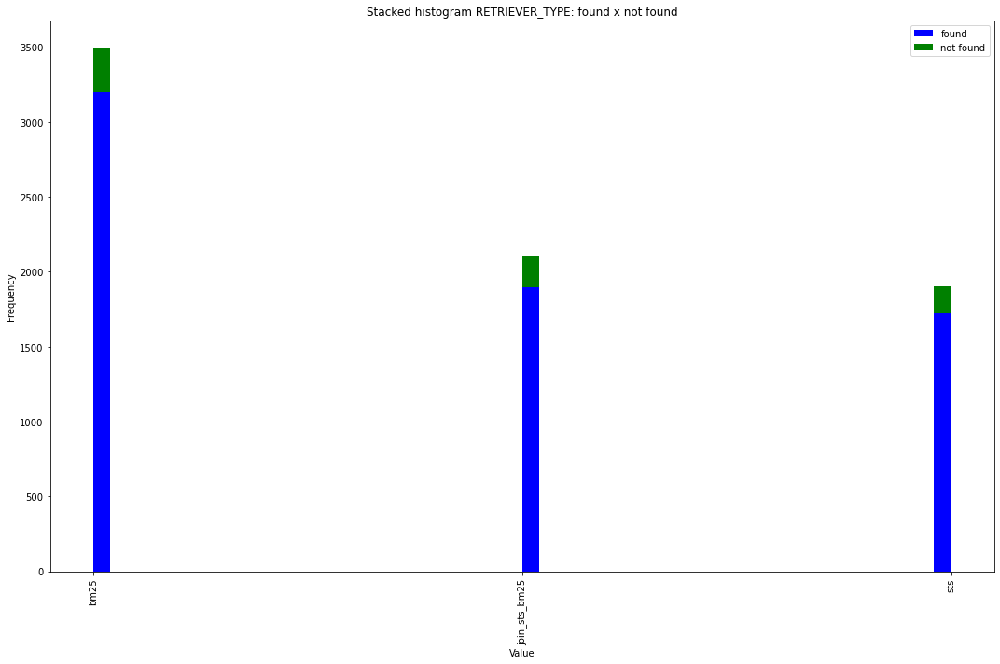

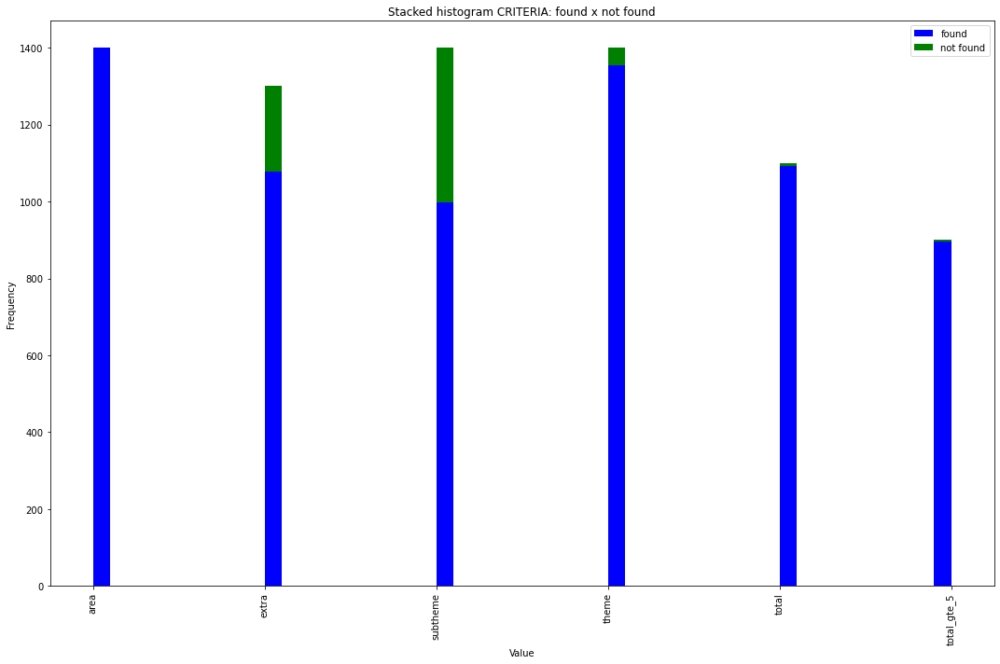

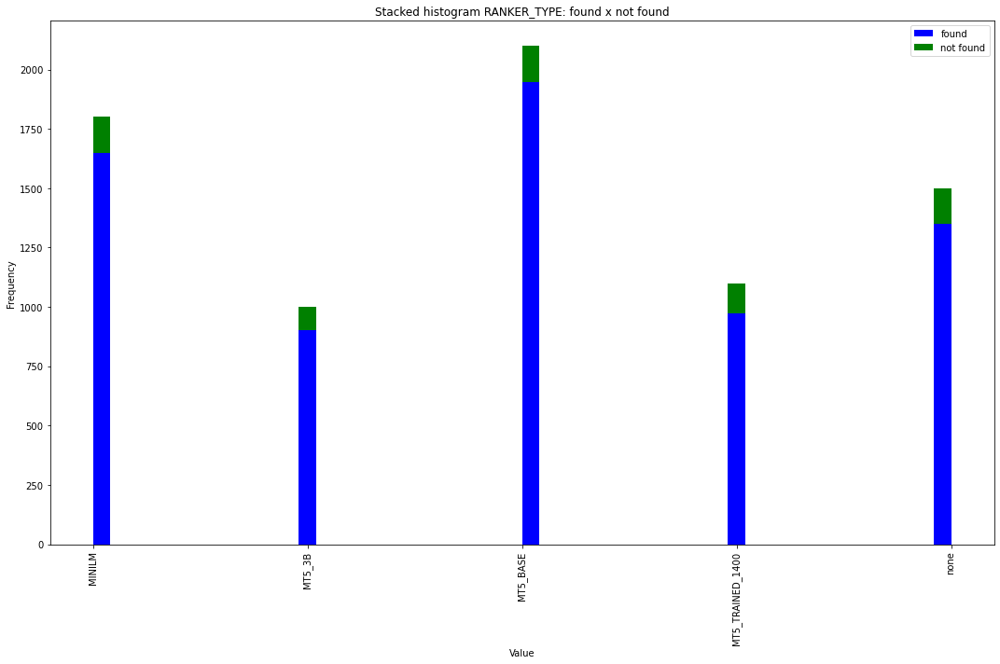

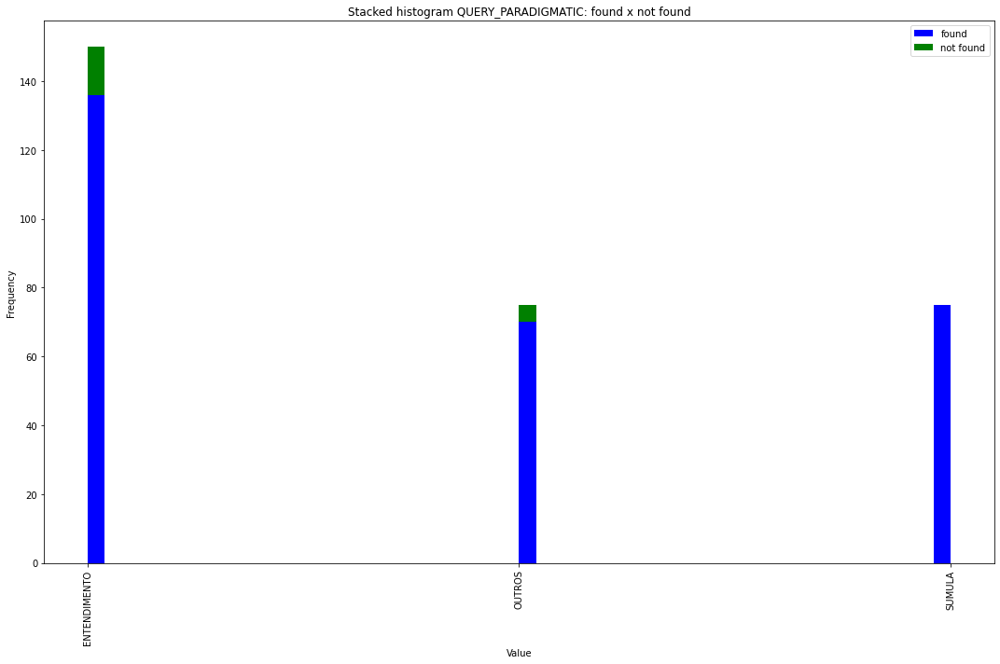

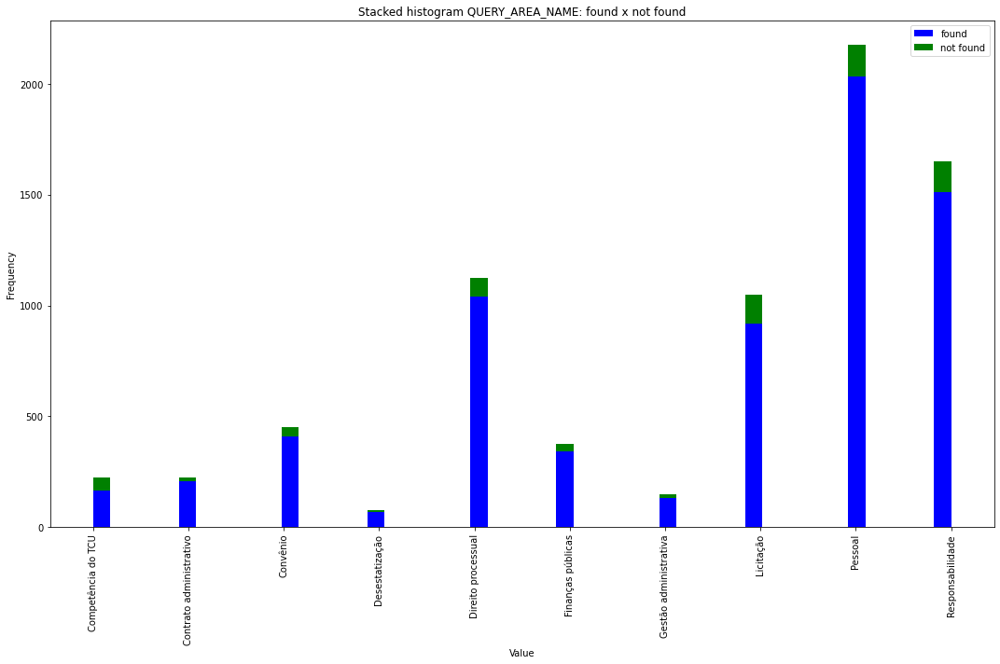

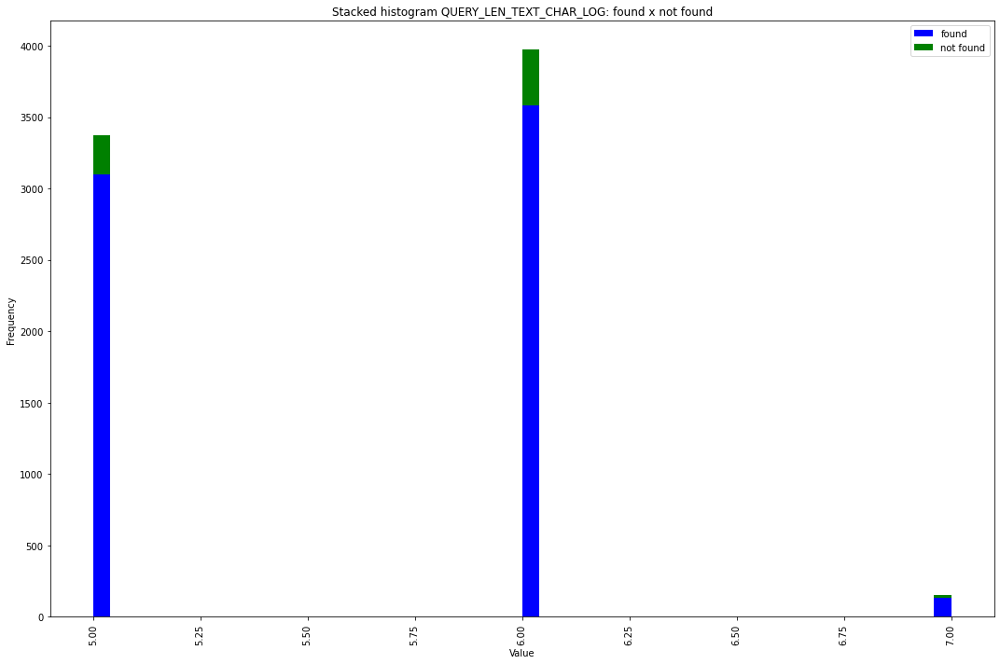

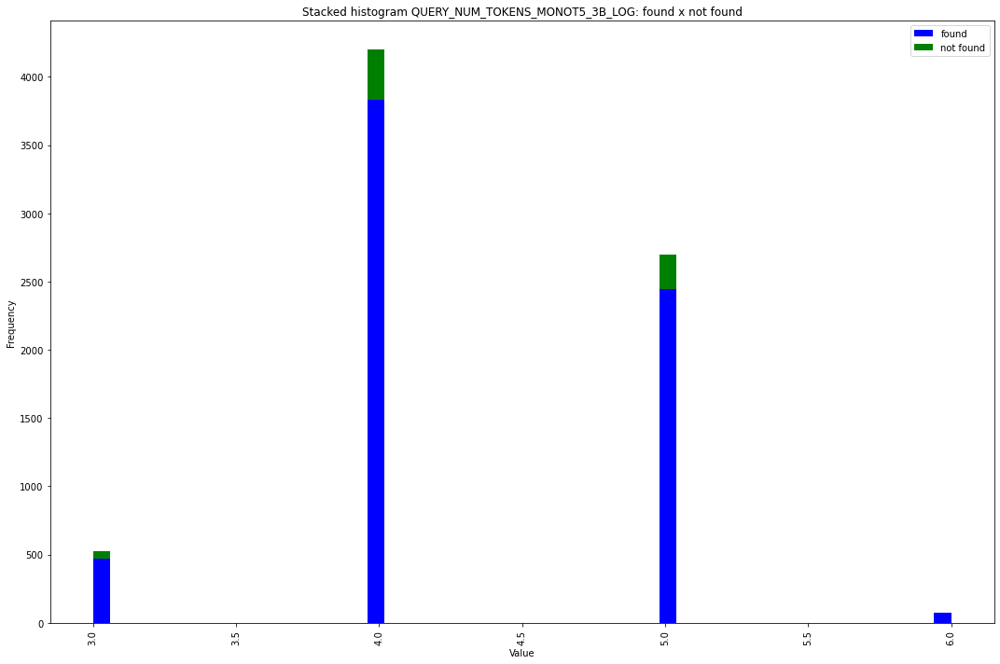

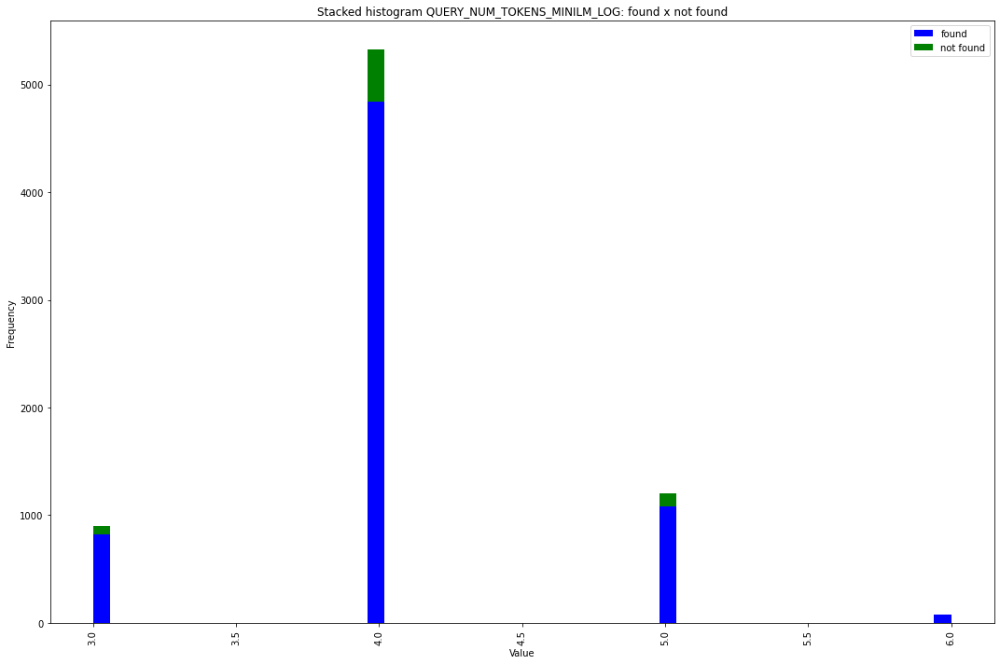

In [55]:
for coluna in list_category:
    f, ax = plt.subplots(1, 1, figsize=(15,10))
    plt.hist([df_result.sort_values(by=coluna)[coluna].dropna(), df_not_found.sort_values(by=coluna)[coluna].dropna()], color=['blue', 'green'], label=['found', 'not found'], stacked=True, bins=50)


    plt.legend()
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Stacked histogram {coluna}: found x not found')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

## Category evaluation

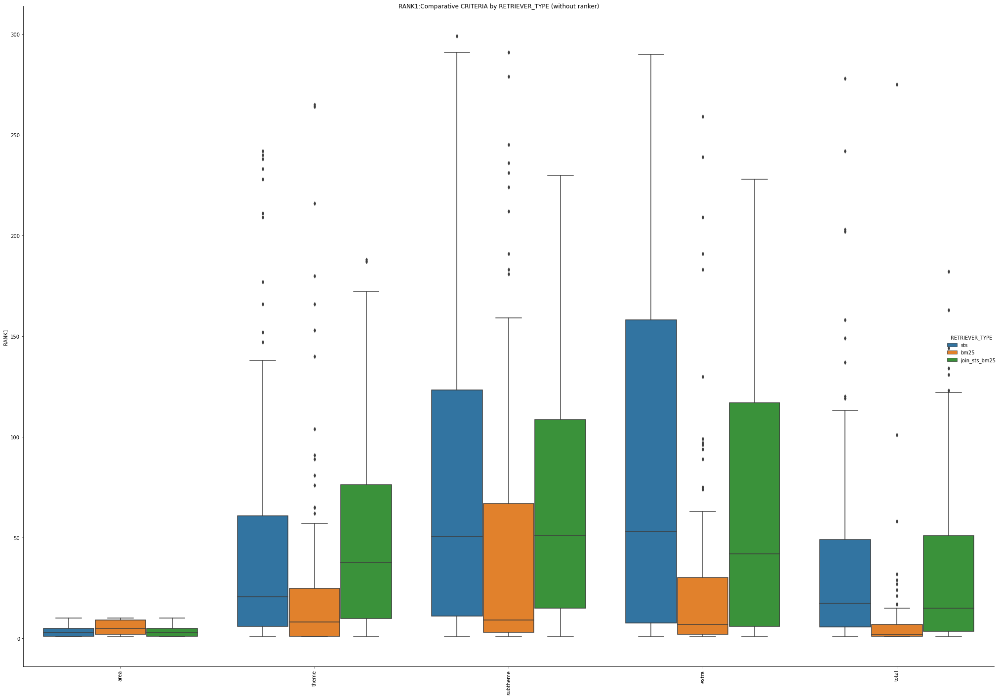

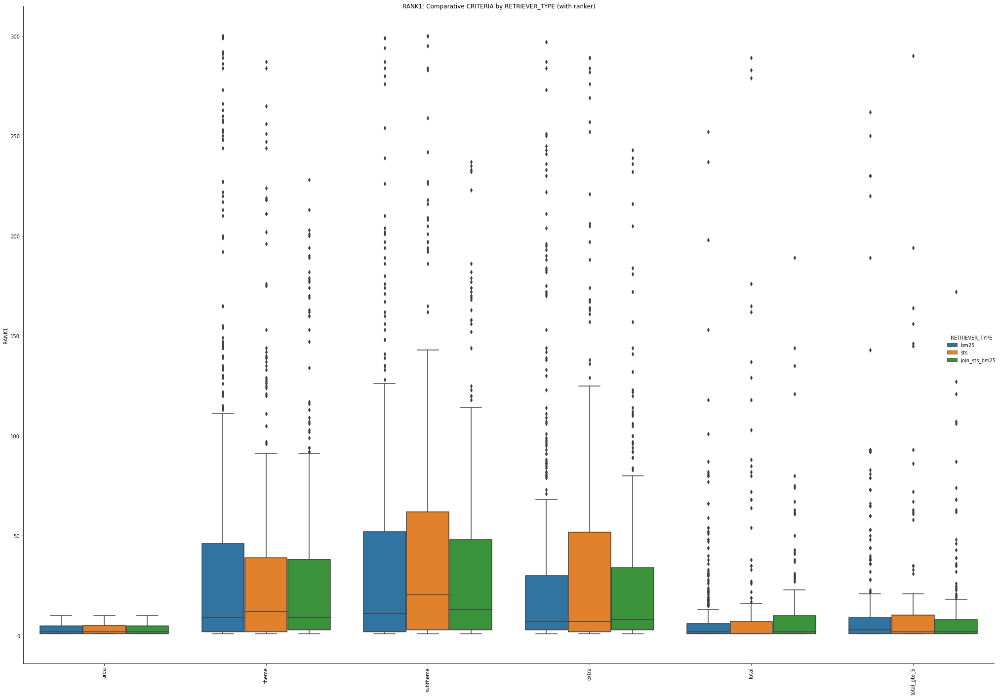

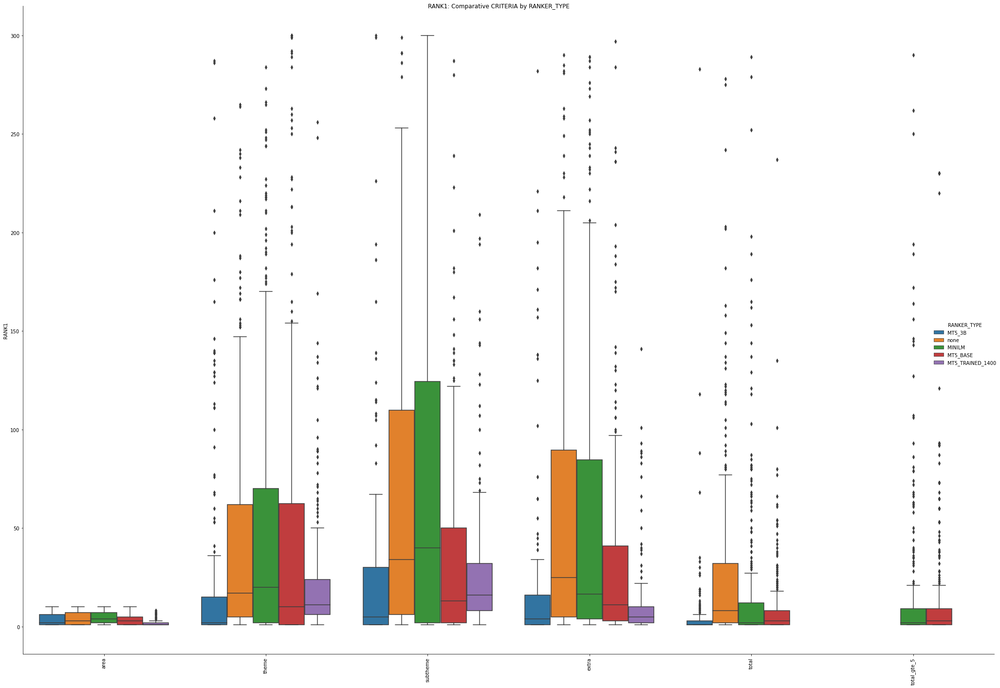

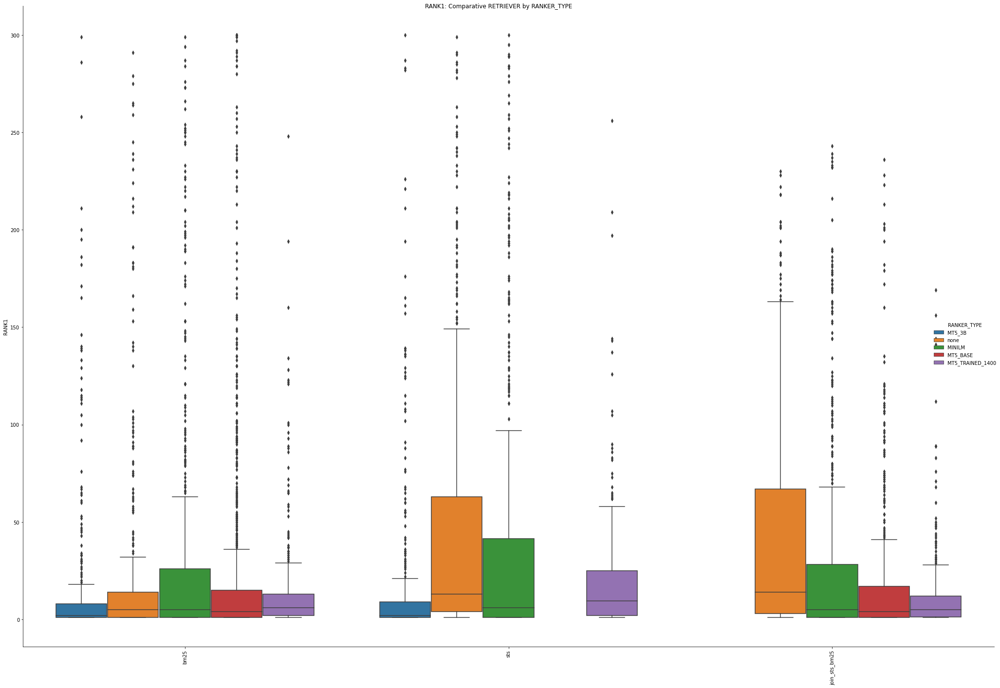

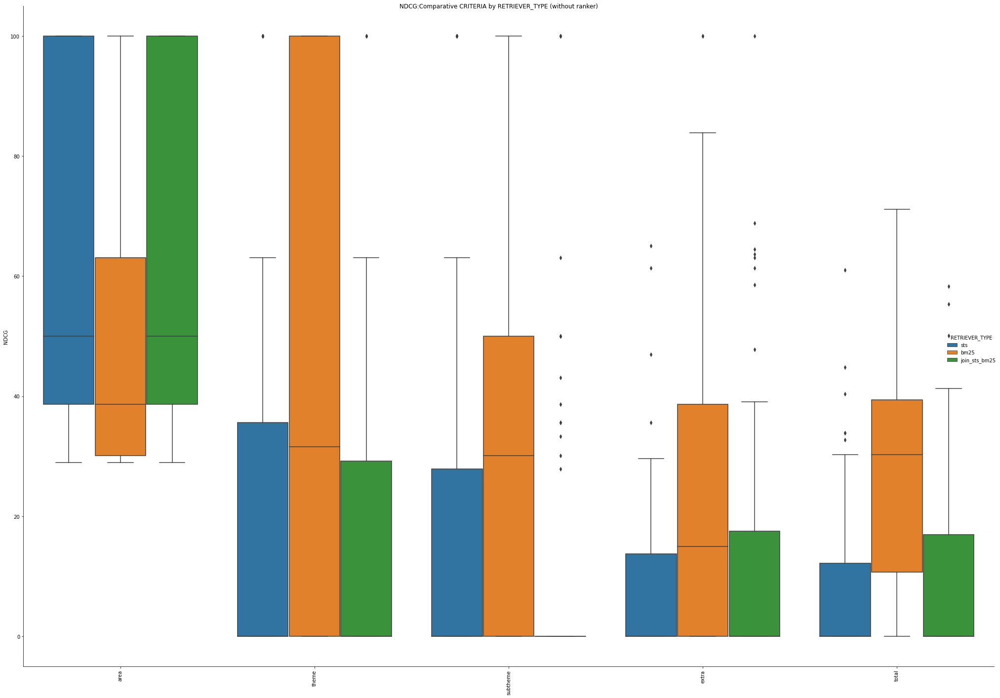

...

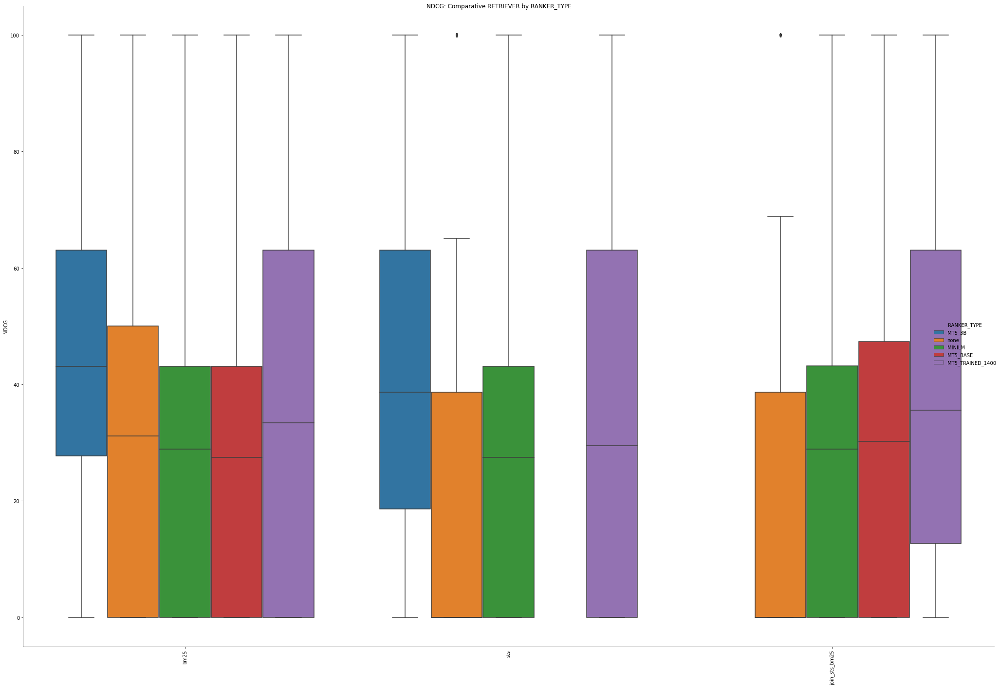

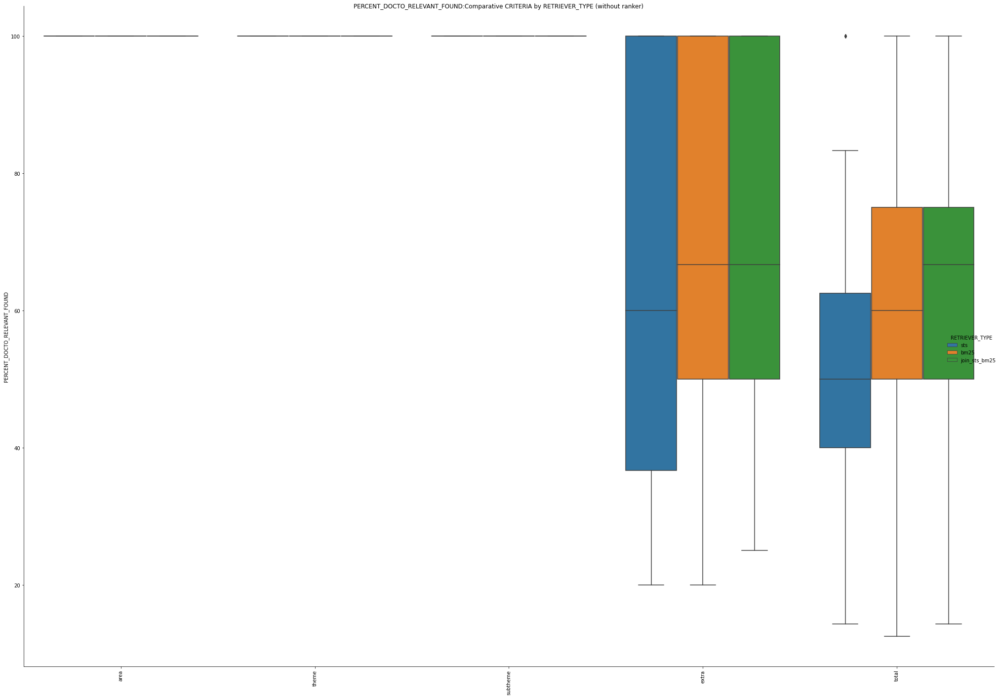

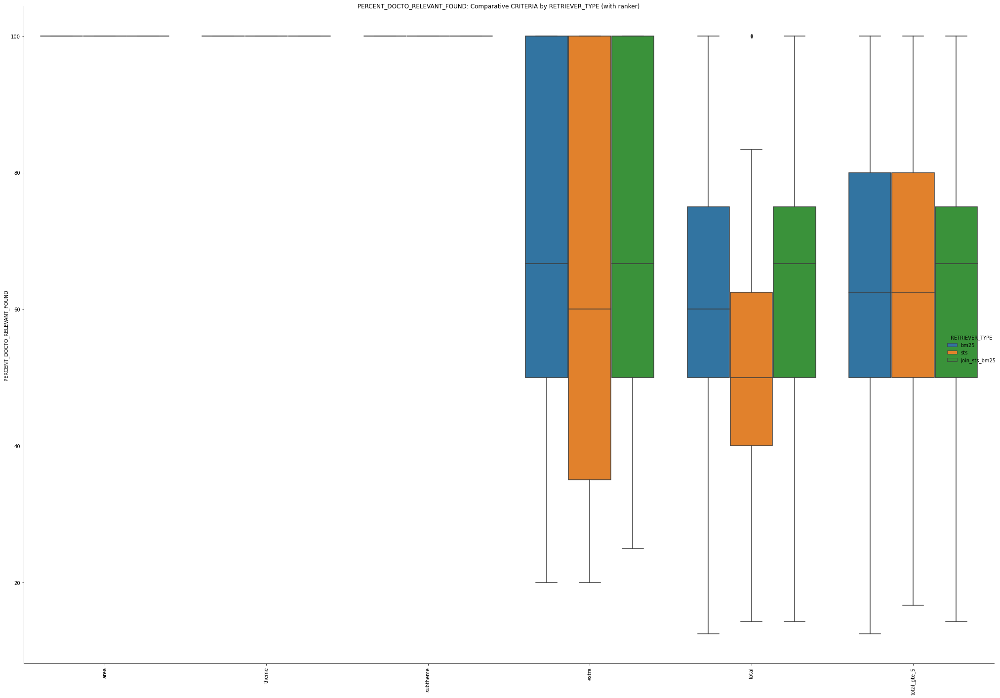

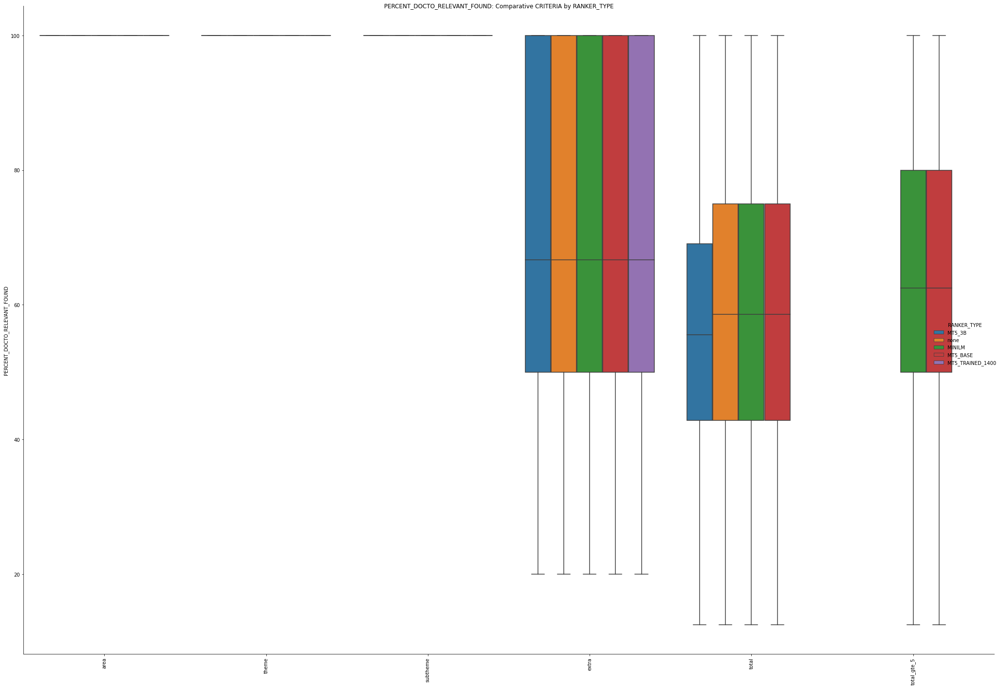

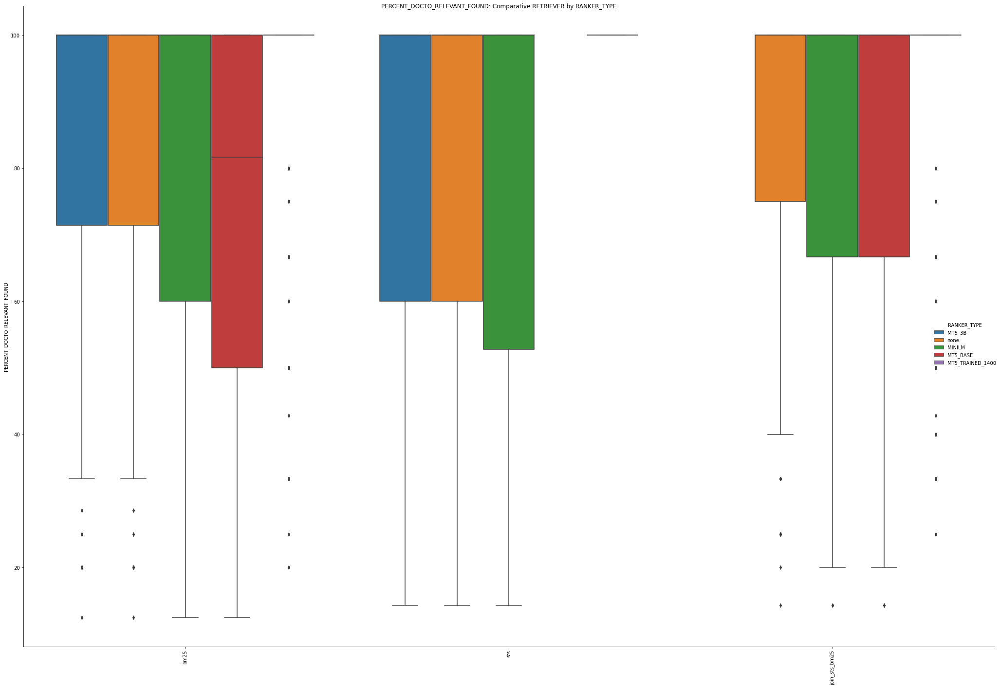

In [57]:
for metric in list_metric:
    g = sns.catplot(x="CRITERIA", sharex=True, y=metric, hue="RETRIEVER_TYPE",
                    kind="box", data=df_result[df_result['RANKER_TYPE']=='none'], height=20, aspect=20/15) # row="CLASSE", 
    g.fig.suptitle(f'{metric}:Comparative CRITERIA by RETRIEVER_TYPE (without ranker)')
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
    plt.show()

    g = sns.catplot(x="CRITERIA", sharex=True, y=metric, hue="RETRIEVER_TYPE",
                    kind="box", data=df_result[df_result['RANKER_TYPE']!='none'], height=20, aspect=20/15) # row="CLASSE", 
    g.fig.suptitle(f'{metric}: Comparative CRITERIA by RETRIEVER_TYPE (with ranker)')
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
    plt.show()    

    g = sns.catplot(x="CRITERIA", sharex=True, y=metric, hue="RANKER_TYPE",
                    kind="box", data=df_result, height=20, aspect=20/15) # row="CLASSE", 
    g.fig.suptitle(f'{metric}: Comparative CRITERIA by RANKER_TYPE')
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
    plt.show()      

    g = sns.catplot(x="RETRIEVER_TYPE", sharex=True, y=metric, hue="RANKER_TYPE",
                    kind="box", data=df_result, height=20, aspect=20/15) # row="CLASSE", 
    g.fig.suptitle(f'{metric}: Comparative RETRIEVER by RANKER_TYPE')
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
    plt.show()     

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


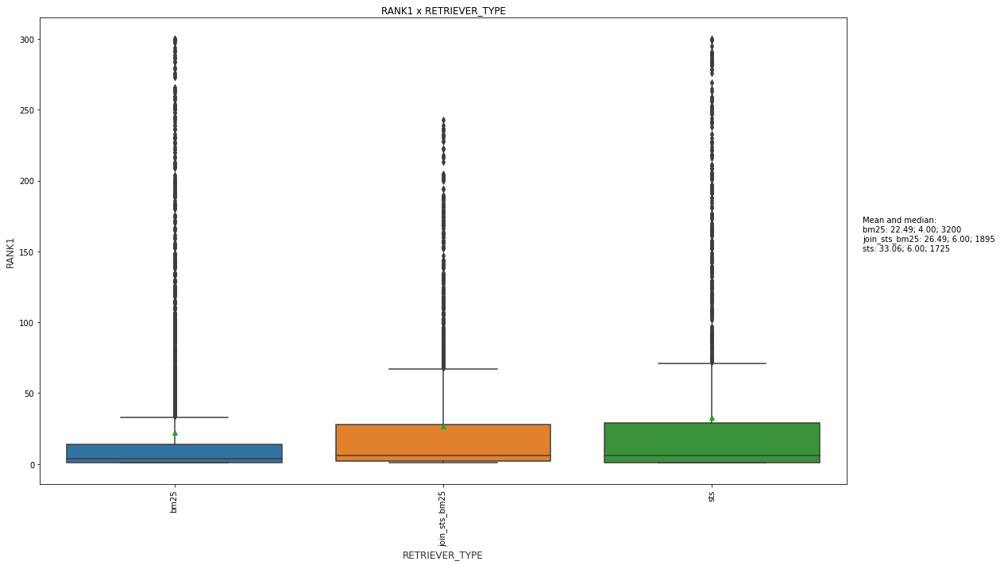

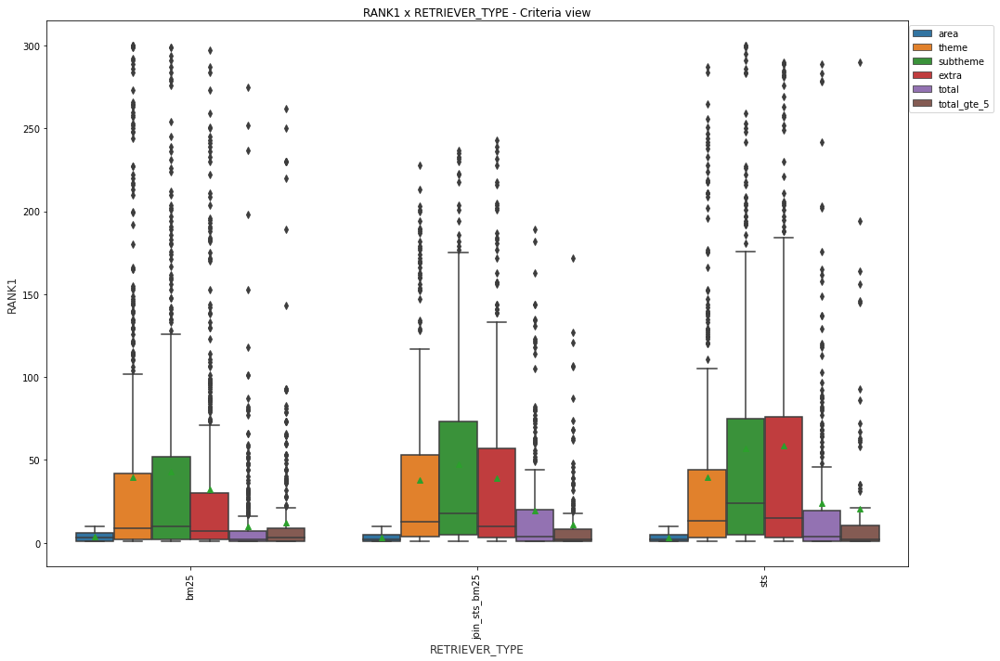

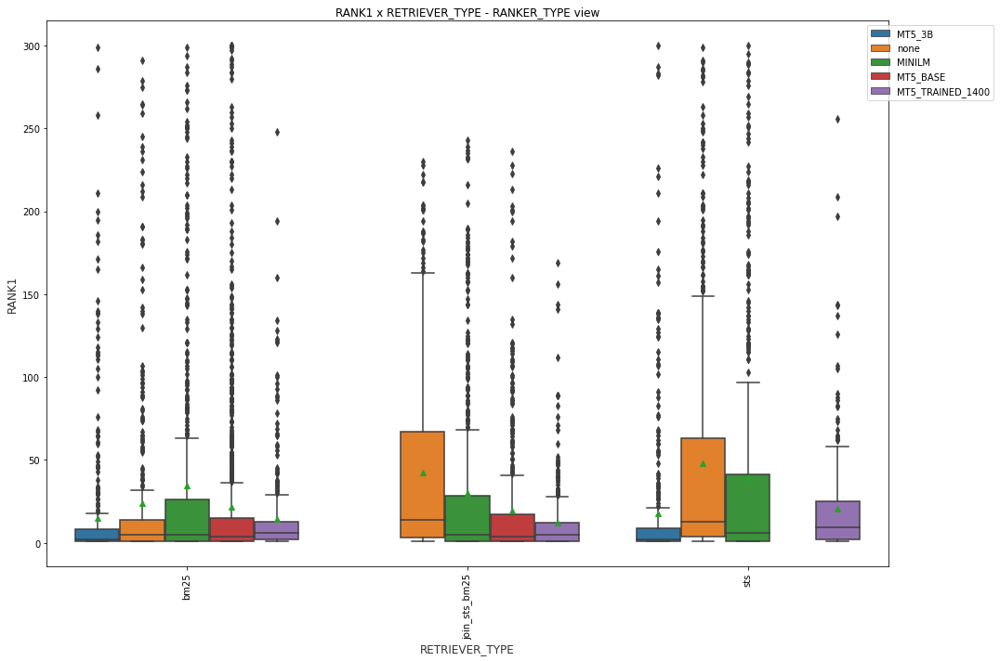

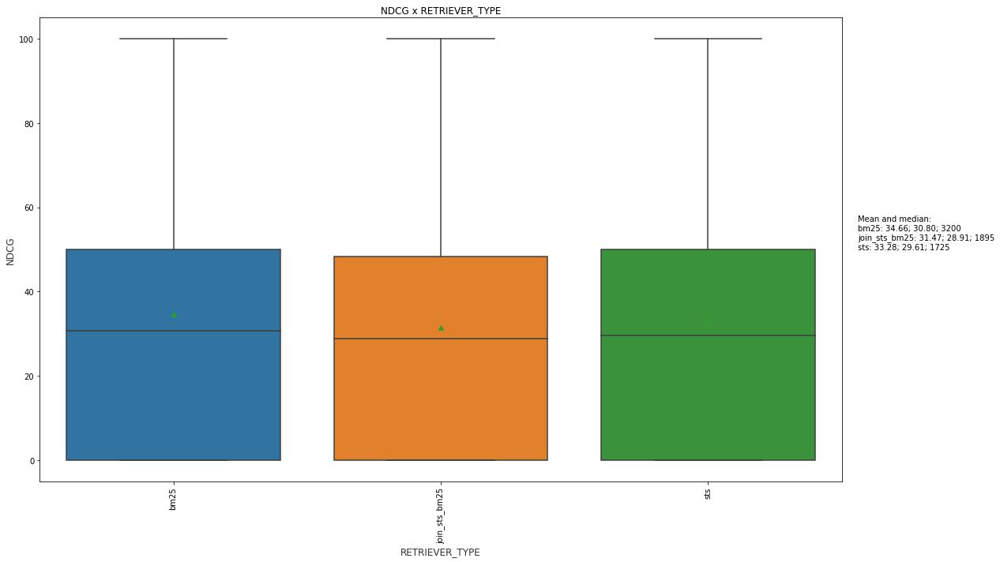

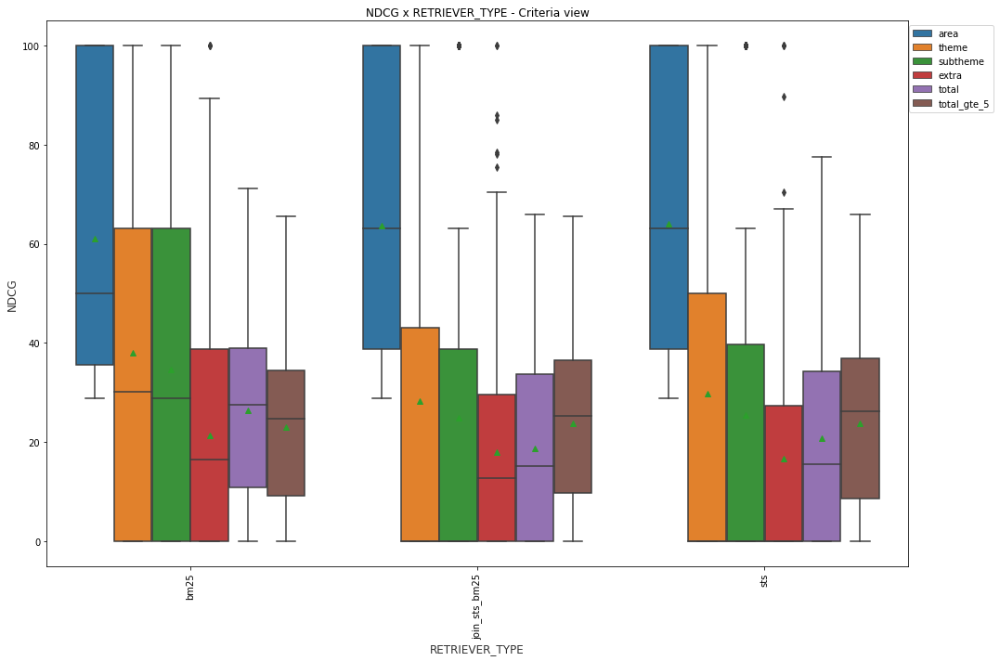

...

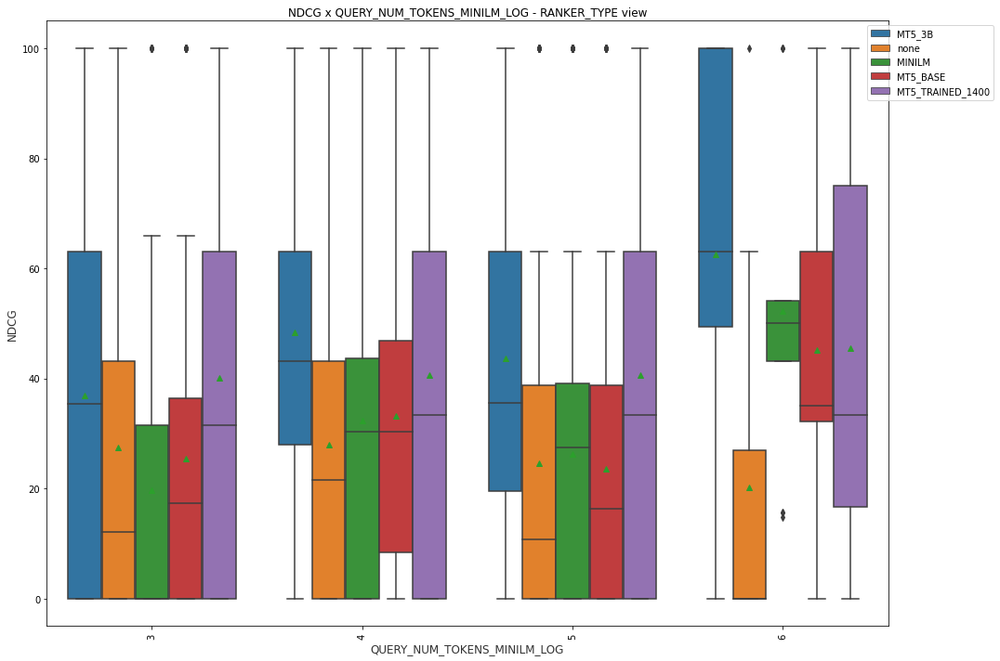

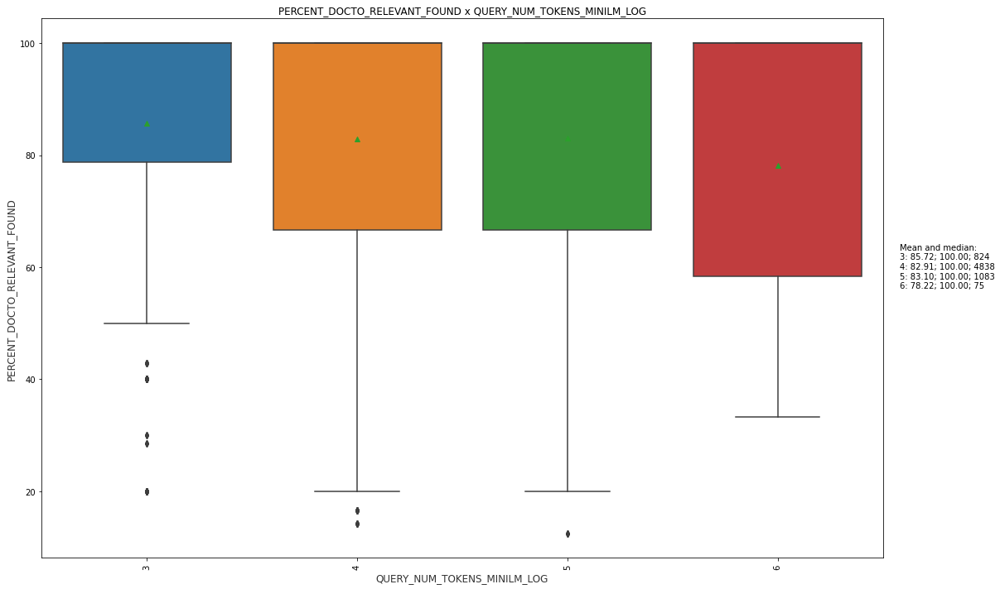

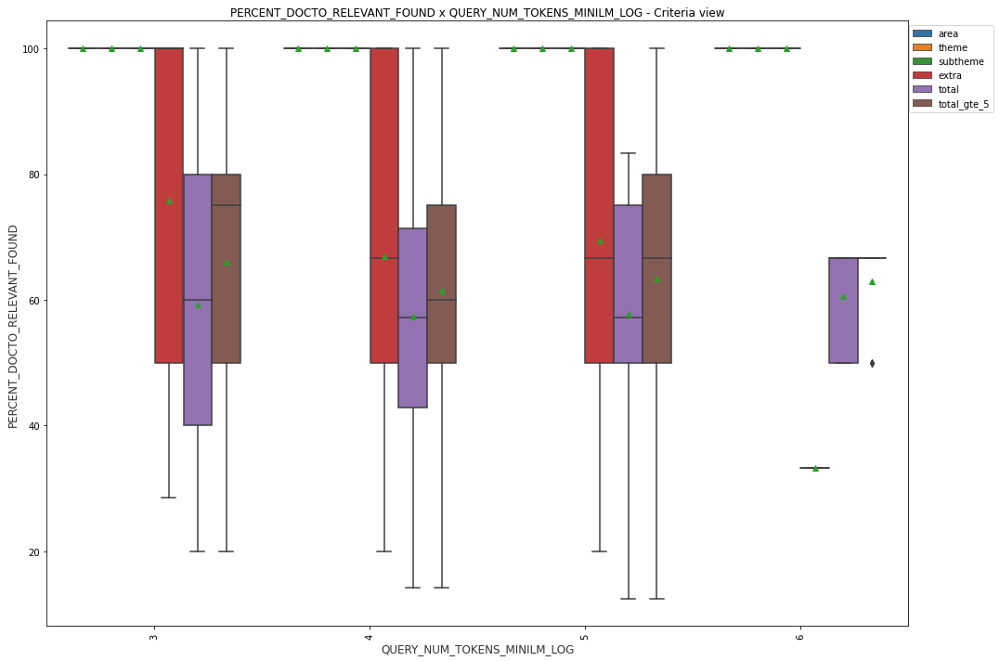

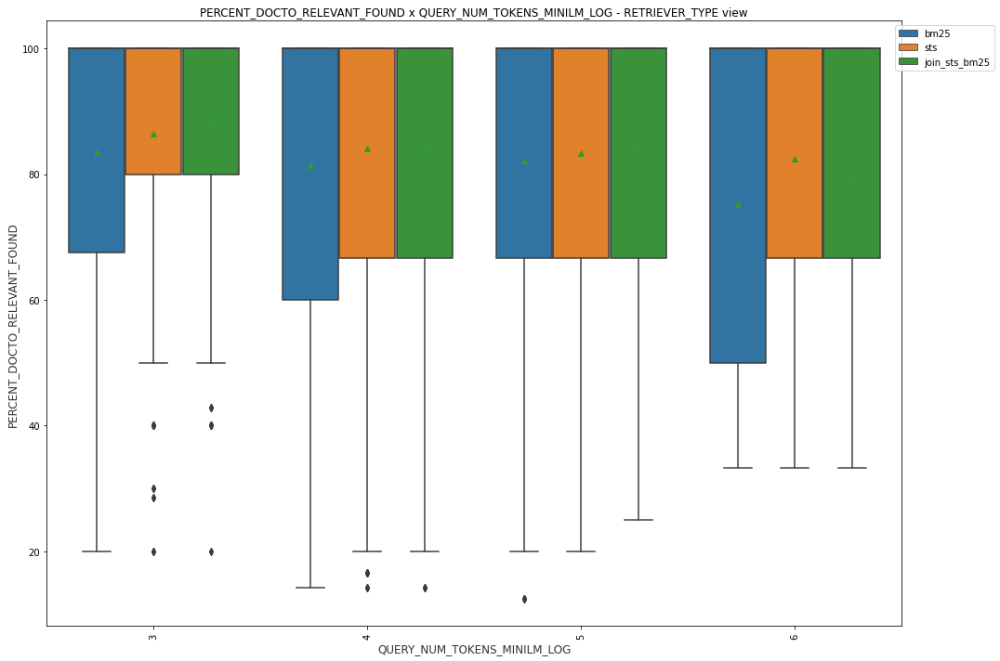

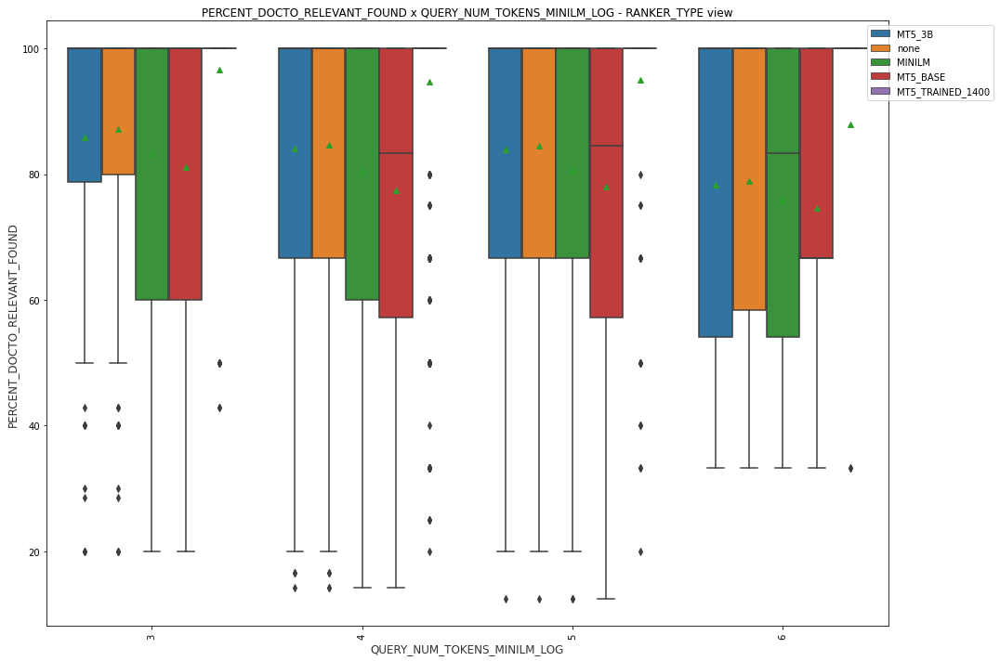

In [58]:
for context in list_category: 
    for metric in list_metric:
        
        # criar lista com valores únicos da coluna a ser ordenada
        # valores_unicos = sorted(df_result[context].unique())
        
        valores_unicos = sorted(df_result[context].dropna().unique())


        f, ax = plt.subplots(1, 1, figsize=(15,10))
        sns.boxplot(x=context, y=metric, data=df_result, showmeans=True, ax=ax, order=valores_unicos)
        ax.set_xlabel(context,size = 12,alpha=0.8)
        ax.set_ylabel(metric,size = 12,alpha=0.8)
        ax.set_title(f'{metric} x {context}')
        plt.xticks(rotation=90)
        plt.tight_layout()

        # Média e Mediana
        media = df_result.groupby(context)[metric].mean()
        mediana = df_result.groupby(context)[metric].median()
        count = df_result.groupby(context)[metric].count()
        mm_list = [f"{i}: {j:.2f}; {k:.2f}; {l:.0f}" for i,j,k,l in zip(media.index, media, mediana, count)]
        mm_str = "\n".join(mm_list)
        ax.text(1.02, 0.5, f"Mean and median:\n{mm_str}", transform=ax.transAxes)

        if context != 'CRITERIA':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='CRITERIA' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - Criteria view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RETRIEVER_TYPE':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RETRIEVER_TYPE' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RETRIEVER_TYPE view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RANKER_TYPE':
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RANKER_TYPE' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RANKER_TYPE view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

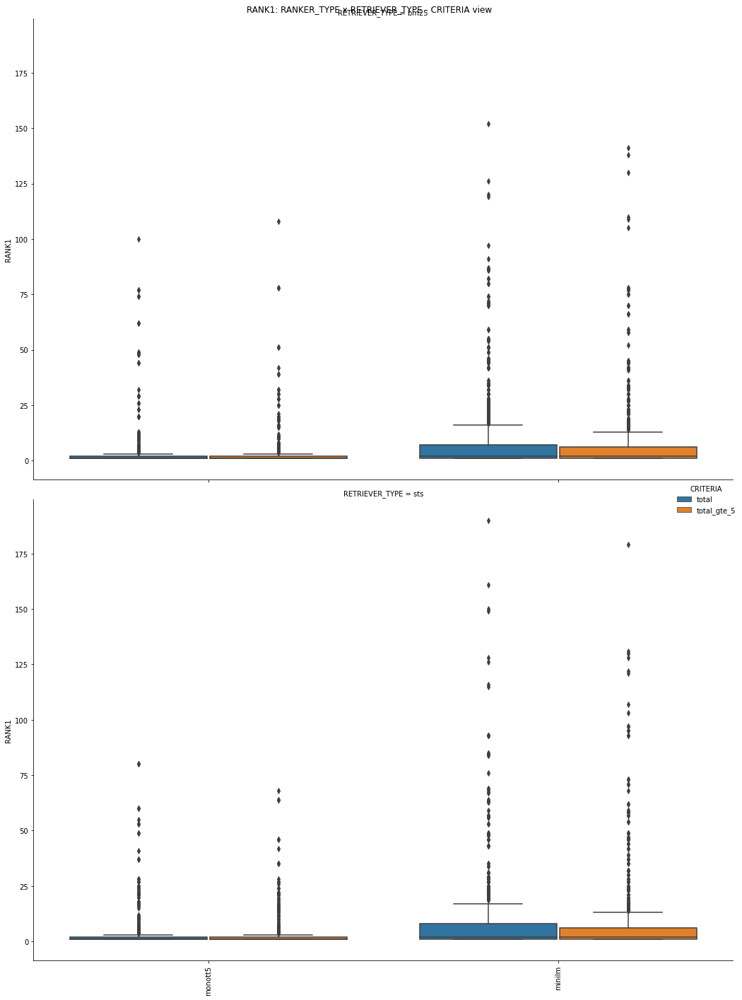

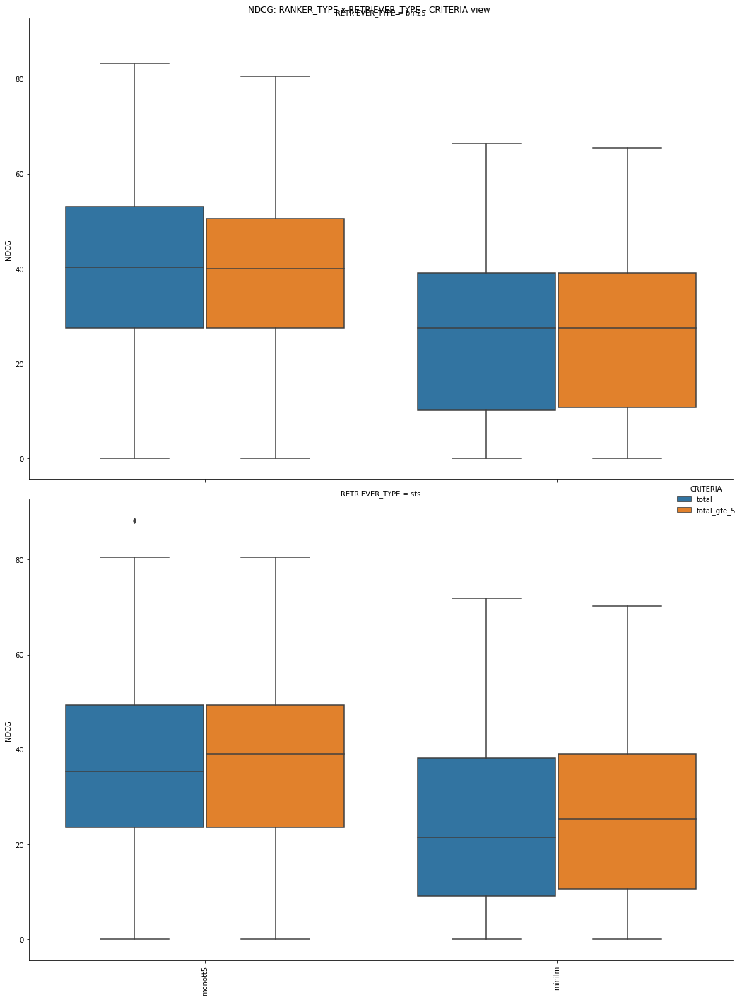

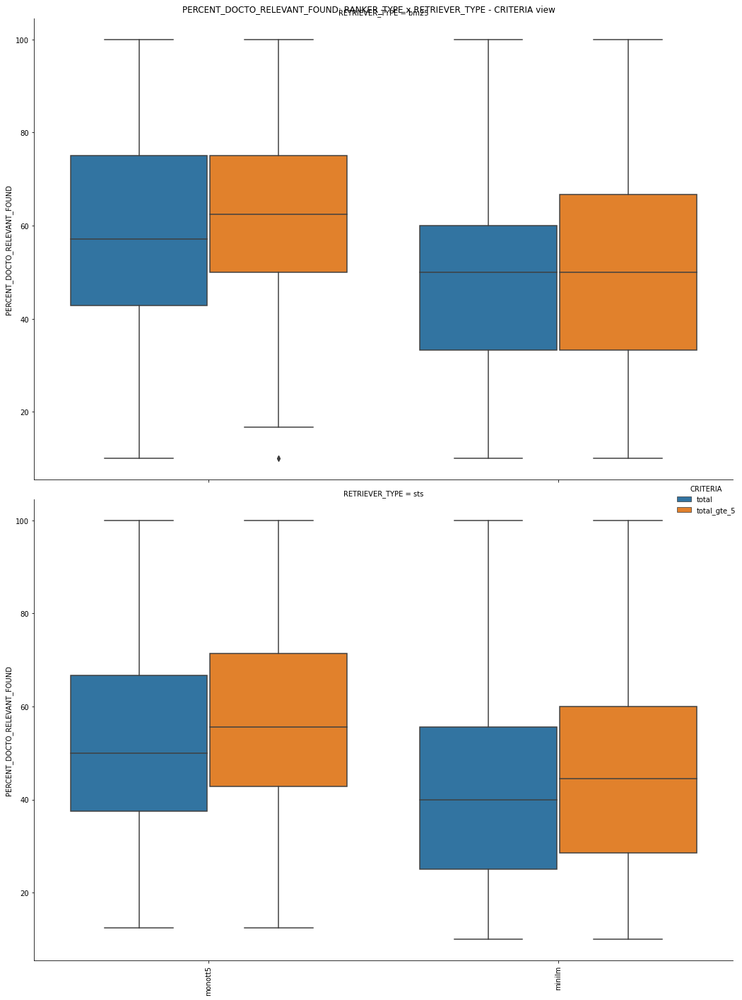

In [ ]:
for metric in list_metric:
    g = sns.catplot(x="RANKER_TYPE", sharex=True, y=metric, hue="CRITERIA", row="RETRIEVER_TYPE", kind="box", data=df_result, height=10, aspect=20/15)
    g.fig.suptitle(f"{metric}: RANKER_TYPE x RETRIEVER_TYPE - CRITERIA view")
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
plt.show()

STS encontrou mais (percent_found)
BM25 alcançou ndcg melhor entre os 12 primeiros


In [ ]:
df_result.corr()

,COUNT_DOCTO_RELEVANT,TIME_SPENT,NDCG,COUNT_DOCTO_FOUND,RANK1,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,QUERY_ID,QUERY_ID_DOCTO,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND
COUNT_DOCTO_RELEVANT,1.000000,0.013206,-0.253396,0.008190,0.169028,-0.009742,0.007391,NaN,-0.109893,-0.015374,-0.047578,0.254118,-0.052618,-0.050033,-0.051838,0.245551,0.104871,0.298150,-0.244072
TIME_SPENT,0.013206,1.000000,0.291301,0.842056,-0.126671,0.302145,-0.380393,NaN,0.004916,0.003268,0.011115,0.024252,0.011389,0.011521,0.011831,0.023282,0.024871,0.338254,0.332312
NDCG,-0.253396,0.291301,1.000000,0.196392,-0.513955,-0.004537,-0.154947,NaN,-0.039241,0.027306,-0.114001,-0.209009,-0.111374,-0.112311,-0.112368,-0.169303,-0.154749,0.313878,0.463934
COUNT_DOCTO_FOUND,0.008190,0.842056,0.196392,1.000000,-0.033031,0.472440,0.087992,NaN,0.001812,-0.000150,0.000978,0.008500,0.001321,0.001592,0.001938,0.006463,0.008122,0.400285,0.403690
RANK1,0.169028,-0.126671,-0.513955,-0.033031,1.000000,0.037316,0.148376,NaN,-0.009382,-0.019504,0.052858,0.130120,0.054233,0.056037,0.058643,0.085569,0.103940,-0.157645,-0.237838
TOPK_RETRIEVER,-0.009742,0.302145,-0.004537,0.472440,0.037316,1.000000,0.002686,NaN,0.003800,-0.000940,0.000595,0.000756,0.000620,0.000605,0.000640,0.001907,0.001705,0.113561,0.129689
TOPK_RANKER,0.007391,-0.380393,-0.154947,0.087992,0.148376,0.002686,1.000000,NaN,-0.000556,0.000592,0.000130,0.004565,0.000305,0.000434,0.000602,0.002357,0.003088,0.081770,0.083561
NDCG_LIMIT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
QUERY_ID,-0.109893,0.004916,-0.039241,0.001812,-0.009382,0.003800,-0.000556,NaN,1.000000,0.158068,-0.045329,-0.013113,-0.037884,-0.041855,-0.032350,0.021639,0.088059,-0.091997,-0.042899
QUERY_ID_DOCTO,-0.015374,0.003268,0.027306,-0.000150,-0.019504,-0.000940,0.000592,NaN,0.158068,1.000000,0.033150,0.056160,0.023769,0.027844,0.023214,0.061615,0.213774,-0.123145,-0.089795


## Correlation 

In [ ]:
df_result.corr()

,ID_QUERY,COUNT_DOCTO_RELEVANT,TIME_SPENT,NDCG,COUNT_DOCTO_FOUND,RANK1,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,ID_DOCTO,LEN_TEXT_CHAR,LEN_TEXT_CHAR_LOG,NUM_WORD,NUM_TOKENS_MONOT5_3B,NUM_TOKENS_MINILM,NUM_TOKENS_MONOT5_3B_LOG,NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND
ID_QUERY,1.000000,-0.109893,0.004916,-0.039241,0.001812,-0.009382,0.003800,-0.000556,NaN,0.158068,-0.045329,-0.013113,-0.037884,-0.041855,-0.032350,0.021639,0.088059,-0.091997,-0.042899
COUNT_DOCTO_RELEVANT,-0.109893,1.000000,0.013206,-0.253396,0.008190,0.169028,-0.009742,0.007391,NaN,-0.015374,-0.047578,0.254118,-0.052618,-0.050033,-0.051838,0.245551,0.104871,0.298150,-0.244072
TIME_SPENT,0.004916,0.013206,1.000000,0.291301,0.842056,-0.126671,0.302145,-0.380393,NaN,0.003268,0.011115,0.024252,0.011389,0.011521,0.011831,0.023282,0.024871,0.338254,0.332312
NDCG,-0.039241,-0.253396,0.291301,1.000000,0.196392,-0.513955,-0.004537,-0.154947,NaN,0.027306,-0.114001,-0.209009,-0.111374,-0.112311,-0.112368,-0.169303,-0.154749,0.313878,0.463934
COUNT_DOCTO_FOUND,0.001812,0.008190,0.842056,0.196392,1.000000,-0.033031,0.472440,0.087992,NaN,-0.000150,0.000978,0.008500,0.001321,0.001592,0.001938,0.006463,0.008122,0.400285,0.403690
RANK1,-0.009382,0.169028,-0.126671,-0.513955,-0.033031,1.000000,0.037316,0.148376,NaN,-0.019504,0.052858,0.130120,0.054233,0.056037,0.058643,0.085569,0.103940,-0.157645,-0.237838
TOPK_RETRIEVER,0.003800,-0.009742,0.302145,-0.004537,0.472440,0.037316,1.000000,0.002686,NaN,-0.000940,0.000595,0.000756,0.000620,0.000605,0.000640,0.001907,0.001705,0.113561,0.129689
TOPK_RANKER,-0.000556,0.007391,-0.380393,-0.154947,0.087992,0.148376,0.002686,1.000000,NaN,0.000592,0.000130,0.004565,0.000305,0.000434,0.000602,0.002357,0.003088,0.081770,0.083561
NDCG_LIMIT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ID_DOCTO,0.158068,-0.015374,0.003268,0.027306,-0.000150,-0.019504,-0.000940,0.000592,NaN,1.000000,0.033150,0.056160,0.023769,0.027844,0.023214,0.061615,0.213774,-0.123145,-0.089795


    NDCG    
        COUNT_DOCTO_FOUND
        RANK1
        PERCENT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_RELEVANT(-)
        TOPK_RANKER (-)
        LEN_TEXT_CHAR_LOG (-)

    RANK1 (contribui se leva a um rank1 menor)
        PERCENT_DOCTO_RELEVANT_FOUND
        NDCG
        COUNT_DOCTO_RELEVANT (-)
        TOPK_RANKER (-)

    COUNT_DOCTO_RELEVANT
        COUNT_DOCTO_RELEVANT_FOUND
        LEN_TEXT_CHAR_LOG

    TIME_SPENT
        COUNT_DOCTO_RELEVANT_FOUND
        PERCENT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_FOUND
        TOPK_RETRIEVER
        TOPK_RANKER (-)

    COUNT_DOCTO_FOUND
        TOPK_RETRIEVER
        PERCENT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_RELEVANT_FOUND

    TOPK_RETRIEVER
        PERCENT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_RELEVANT_FOUND


## Distribution of values

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


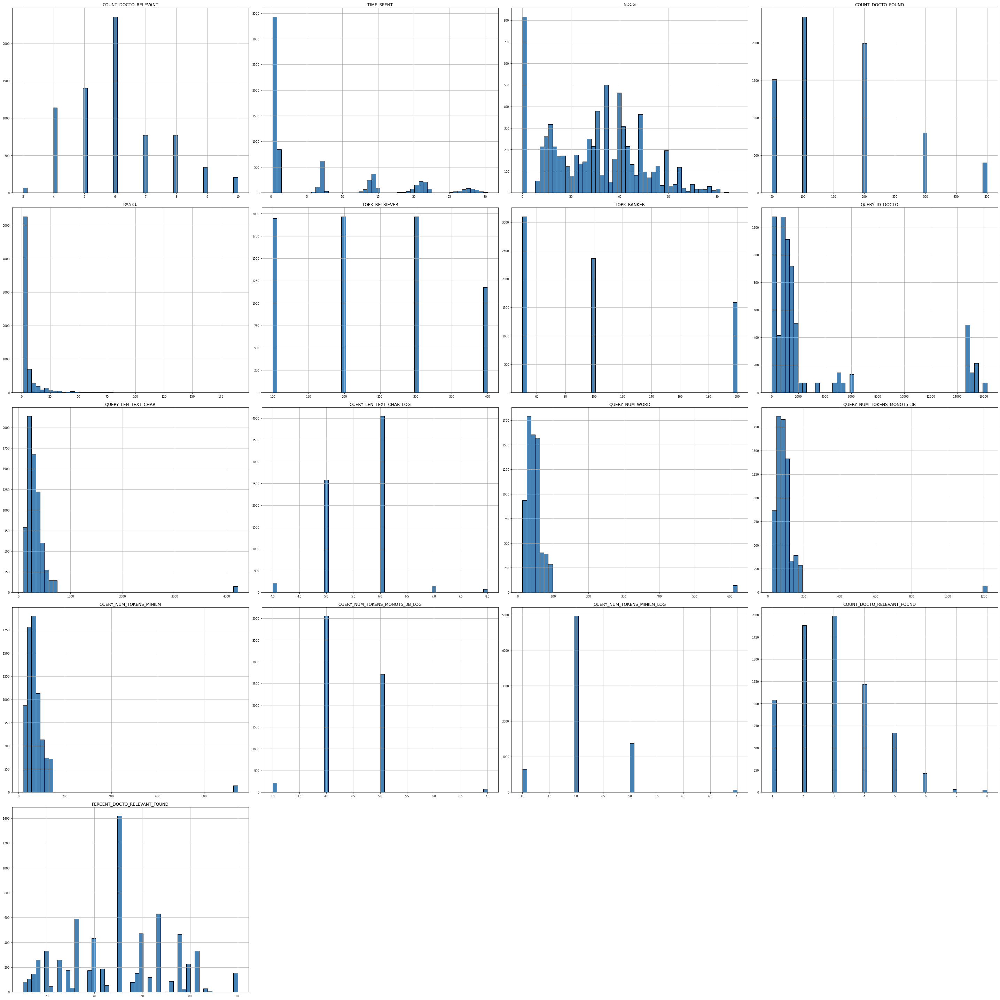

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(40,40))
ax.set_title('Histogram')
df_result.drop(['QUERY_ID','NDCG_LIMIT'],axis=1).hist(bins=50, color='steelblue', edgecolor='black', linewidth=1.0,
           xlabelsize=8, ylabelsize=8, grid=True, ax=ax)  
plt.tight_layout()   

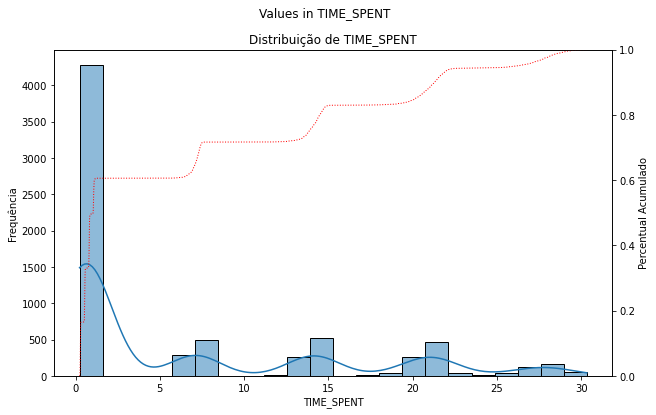

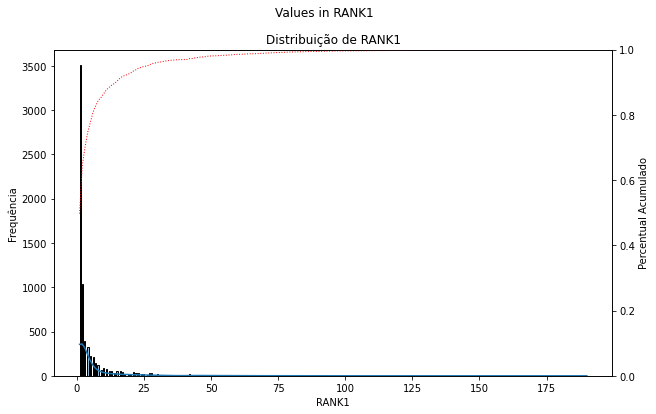

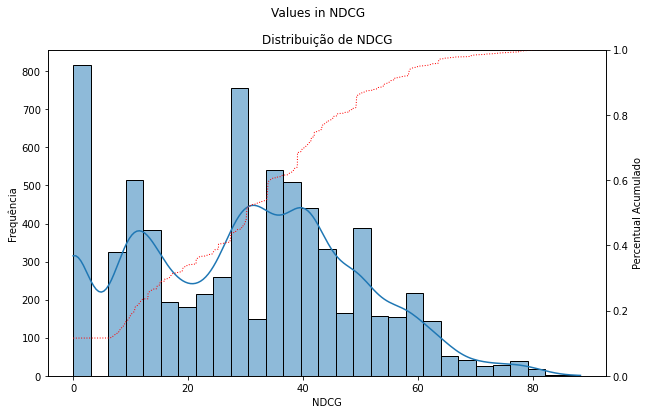

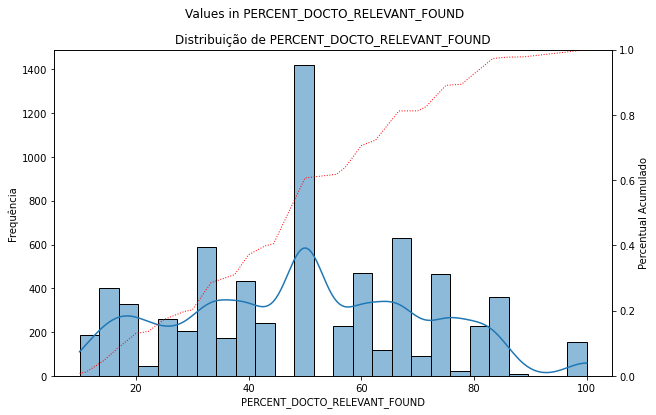

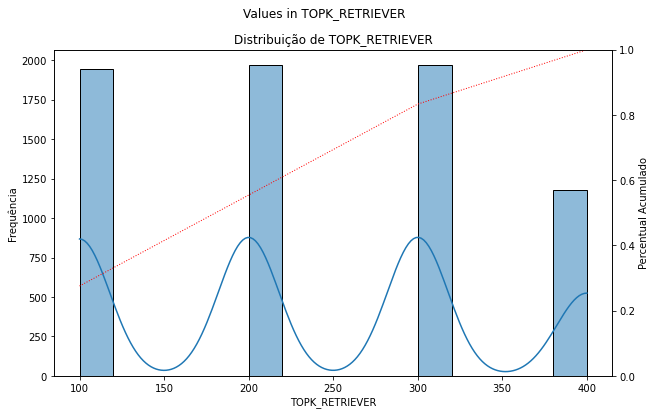

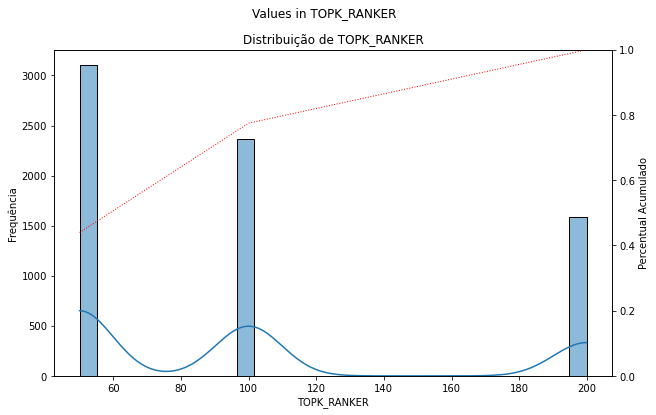

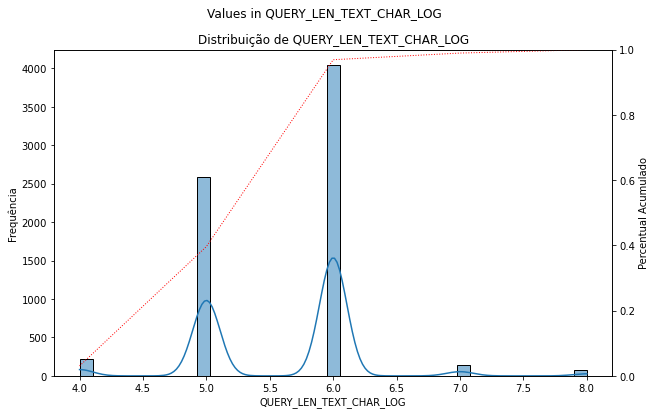

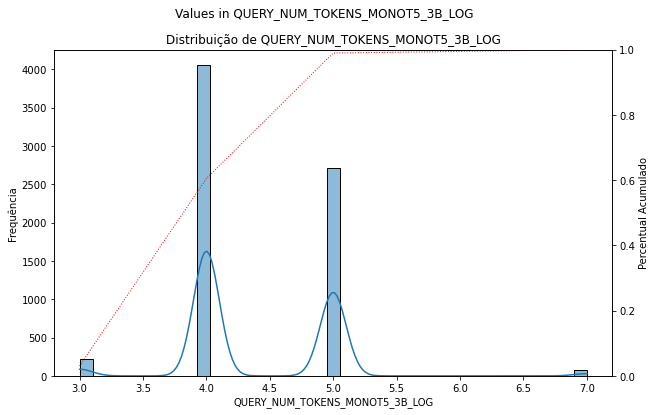

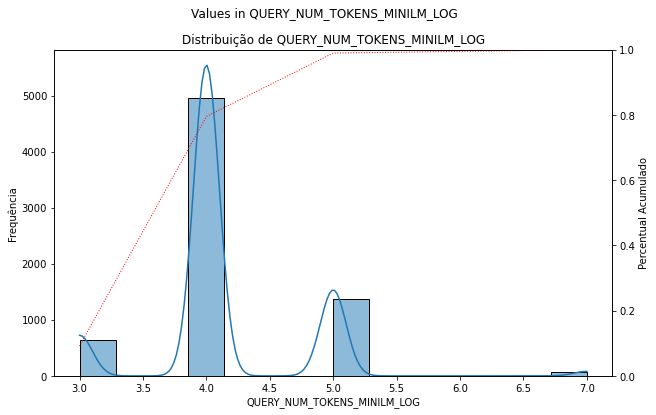

In [ ]:
for column in ['TIME_SPENT'] + list_metric + list_category:
    if df_result[column].dtype != object:
        f, ax = plt.subplots(1, 1, figsize=(10,6))
        f.suptitle(f'Values in {column}')    
        # Plot o histograma normalizado com KDE
        sns.histplot(data=df_result[column], kde=True, ax=ax, linewidth=1)

        # Calcula o percentual acumulado
        cumulative = df_result[column].value_counts(normalize=True).sort_index().cumsum()

        # Cria um novo eixo y com o percentual acumulado
        ax2 = ax.twinx()
        ax2.plot(cumulative.index, cumulative.values, linestyle='dotted', marker='', color='red', linewidth=1)
        ax2.set_ylim([0, 1])
        ax2.set_ylabel('Percentual Acumulado')

        # Configurações do gráfico
        ax.set_title(f'Distribuição de {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Frequência')
# Exibe o gráfico
plt.show()

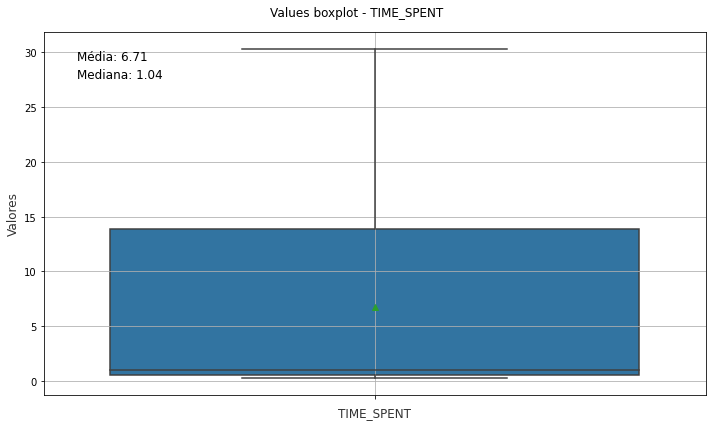

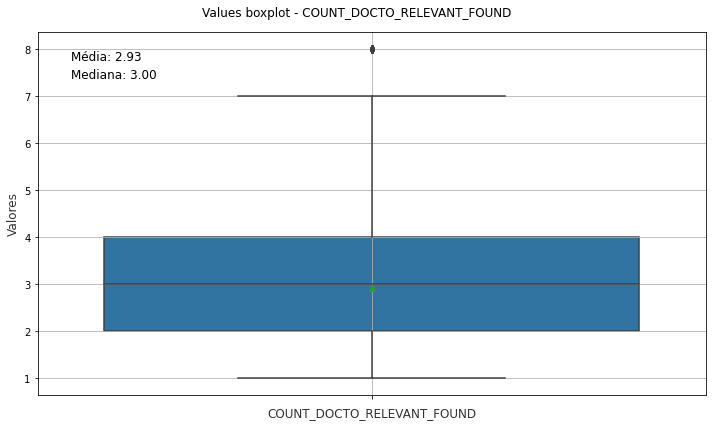

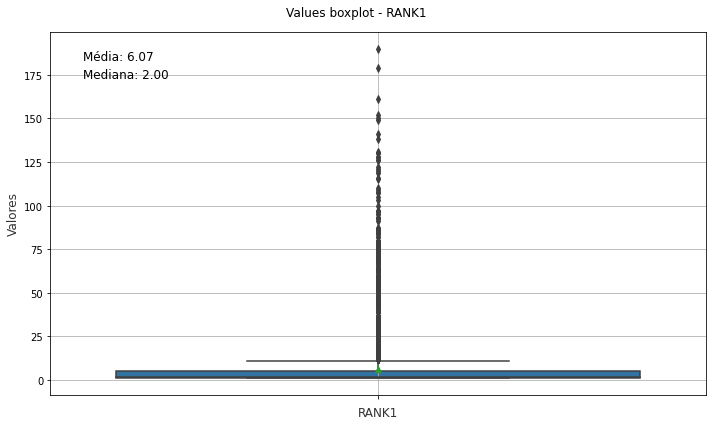

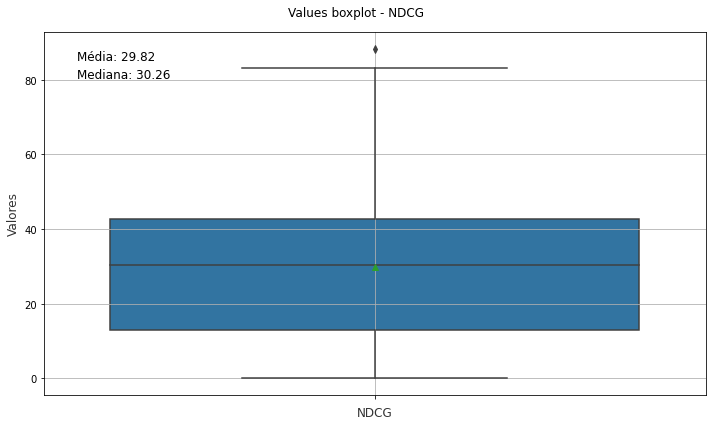

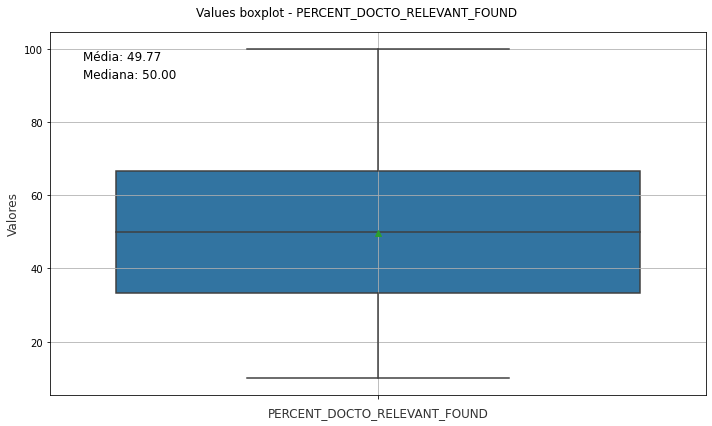

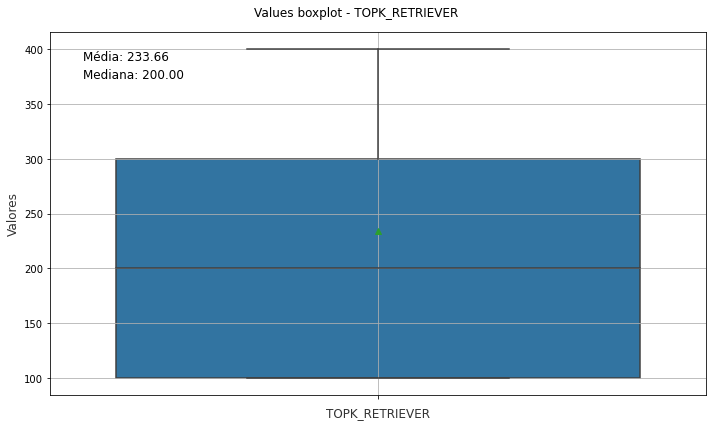

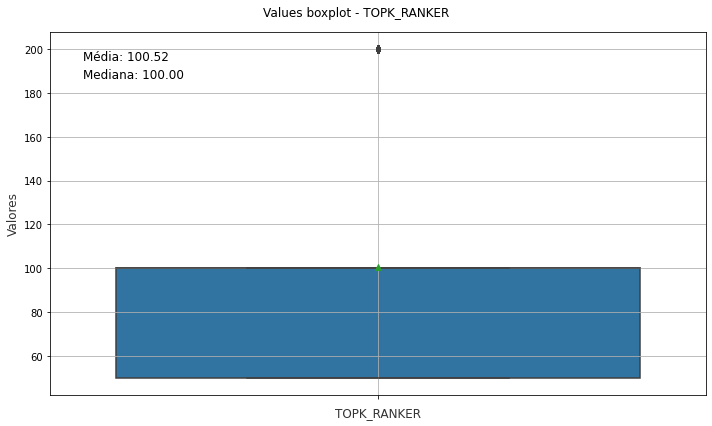

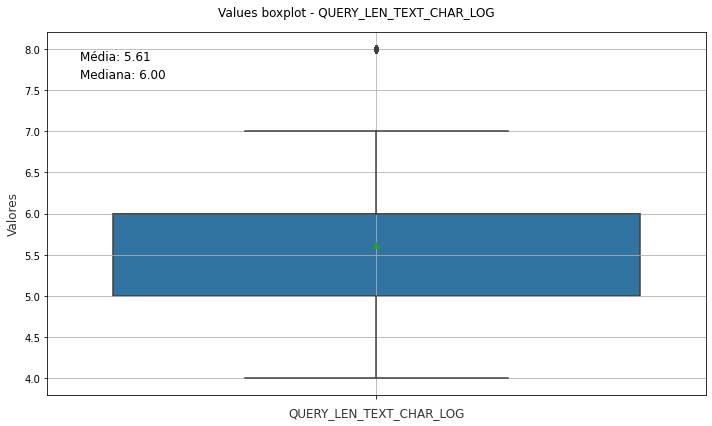

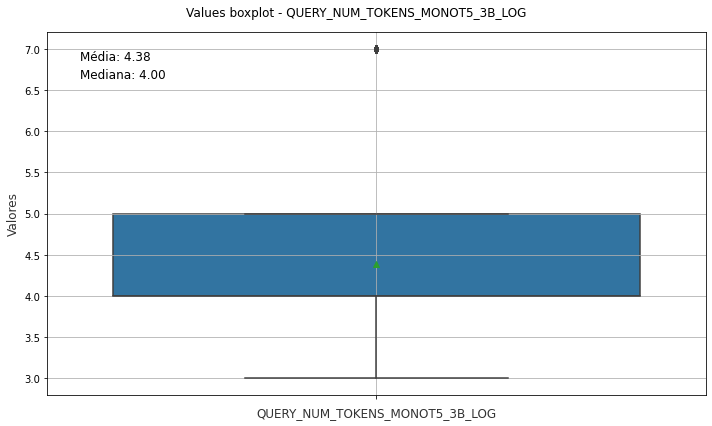

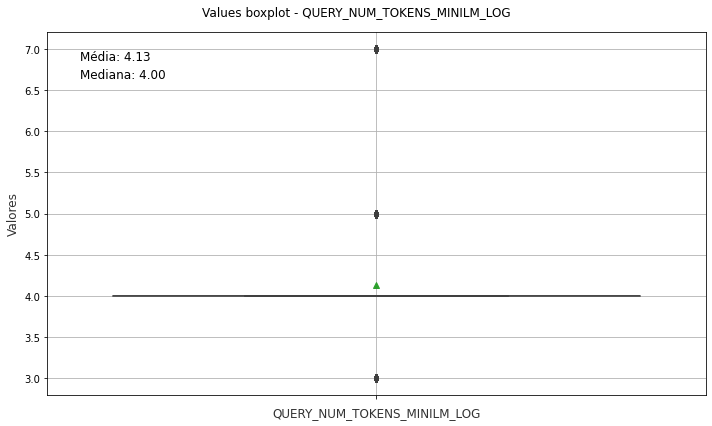

In [ ]:
metrics = {}
for column in ['TIME_SPENT', 'COUNT_DOCTO_RELEVANT_FOUND'] + list_metric + list_category: 
  if df_result[column].dtype != object:
    f, ax = plt.subplots(1, 1, figsize=(10,6))
    f.suptitle(f'Values boxplot - {column}')
    ax = sns.boxplot(y=column, data=df_result, showmeans=True, ax=ax)
    # Gráfico de disperção
    # ax = sns.stripplot(y=column, data=df_result, ax=ax) 

    # Calcula a média e mediana
    mean_val = round(df_result[column].mean(), 3)
    median_val = df_result[column].median()
    metrics[column] = {'media': mean_val, 'mediana':median_val}
    # Imprime a média e mediana no gráfico
    ax.text(0.05, 0.95, f'Média: {mean_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')
    ax.text(0.05, 0.9, f'Mediana: {median_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')

    plt.grid() 
    # sns.boxplot(data=df_result['{column}'], showmeans=True,  ax=ax)
    ax.set_xlabel(f"{column}",size = 12,alpha=0.8)
    ax.set_ylabel("Valores",size = 12,alpha=0.8)
    plt.xticks(rotation=60)
    plt.tight_layout()  
plt.show()

## Best ndcg evaluation

In [ ]:
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', None)

In [ ]:
df_result.sort_values(by='NDCG', ascending=False).head(10)

,COUNT_DOCTO_RELEVANT,TIME_SPENT,NDCG,COUNT_DOCTO_FOUND,RANK1,LIST_RANK,LIST_DOCTO_FOUND,RETRIEVER_TYPE,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,CRITERIA,RETRIEVER_MODEL_NAME,RANKER_MODEL_NAME,QUERY_ID,QUERY_RELEVANCE_DICT_ID_DOC,QUERY_RELEVANCE_DICT_TYPE,QUERY_PARADIGMATIC,QUERY_AREA_NAME,QUERY_ID_DOCTO,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND,RANKER_TYPE
1144,6,24.0912,88.29,400,1,"[2, 4, 1, 6, 3]","[1292, 2556, 16283, 2182, 1291, 657, 3735, 16017, 5246, 15638, 316, 6814, 13...",sts,400,50,12,total,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,18371,"{2556: 'SUBTEMA', 2182: 'INDEXACAO_EXTRA', 331: 'AREA', 1292: 'TEMA', 657: '...","{'SUBTEMA': [2556], 'INDEXACAO_EXTRA': [2182, 657, 16283], 'AREA': [331], 'T...",NaN,Contrato administrativo,2556,185,5,25,52,42,4,4,5,83.33,monott5
1643,4,7.3449,83.19,100,1,"[3, 2, 1]","[1100227, 1002, 932, 15866, 5210, 6075, 2497, 1973, 1202, 284, 2530, 1204, 2...",bm25,100,50,12,total,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,17156,"{932: 'AREA', 1002: 'TEMA', 15299: 'SUBTEMA', 1100227: 'INDEXACAO_EXTRA'}","{'AREA': [932], 'TEMA': [1002], 'SUBTEMA': [15299], 'INDEXACAO_EXTRA': [1100...",NaN,Licitação,932,271,6,43,80,59,4,4,3,75.00,monott5
1586,4,7.2750,83.19,100,1,"[3, 2, 1]","[1100227, 1002, 932, 15866, 5210, 6075, 2497, 1973, 1202, 284, 2530, 1204, 2...",bm25,100,100,12,total,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,17156,"{932: 'AREA', 1002: 'TEMA', 15299: 'SUBTEMA', 1100227: 'INDEXACAO_EXTRA'}","{'AREA': [932], 'TEMA': [1002], 'SUBTEMA': [15299], 'INDEXACAO_EXTRA': [1100...",NaN,Licitação,932,271,6,43,80,59,4,4,3,75.00,monott5
4903,4,12.5678,80.48,200,1,"[4, 2, 1]","[16294, 15104, 310, 16263, 685, 1739, 1935, 305, 1526, 2663, 301, 949, 950, ...",sts,200,100,12,total,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,17834,"{16263: 'SUBTEMA', 15104: 'TEMA', 16294: 'INDEXACAO_EXTRA', 629: 'AREA'}","{'SUBTEMA': [16263], 'TEMA': [15104], 'INDEXACAO_EXTRA': [16294], 'AREA': [6...",NaN,Finanças públicas,16263,172,5,25,50,36,4,4,3,75.00,monott5
3877,4,21.1123,80.48,300,1,"[4, 2, 1]","[1489, 5259, 1101548, 26, 1558, 373, 1491, 2971, 14851, 41, 1565, 1563, 724,...",bm25,300,50,12,total_gte_5,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,14599,"{26: 'SUBTEMA', 5259: 'INDEXACAO_EXTRA', 1131: 'AREA', 1489: 'TEMA'}","{'SUBTEMA': [26], 'INDEXACAO_EXTRA': [5259], 'AREA': [1131], 'TEMA': [1489]}",NaN,Pessoal,26,275,6,45,84,71,4,4,3,75.00,monott5
4967,4,6.5354,80.48,100,1,"[4, 2, 1]","[16294, 15104, 310, 16263, 685, 1935, 1526, 2663, 301, 949, 950, 14767, 312,...",sts,100,50,12,total_gte_5,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,17834,"{16263: 'SUBTEMA', 15104: 'TEMA', 16294: 'INDEXACAO_EXTRA', 629: 'AREA'}","{'SUBTEMA': [16263], 'TEMA': [15104], 'INDEXACAO_EXTRA': [16294], 'AREA': [6...",NaN,Finanças públicas,16263,172,5,25,50,36,4,4,3,75.00,monott5
4904,4,5.9648,80.48,100,1,"[4, 2, 1]","[16294, 15104, 310, 16263, 685, 1739, 1935, 305, 2663, 301, 950, 14767, 312,...",sts,100,100,12,total,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,17834,"{16263: 'SUBTEMA', 15104: 'TEMA', 16294: 'INDEXACAO_EXTRA', 629: 'AREA'}","{'SUBTEMA': [16263], 'TEMA': [15104], 'INDEXACAO_EXTRA': [16294], 'AREA': [6...",NaN,Finanças públicas,16263,172,5,25,50,36,4,4,3,75.00,monott5
3816,4,21.5211,80.48,300,1,"[4, 2, 1]","[1489, 5259, 1101548, 26, 1558, 373, 1102692, 1491, 2971, 14851, 1565, 1415,...",bm25,300,100,12,total,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,14599,"{26: 'SUBTEMA', 5259: 'INDEXACAO_EXTRA', 1131: 'AREA', 1489: 'TEMA'}","{'SUBTEMA': [26], 'INDEXACAO_EXTRA': [5259], 'AREA': [1131], 'TEMA': [1489]}",NaN,Pessoal,26,275,6,45,84,71,4,4,3,75.00,monott5
3872,4,28.0676,80.48,400,1,"[4, 2, 1]","[1489, 5259, 1101548, 26, 1558, 373, 1102692, 1491, 2971, 14851, 1565, 1415,..."

In [ ]:
df_top = df_result[df_result['NDCG'] >= 60].sort_values(by='NDCG', ascending=False)
df_top.shape

(370, 30)

### Distribution of Values

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


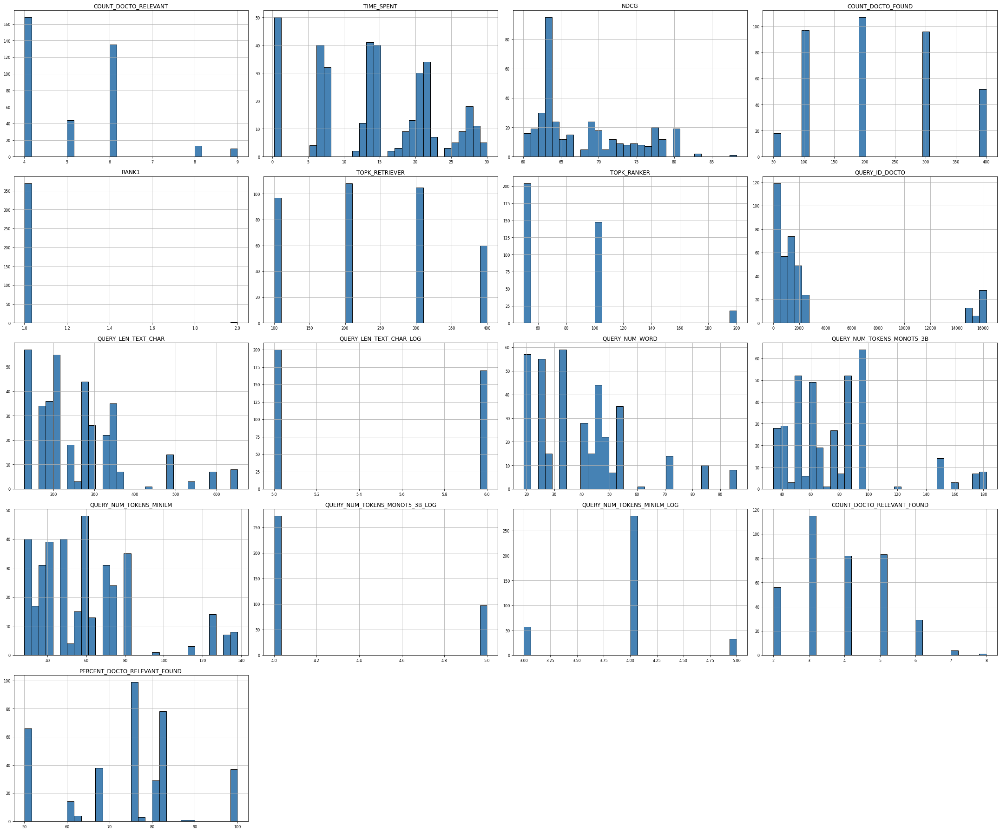

In [ ]:

fig, ax = plt.subplots(1, 1, figsize=(30,25))
ax.set_title('Histogram')
df_top.drop(['QUERY_ID','NDCG_LIMIT'],axis=1).hist(bins=30, color='steelblue', edgecolor='black', linewidth=1.0,
           xlabelsize=8, ylabelsize=8, grid=True, ax=ax)  
plt.tight_layout() 

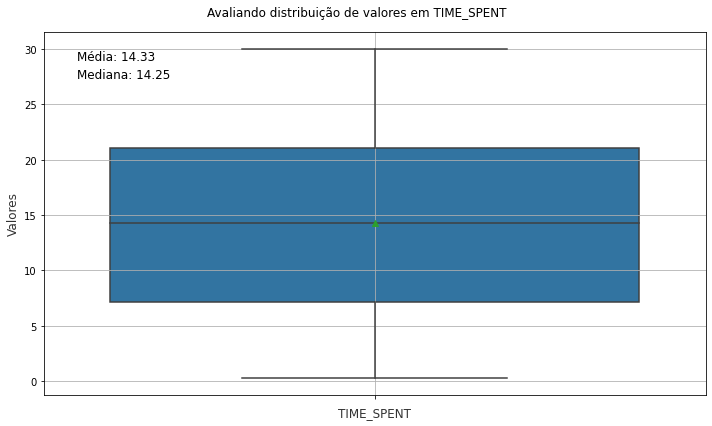

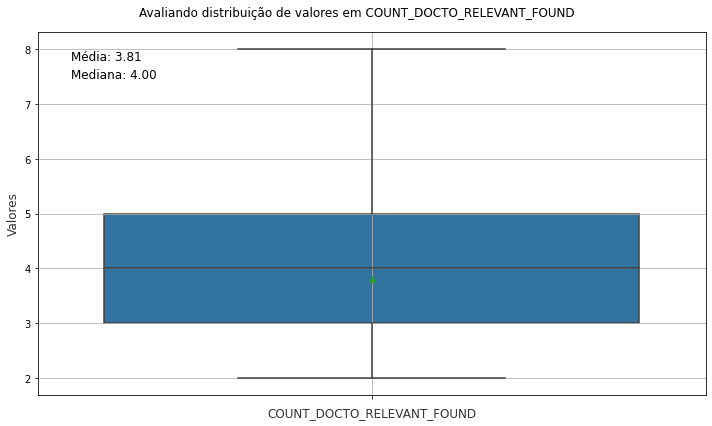

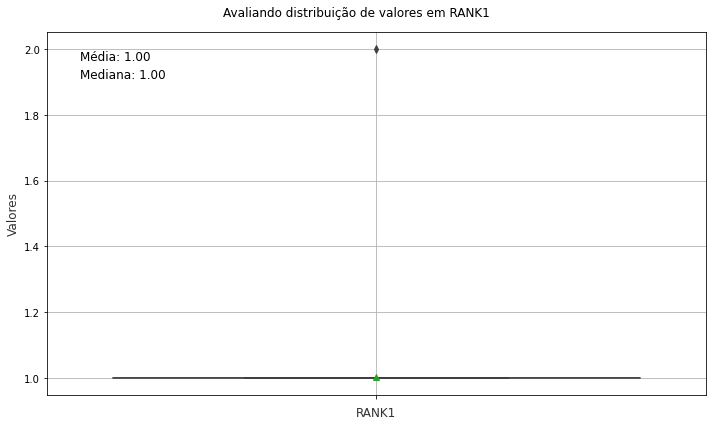

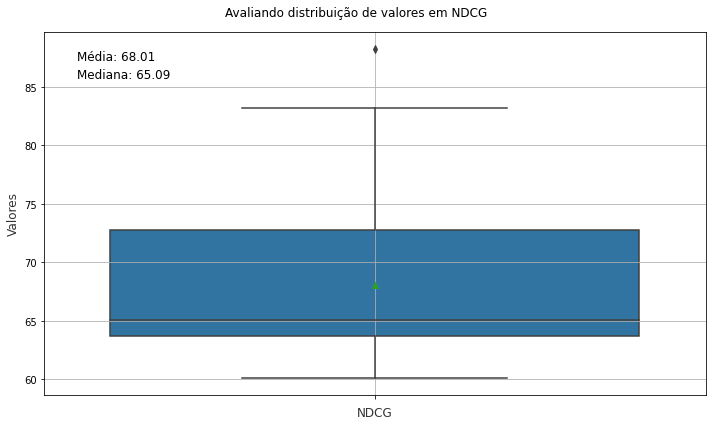

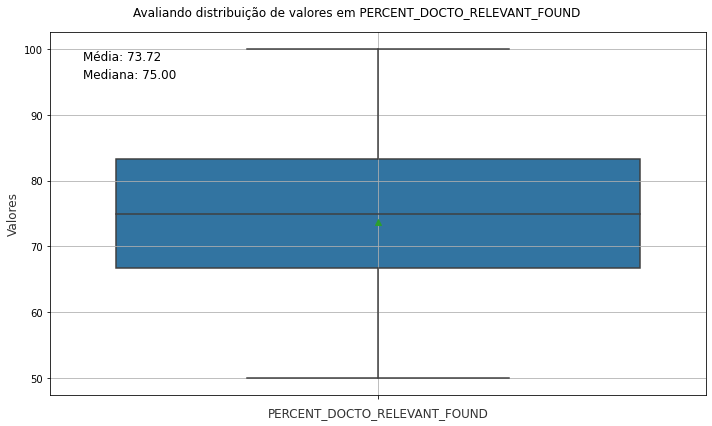

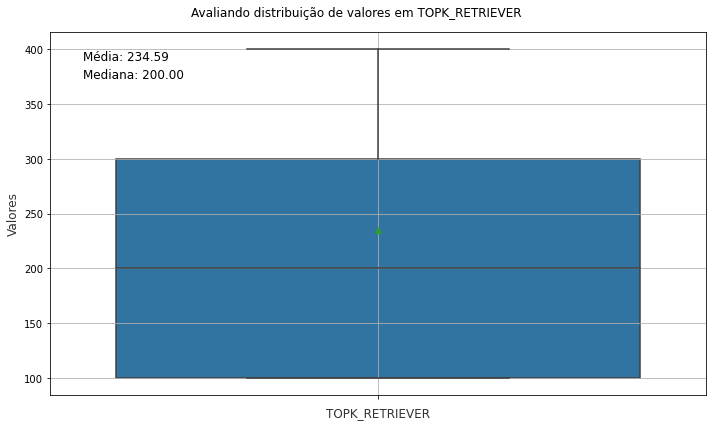

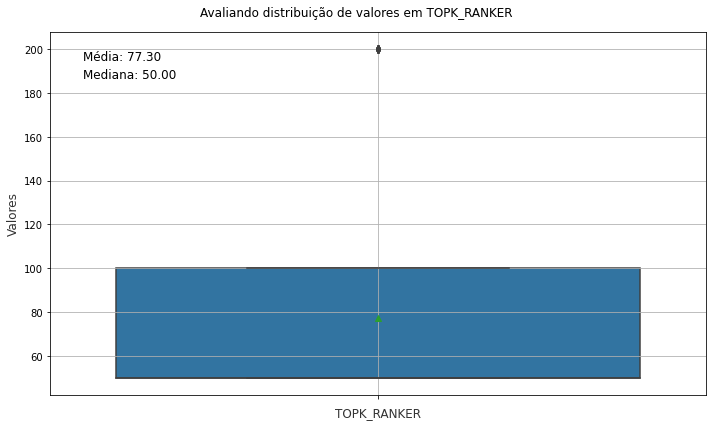

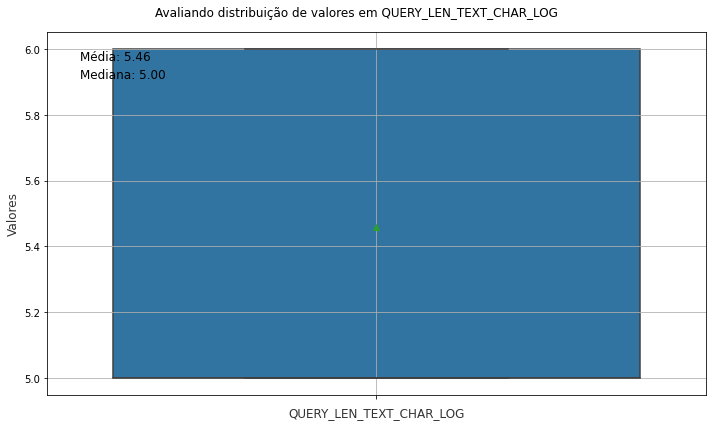

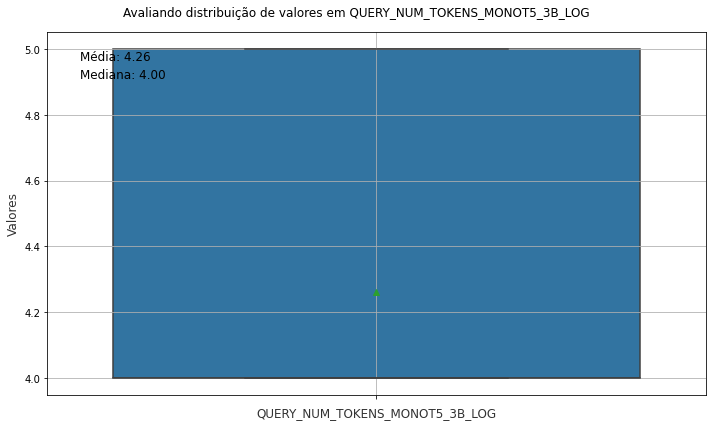

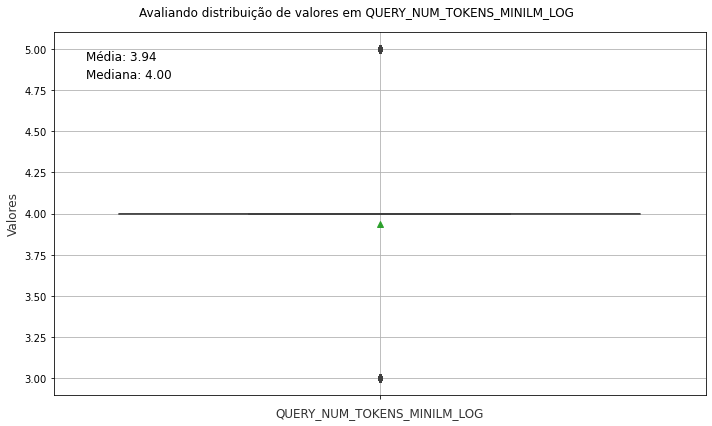

In [ ]:
metrics = {}
for column in ['TIME_SPENT', 'COUNT_DOCTO_RELEVANT_FOUND'] + list_metric + list_category: 
  if df_top[column].dtype != object:
    f, ax = plt.subplots(1, 1, figsize=(10,6))
    f.suptitle(f'Avaliando distribuição de valores em {column}')
    ax = sns.boxplot(y=column, data=df_top, showmeans=True, ax=ax)
    # Gráfico de disperção
    # ax = sns.stripplot(y=column, data=df_top, ax=ax) 

    # Calcula a média e mediana
    mean_val = round(df_top[column].mean(), 3)
    median_val = df_top[column].median()
    metrics[column] = {'media': mean_val, 'mediana':median_val}
    # Imprime a média e mediana no gráfico
    ax.text(0.05, 0.95, f'Média: {mean_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')
    ax.text(0.05, 0.9, f'Mediana: {median_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')

    plt.grid() 
    # sns.boxplot(data=df_top['{column}'], showmeans=True,  ax=ax)
    ax.set_xlabel(f"{column}",size = 12,alpha=0.8)
    ax.set_ylabel("Valores",size = 12,alpha=0.8)
    plt.xticks(rotation=60)
    plt.tight_layout()  
plt.show()

### Category evaluation

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


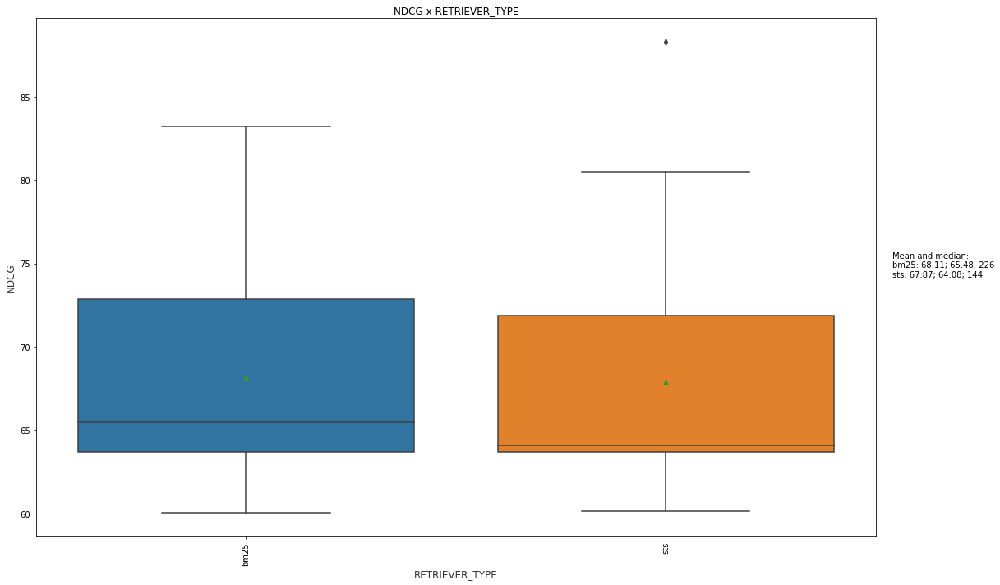

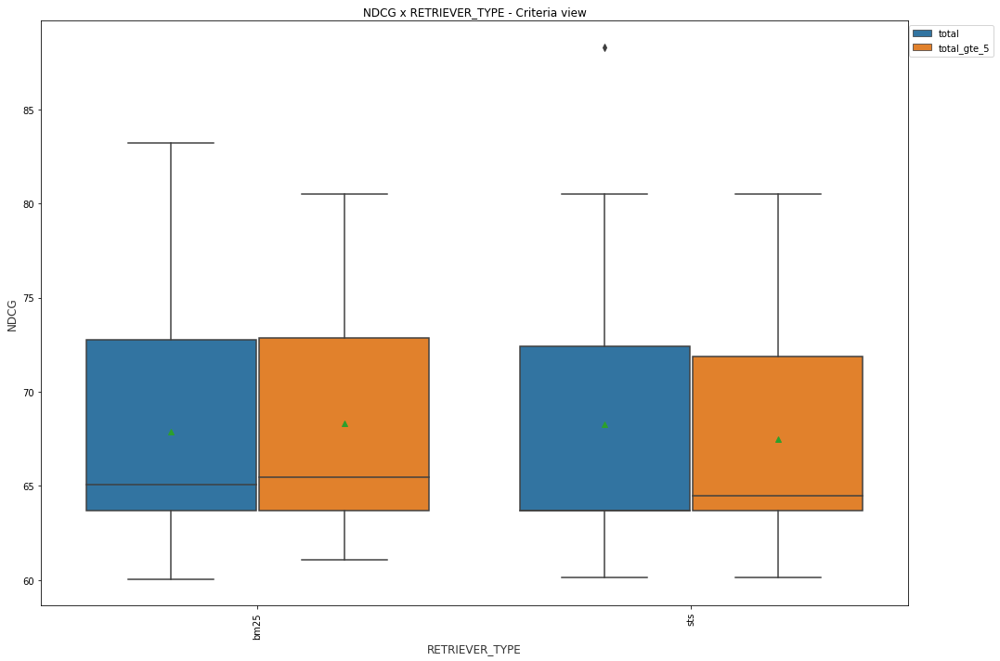

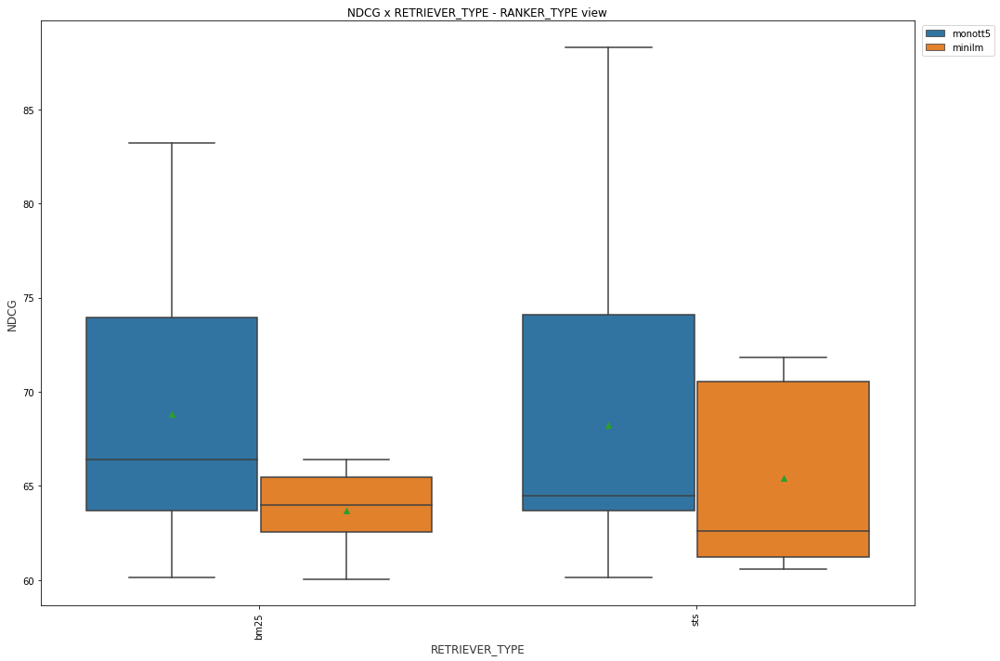

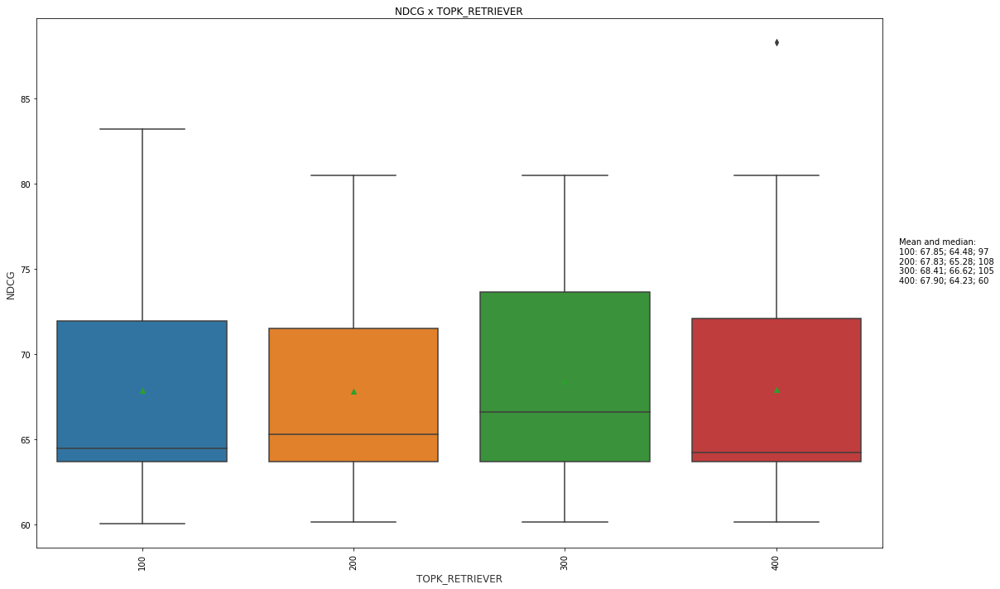

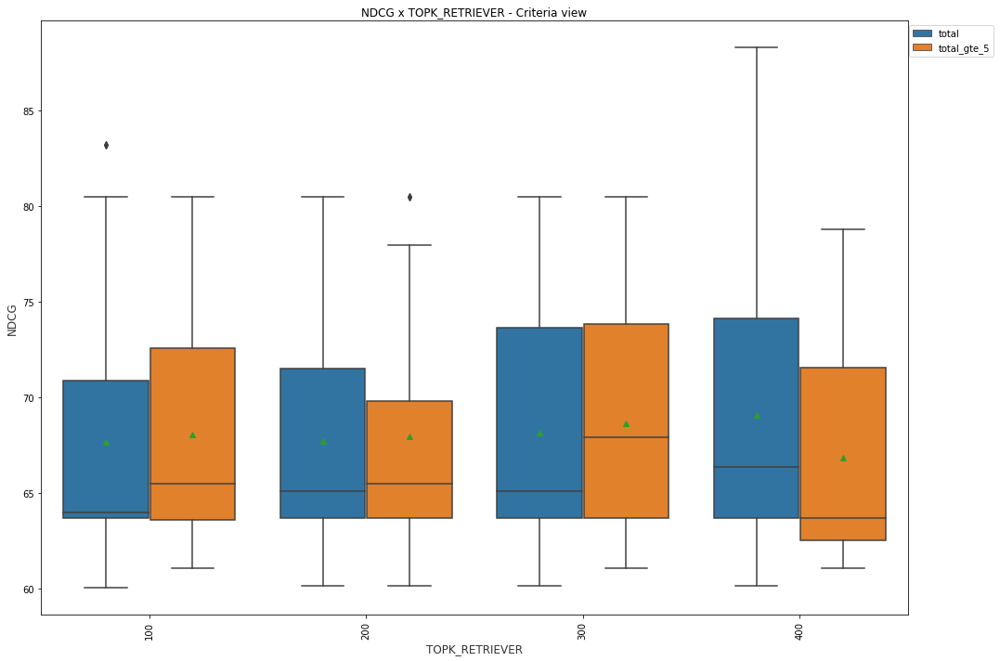

...

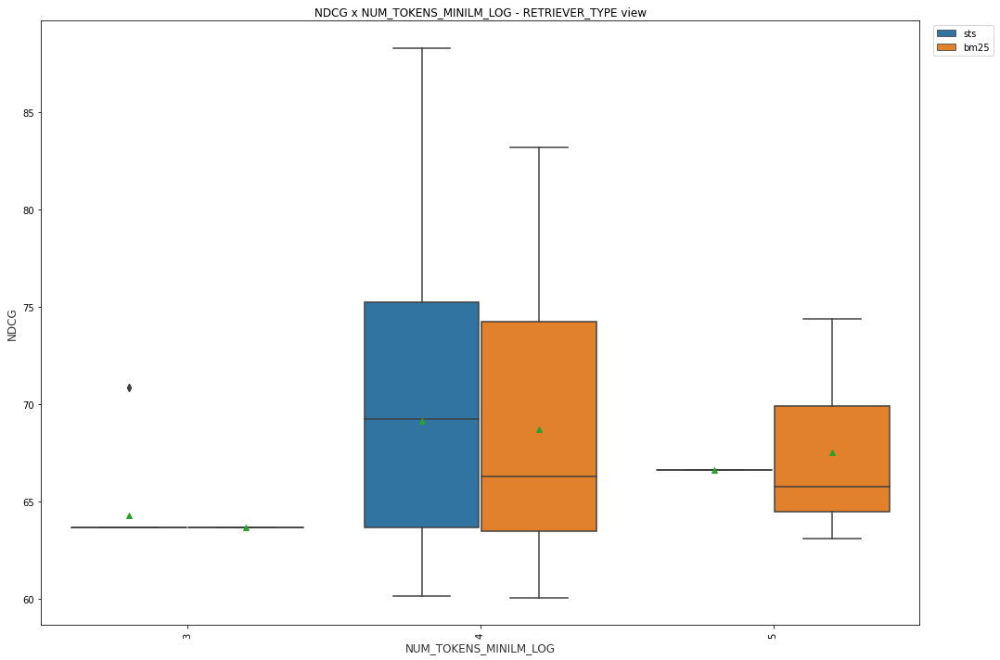

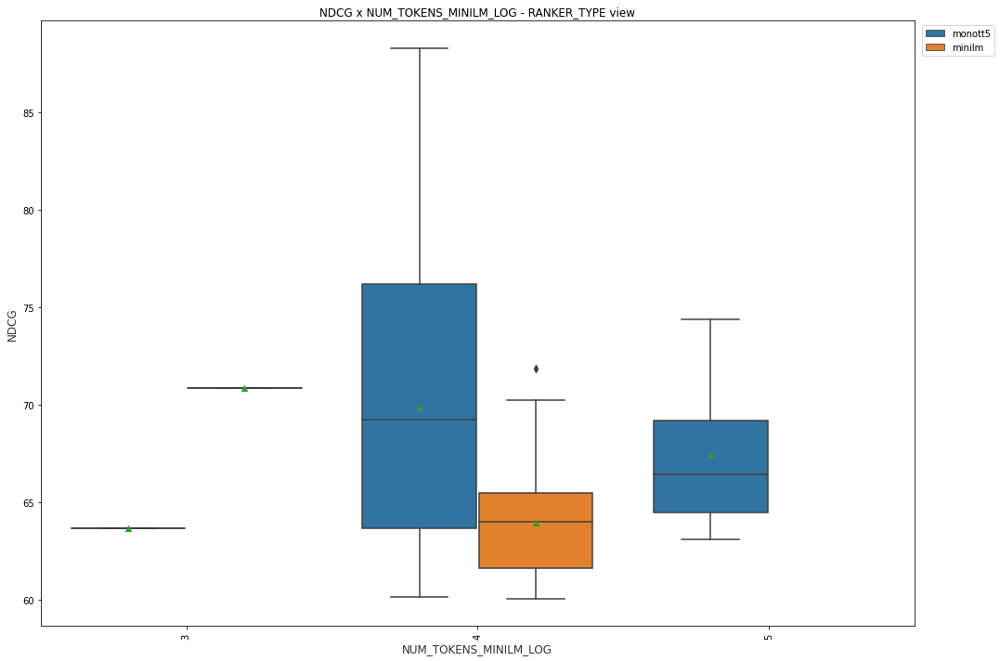

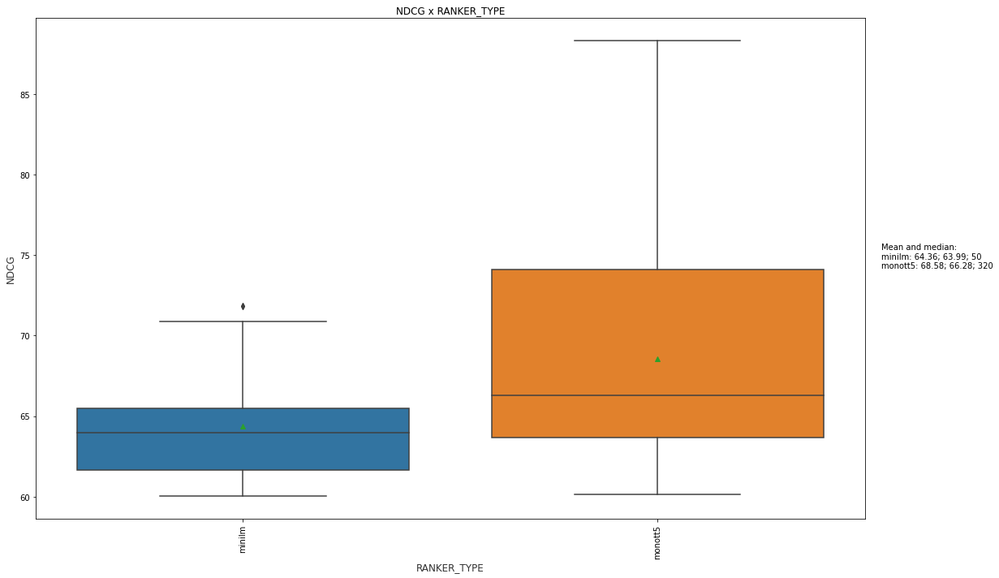

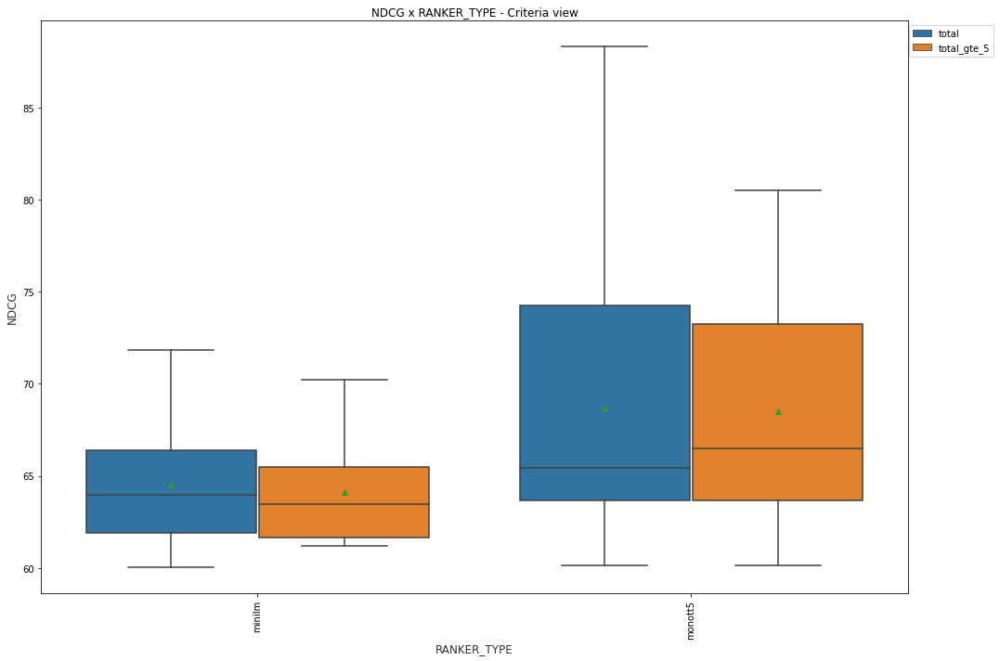

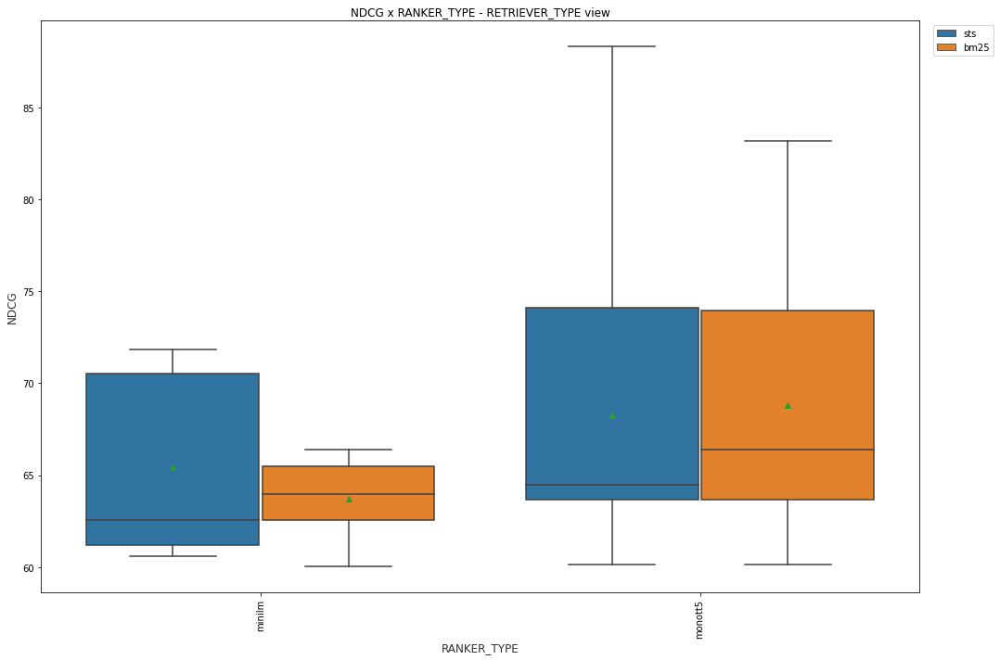

In [ ]:
for context in list_category: 
    for metric in ['NDCG']:
        
        # criar lista com valores únicos da coluna a ser ordenada
        # valores_unicos = sorted(df_top[context].unique())
        
        valores_unicos = sorted(df_top[context].dropna().unique())


        f, ax = plt.subplots(1, 1, figsize=(15,10))
        sns.boxplot(x=context, y=metric, data=df_top, showmeans=True, ax=ax, order=valores_unicos)
        ax.set_xlabel(context,size = 12,alpha=0.8)
        ax.set_ylabel(metric,size = 12,alpha=0.8)
        ax.set_title(f'{metric} x {context}')
        plt.xticks(rotation=90)
        plt.tight_layout()

        # Média e Mediana
        media = df_top.groupby(context)[metric].mean()
        mediana = df_top.groupby(context)[metric].median()
        count = df_top.groupby(context)[metric].count()
        mm_list = [f"{i}: {j:.2f}; {k:.2f}; {l:.0f}" for i,j,k,l in zip(media.index, media, mediana, count)]
        mm_str = "\n".join(mm_list)
        ax.text(1.02, 0.5, f"Mean and median:\n{mm_str}", transform=ax.transAxes)


# Selected configuration

In [75]:
df_result.shape

(11482, 31)

In [18]:
df_result = df_result[(df_result['RANKER_TYPE']=='monot5') & (df_result['CRITERIA'].isin(['area','theme'])) & (df_result['RANKER_MODEL_NAME']=='unicamp-dl/mt5-3B-mmarco-en-pt')]

In [42]:
# df_result = df_result[(df_result['RANKER_TYPE']=='monot5') & (df_result['RANKER_MODEL_NAME']=='unicamp-dl/mt5-3B-mmarco-en-pt') & (df_result['TOPK_RANKER'] == 100)]
df_result = df_result[(df_result['RANKER_TYPE']=='monot5') & (df_result['RANKER_MODEL_NAME']=='unicamp-dl/mt5-3B-mmarco-en-pt')]

In [110]:
# df_result = df_result[(df_result['TOPK_RETRIEVER']==300) & (df_result['RETRIEVER_TYPE']=='bm25') &  (df_result['RANKER_MODEL_NAME']=='unicamp-dl/mt5-3B-mmarco-en-pt') ]
df_result = df_result[(df_result['TOPK_RETRIEVER'].isin([300,600])) & (df_result['COUNT_DOCTO_FOUND']!=10) & (df_result['RANKER_TYPE'].isin(['monot5', 'none']))] #  &  (df_result['RANKER_MODEL_NAME']=='unicamp-dl/mt5-3B-mmarco-en-pt') ]

In [101]:
# df_result = df_result[(df_result['TOPK_RETRIEVER']==300) & (df_result['RETRIEVER_TYPE']=='bm25') &  (df_result['RANKER_MODEL_NAME']=='unicamp-dl/mt5-3B-mmarco-en-pt') ]
df_result = df_result[(df_result['TOPK_RETRIEVER'].isin([300])) & (df_result['RETRIEVER_TYPE']=='join_sts_bm25') & (df_result['COUNT_DOCTO_FOUND']!=10) & (df_result['RANKER_TYPE'].isin(['monot5']))] #  &  (df_result['RANKER_MODEL_NAME']=='unicamp-dl/mt5-3B-mmarco-en-pt') ]

In [42]:
# df_result = df_result[df_result['RETRIEVER_TYPE']== 'join_sts_bm25']

In [109]:
df_result['RETRIEVER_TYPE'].unique()

array(['bm25', 'sts', 'sts_multihop', 'join_sts_multihop_bm25',
       'join_sts_bm25'], dtype=object)

In [19]:
df_result.shape

(1300, 33)

## Separate found x not found

In [89]:
df_not_found = df_result[df_result['RANK1']==0]

In [90]:
df_not_found.shape

(0, 31)

In [91]:
df_result = df_result[df_result['RANK1']>0]

In [92]:
df_result.shape

(349, 31)

In [93]:
del df_not_found['RANK1']

## Some consolidated data

In [90]:
df_result.groupby(['TOPK_RETRIEVER','RANKER_TYPE','RETRIEVER_TYPE','CRITERIA']).agg(dict_metrics)

RANK1              \
                                                      count        mean   
TOPK_RETRIEVER RANKER_TYPE RETRIEVER_TYPE CRITERIA                        
100            minilm      bm25           total         300    7.773333   
                                          total_gte_5   300    6.610000   
                           sts            total         300    7.266667   
                                          total_gte_5   300    5.433333   
               monot5      bm25           total         200    2.870000   
...                                                     ...         ...   
600            none        join_sts_bm25  extra          98  106.214286   
                                          subtheme      100  103.970000   
                                          theme         100   55.600000   
                                          total         100   59.380000   
                                          total_gte_5   100    3.470000   

                                                              NDCG             \
                                                      median count       mean   
TOPK_RETRIEVER RANKER_TYPE RETRIEVER_TYPE CRITERIA                              
100            minilm      bm25           total          2.0   300  24.615900   
                                          total_gte_5    2.0   300  25.978700   
                           sts            total          2.0   300  21.227900   
                                          total_gte_5    2.0   300  23.582200   
               monot5      bm25           total          1.0   200  38.850500   
...                                                      ...   ...        ...   
600            none        join_sts_bm25  extra         53.0    98   6.239898   
                                          subtheme      45.5   100   7.911200   
                                          theme         27.0   100  17.263300   
                                          total         28.0   100   6.829300   
                                          total_gte_5    3.0   100  21.538400   

                                                               \
                                                       median   
TOPK_RETRIEVER RANKER_TYPE RETRIEVER_TYPE CRITERIA              
100            minilm      bm25           total        26.390   
                                          total_gte_5  27.490   
                           sts            total        16.265   
                                          total_gte_5  21.705   
               monot5      bm25           total        41.530   
...                                                       ...   
600            none        join_sts_bm25  extra         0.000   
                                          subtheme      0.000   
                                          theme         0.000   
                                          total         0.000   
                                          total_gte_5  17.340   

                                                      PERCENT_DOCTO_RELEVANT_FOUND  \
                                                                             count   
TOPK_RETRIEVER RANKER_TYPE RETRIEVER_TYPE CRITERIA                                   
100            minilm      bm25           total                                300   
                                          total_gte_5                          300   
                           sts            total                                300   
                                          total_gte_5                          300   
               monot5      bm25           total                                200   
...                                                                            ...   
600            none        join_sts_bm25  extra                                 98   
                                          subtheme                             100   
           

In [91]:
df_result.groupby(['CRITERIA']).count()

,TIME,TIME_SPENT,NDCG,RANK1,COUNT_DOCTO_FOUND,LIST_RANK,COUNT_DOCTO_RELEVANT,GROUND_TRUTH,LIST_DOCTO_RETURNED,RETRIEVER_TYPE,...,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND,RANKER_TYPE
CRITERIA,,,,,,,,,,,,,,,,,,,,,
area,1500,1500,1500,1500,1500,1500,1500,1500,1500,1500,...,1500,1500,1500,1500,1500,1500,1500,1500,1500,1500
class_termo,100,100,100,100,100,100,100,0,100,100,...,100,100,100,100,100,100,100,100,100,100
extra,1276,1276,1276,1276,1276,1276,1276,1262,1276,1276,...,1276,1276,1276,1276,1276,1276,1276,1276,1262,1276
subtheme,1300,1300,1300,1300,1300,1300,1300,1269,1300,1300,...,1300,1300,1300,1300,1300,1300,1300,1300,1269,1300
theme,1400,1400,1400,1400,1400,1400,1400,1392,1400,1400,...,1400,1400,1400,1400,1400,1400,1400,1400,1392,1400
total,5100,5100,5100,5100,5100,5100,5100,1299,5100,5100,...,5100,5100,5100,5100,5100,5100,5100,5100,5099,5100
total_gte_5,4900,4900,4900,4900,4900,4900,4900,1300,4900,4900,...,4900,4900,4900,4900,4900,4900,4900,4900,4900,4900


In [92]:
df_result.groupby(['CRITERIA','RANKER_TYPE', 'RETRIEVER_TYPE']).agg(dict_metrics).dropna()

RANK1                NDCG  \
                                               count   mean median count   
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                                     
area        monot5      bm25                     300  3.750    2.0   300   
                        join_sts_bm25            200  3.750    2.0   200   
                        join_sts_multihop_bm25   100  3.750    2.0   100   
                        sts                      100  3.750    2.0   100   
                        sts_multihop             100  3.750    2.0   100   
...                                              ...    ...    ...   ...   
total_gte_5 none        bm25                     200  5.255    5.0   200   
                        join_sts_bm25            200  3.470    3.0   200   
                        join_sts_multihop_bm25   100  4.130    3.5   100   
                        sts                      100  3.470    3.0   100   
                        sts_multihop             100  4.130    3.5   100   

                                                                  \
                                                    mean  median   
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                             
area        monot5      bm25                    62.09370  63.090   
                        join_sts_bm25           62.09370  63.090   
                        join_sts_multihop_bm25  62.09370  63.090   
                        sts                     62.09370  63.090   
                        sts_multihop            62.09370  63.090   
...                                                  ...     ...   
total_gte_5 none        bm25                    17.64025  13.430   
                        join_sts_bm25           21.53840  17.340   
                        join_sts_multihop_bm25  20.46060  16.765   
                        sts                     21.53840  17.340   
                        sts_multihop            20.46060  16.765   

                                               PERCENT_DOCTO_RELEVANT_FOUND  \
                                                                      count   
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                                        
area        monot5      bm25                                            300   
                        join_sts_bm25                                   200   
                        join_sts_multihop_bm25                          100   
                        sts                                             100   
                        sts_multihop                                    100   
...                                                                     ...   
total_gte_5 none        bm25                                            200   
                        join_sts_bm25                                   200   
                        join_sts_multihop_bm25                          100   
                        sts                                             100   
                        sts_multihop                                    100   

                                                                   
                                                    mean   median  
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                             
area        monot5      bm25                    100.0000  100.000  
                        join_sts_bm25           100.0000  100.000  
                        join_sts_multihop_bm25  100.0000  100.000  
                        sts                     100.0000  100.000  
                        sts_multihop            100.0000  100.000  
...                                                  ...      ...  
total_gte_5 none        bm25                     20.1401   18.335  
                        join_sts_bm25            20.1401   18.335  
                        join_sts_multihop_bm25   20.1401   18.335  
                        sts                      20.1401   18.335  
                        sts_multihop  

In [93]:
df_result.groupby([ 'RANKER_TYPE', 'CRITERIA', 'RETRIEVER_TYPE', 'TOPK_RETRIEVER']).agg({'TIME_SPENT':['count', 'mean', 'median'], 'COUNT_DOCTO_FOUND':['count', 'mean', 'median']})

TIME_SPENT  \
                                                                   count   
RANKER_TYPE CRITERIA    RETRIEVER_TYPE         TOPK_RETRIEVER              
minilm      total       bm25                   100                   300   
                                               200                   300   
                                               300                   300   
                                               400                   200   
                        sts                    100                   300   
...                                                                  ...   
none        total_gte_5 join_sts_bm25          300                   100   
                                               600                   100   
                        join_sts_multihop_bm25 300                   100   
                        sts                    300                   100   
                        sts_multihop           300                   100   

                                                                         \
                                                                   mean   
RANKER_TYPE CRITERIA    RETRIEVER_TYPE         TOPK_RETRIEVER             
minilm      total       bm25                   100             0.278785   
                                               200             0.545415   
                                               300             0.810441   
                                               400             1.080473   
                        sts                    100             0.290945   
...                                                                 ...   
none        total_gte_5 join_sts_bm25          300             0.031935   
                                               600             0.041990   
                        join_sts_multihop_bm25 300             0.061663   
                        sts                    300             0.023574   
                        sts_multihop           300             0.052415   

                                                                        \
                                                                median   
RANKER_TYPE CRITERIA    RETRIEVER_TYPE         TOPK_RETRIEVER            
minilm      total       bm25                   100             0.27870   
                                               200             0.54385   
                                               300             0.80690   
                                               400             1.07515   
                        sts                    100             0.29235   
...                                                                ...   
none        total_gte_5 join_sts_bm25          300             0.03170   
                                               600             0.04180   
                        join_sts_multihop_bm25 300             0.06240   
                        sts                    300             0.02340   
                        sts_multihop           300             0.05400   

                                                              COUNT_DOCTO_FOUND  \
                                                                          count   
RANKER_TYPE CRITERIA    RETRIEVER_TYPE         TOPK_RETRIEVER                     
minilm      total       bm25                   100                          300   
                                               200                          300   
                                               300                          300   
                                               400                          200   
                        sts                    100                          300   
...                                                                         ...   
none        total_gte_5 join_sts_bm25          300                          100   
                                               600                          100

In [94]:
df_result.groupby(['CRITERIA','RANKER_TYPE', 'RETRIEVER_TYPE']).agg(dict_metrics).dropna()

RANK1                NDCG  \
                                               count   mean median count   
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                                     
area        monot5      bm25                     300  3.750    2.0   300   
                        join_sts_bm25            200  3.750    2.0   200   
                        join_sts_multihop_bm25   100  3.750    2.0   100   
                        sts                      100  3.750    2.0   100   
                        sts_multihop             100  3.750    2.0   100   
...                                              ...    ...    ...   ...   
total_gte_5 none        bm25                     200  5.255    5.0   200   
                        join_sts_bm25            200  3.470    3.0   200   
                        join_sts_multihop_bm25   100  4.130    3.5   100   
                        sts                      100  3.470    3.0   100   
                        sts_multihop             100  4.130    3.5   100   

                                                                  \
                                                    mean  median   
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                             
area        monot5      bm25                    62.09370  63.090   
                        join_sts_bm25           62.09370  63.090   
                        join_sts_multihop_bm25  62.09370  63.090   
                        sts                     62.09370  63.090   
                        sts_multihop            62.09370  63.090   
...                                                  ...     ...   
total_gte_5 none        bm25                    17.64025  13.430   
                        join_sts_bm25           21.53840  17.340   
                        join_sts_multihop_bm25  20.46060  16.765   
                        sts                     21.53840  17.340   
                        sts_multihop            20.46060  16.765   

                                               PERCENT_DOCTO_RELEVANT_FOUND  \
                                                                      count   
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                                        
area        monot5      bm25                                            300   
                        join_sts_bm25                                   200   
                        join_sts_multihop_bm25                          100   
                        sts                                             100   
                        sts_multihop                                    100   
...                                                                     ...   
total_gte_5 none        bm25                                            200   
                        join_sts_bm25                                   200   
                        join_sts_multihop_bm25                          100   
                        sts                                             100   
                        sts_multihop                                    100   

                                                                   
                                                    mean   median  
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                             
area        monot5      bm25                    100.0000  100.000  
                        join_sts_bm25           100.0000  100.000  
                        join_sts_multihop_bm25  100.0000  100.000  
                        sts                     100.0000  100.000  
                        sts_multihop            100.0000  100.000  
...                                                  ...      ...  
total_gte_5 none        bm25                     20.1401   18.335  
                        join_sts_bm25            20.1401   18.335  
                        join_sts_multihop_bm25   20.1401   18.335  
                        sts                      20.1401   18.335  
                        sts_multihop  

In [95]:
df_not_found.groupby(['CRITERIA','RETRIEVER_TYPE','RANKER_TYPE']).agg({'COUNT_DOCTO_RELEVANT': ['count','mean','median']})

NameError: name 'df_not_found' is not defined

## Found x Not found

NameError: name 'df_not_found' is not defined

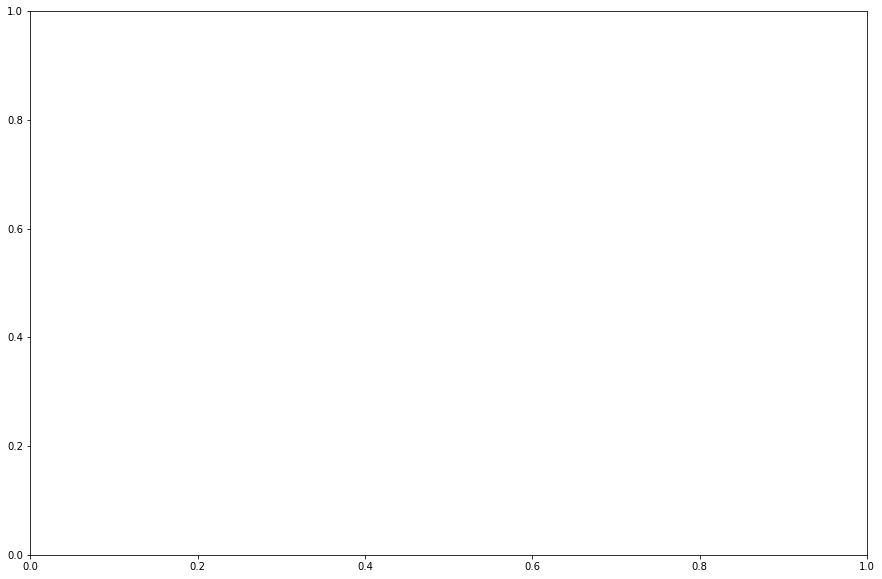

In [96]:
for coluna in list_category:
    f, ax = plt.subplots(1, 1, figsize=(15,10))
    plt.hist([df_result.sort_values(by=coluna)[coluna].dropna(), df_not_found.sort_values(by=coluna)[coluna].dropna()], color=['blue', 'green'], label=['found', 'not found'], stacked=True, bins=50)


    plt.legend()
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Stacked histogram {coluna}: found x not found')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

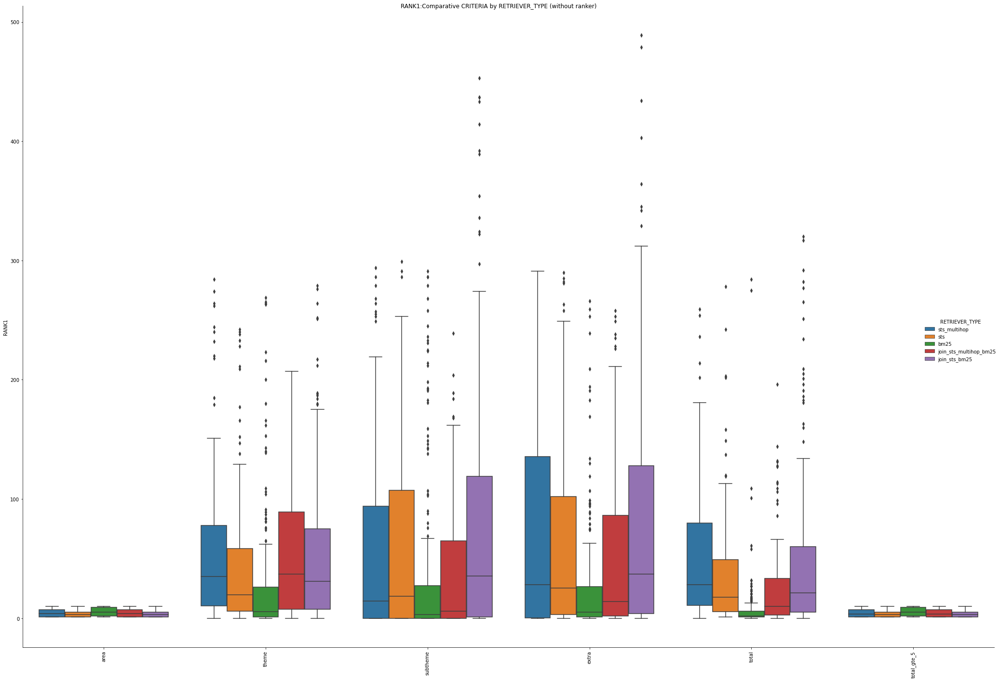

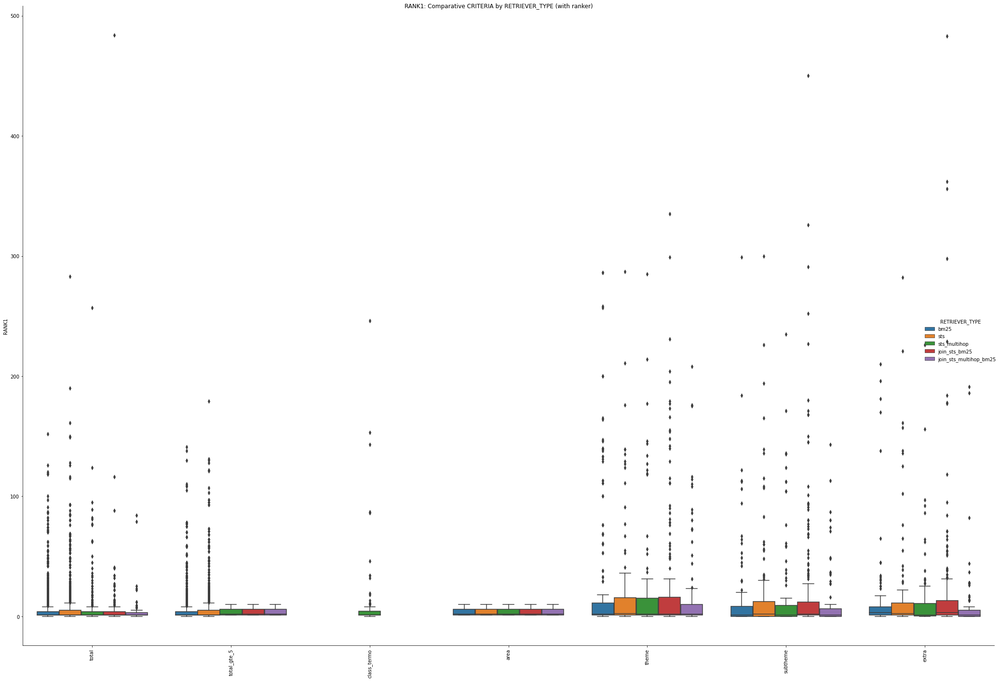

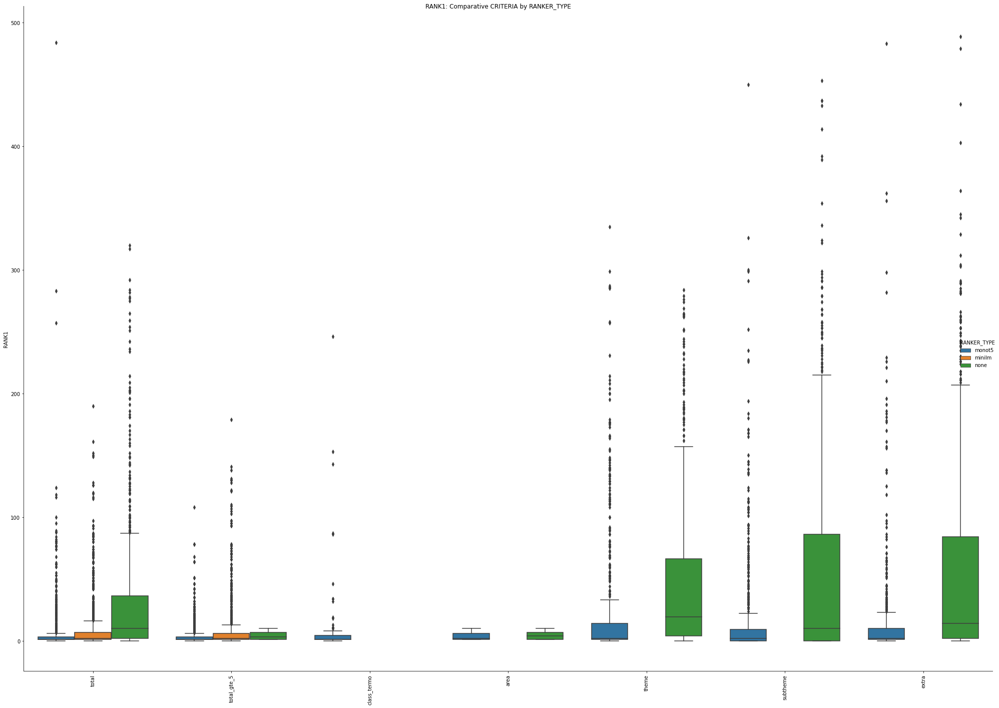

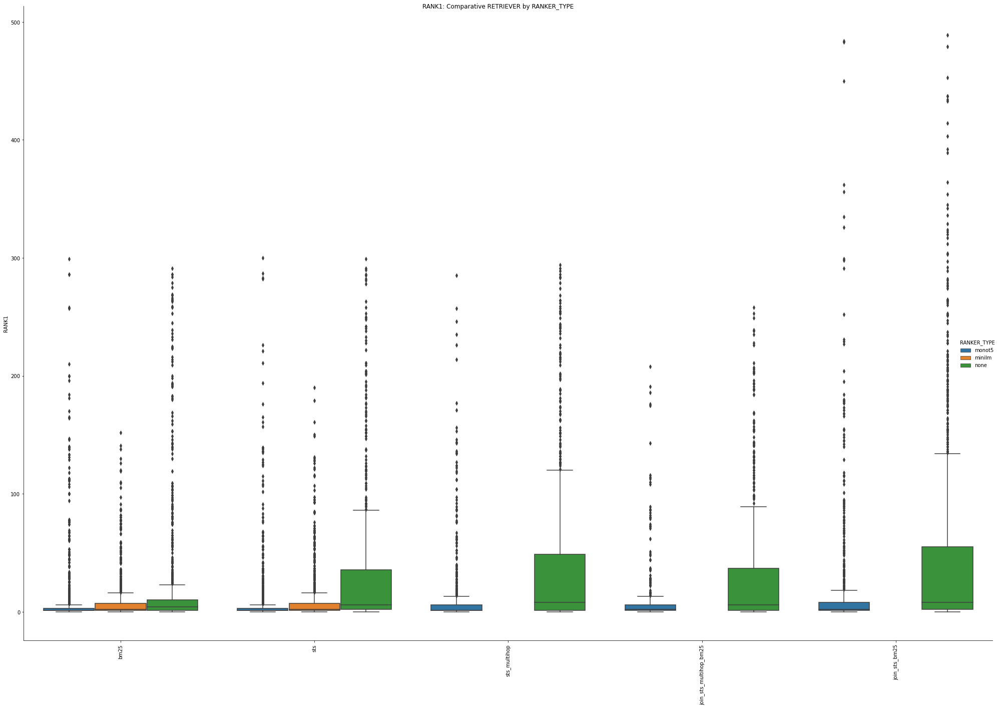

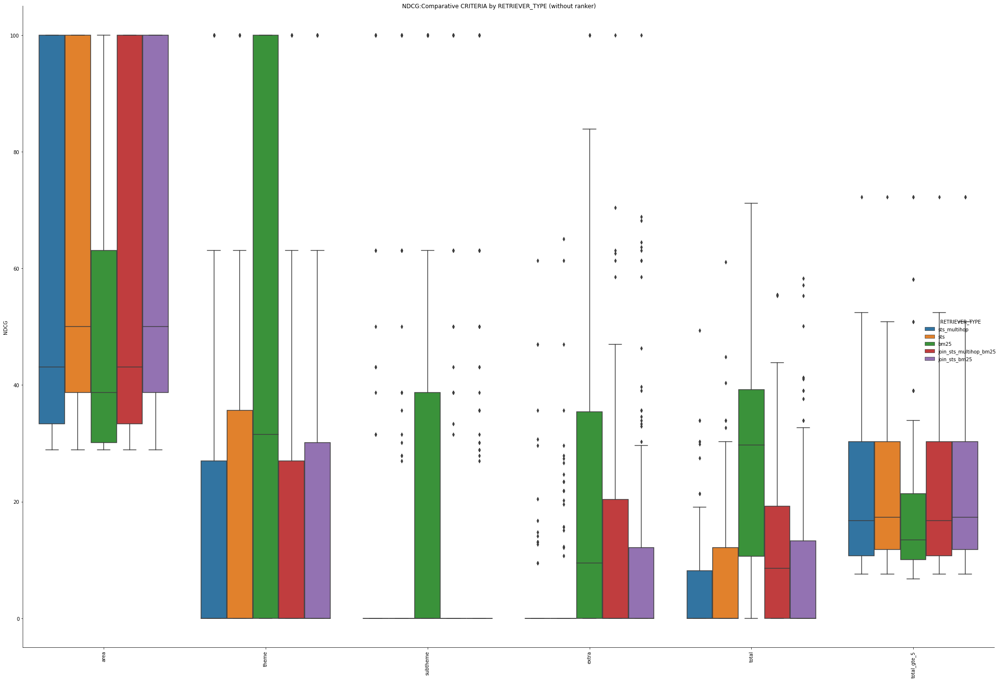

...

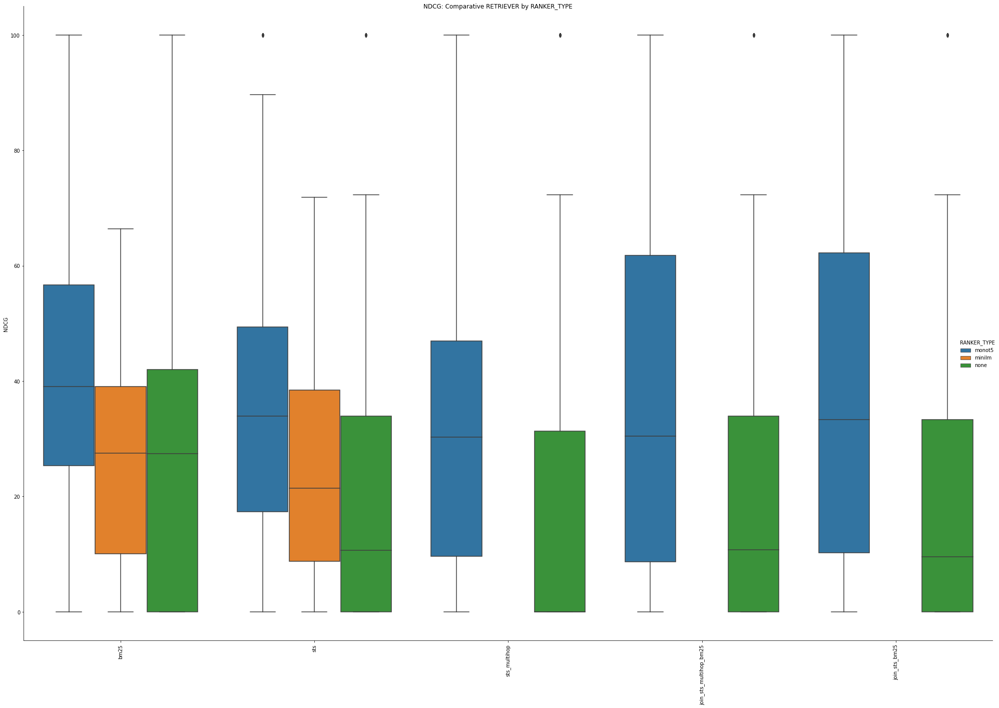

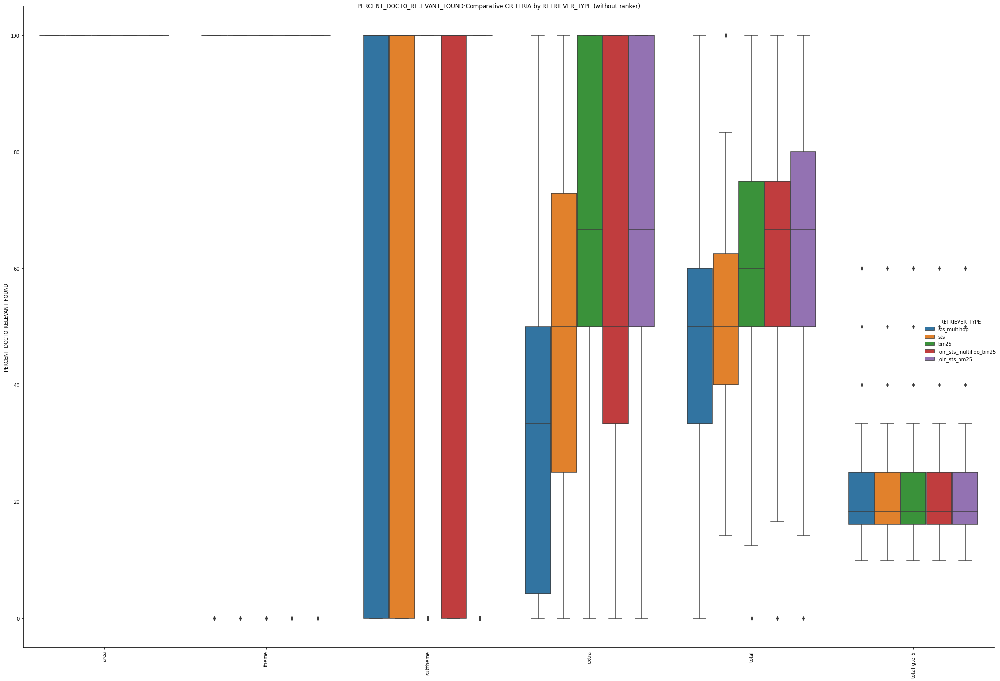

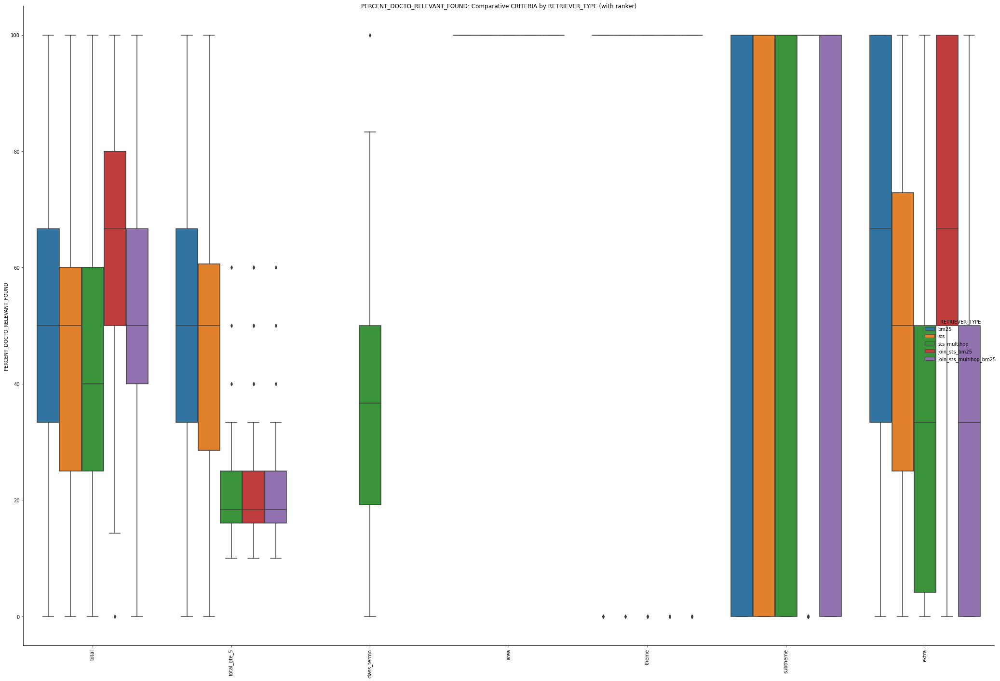

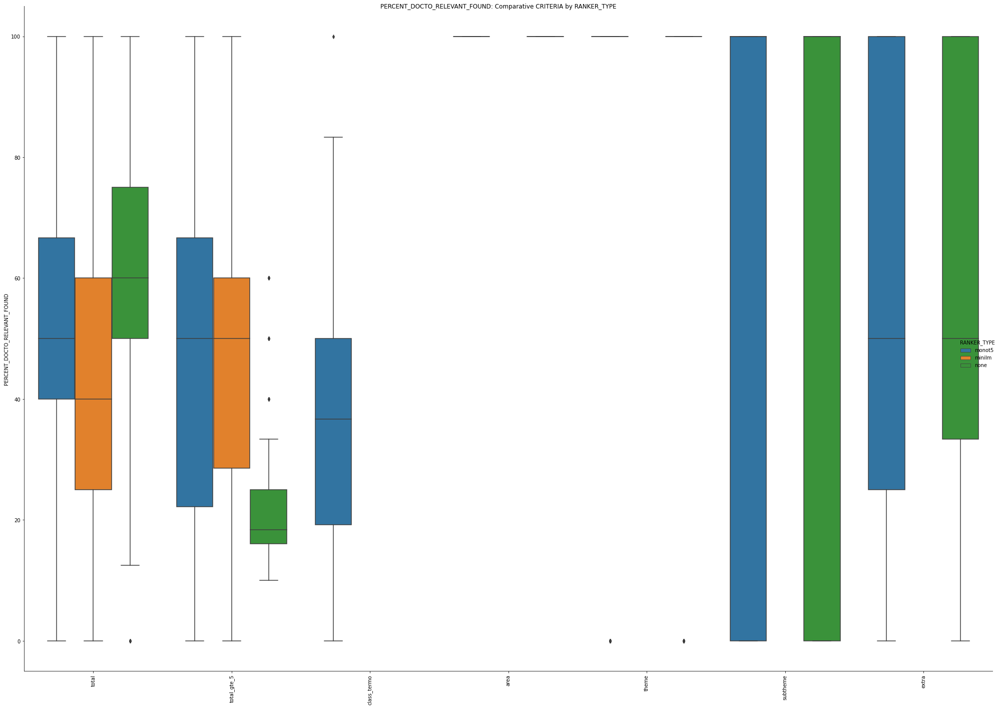

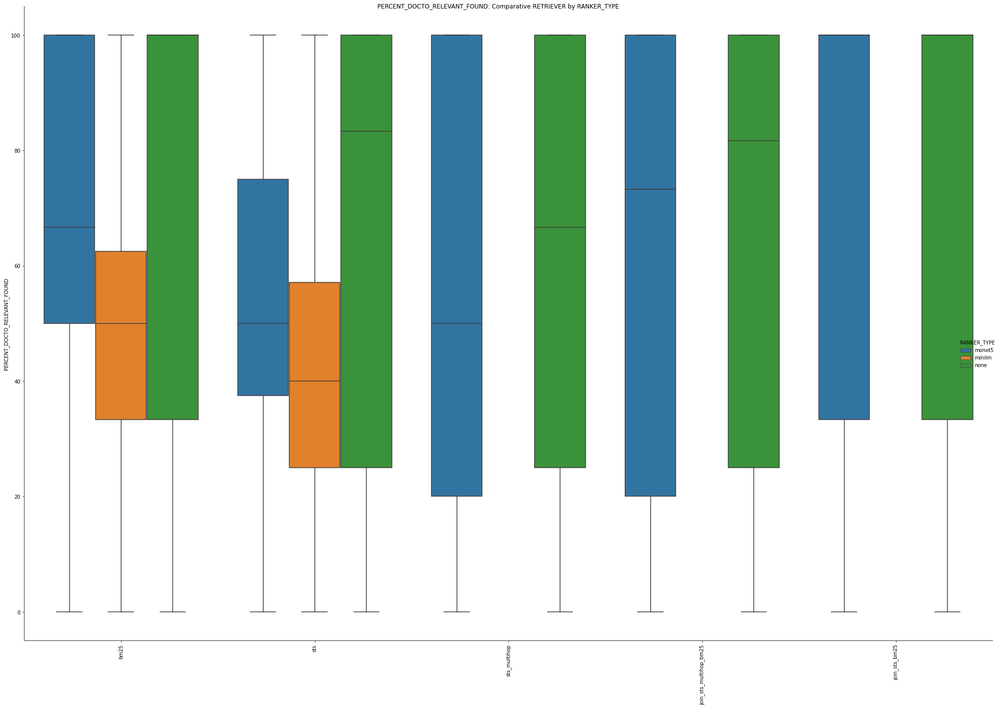

In [97]:
for metric in list_metric:
    g = sns.catplot(x="CRITERIA", sharex=True, y=metric, hue="RETRIEVER_TYPE",
                    kind="box", data=df_result[df_result['RANKER_TYPE']=='none'], height=20, aspect=20/15) # row="CLASSE", 
    g.fig.suptitle(f'{metric}:Comparative CRITERIA by RETRIEVER_TYPE (without ranker)')
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
    plt.show()

    g = sns.catplot(x="CRITERIA", sharex=True, y=metric, hue="RETRIEVER_TYPE",
                    kind="box", data=df_result[df_result['RANKER_TYPE']!='none'], height=20, aspect=20/15) # row="CLASSE", 
    g.fig.suptitle(f'{metric}: Comparative CRITERIA by RETRIEVER_TYPE (with ranker)')
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
    plt.show()    

    g = sns.catplot(x="CRITERIA", sharex=True, y=metric, hue="RANKER_TYPE",
                    kind="box", data=df_result, height=20, aspect=20/15) # row="CLASSE", 
    g.fig.suptitle(f'{metric}: Comparative CRITERIA by RANKER_TYPE')
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
    plt.show()      

    g = sns.catplot(x="RETRIEVER_TYPE", sharex=True, y=metric, hue="RANKER_TYPE",
                    kind="box", data=df_result, height=20, aspect=20/15) # row="CLASSE", 
    g.fig.suptitle(f'{metric}: Comparative RETRIEVER by RANKER_TYPE')
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
    plt.show()        

        Conclusão:
        usar ranker
        join com bm25: 300 e sts:300  (topk_retriever=600)

## Category evaluation

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


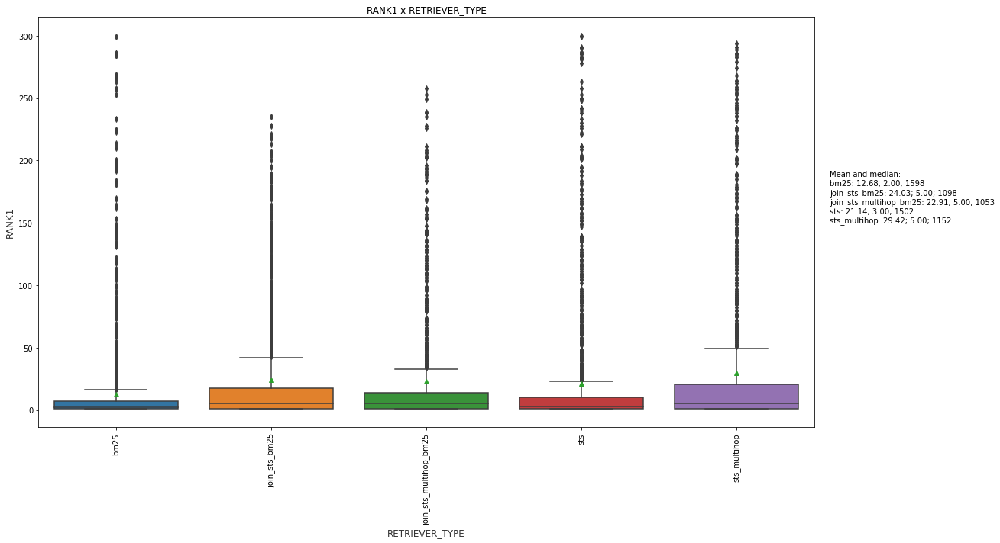

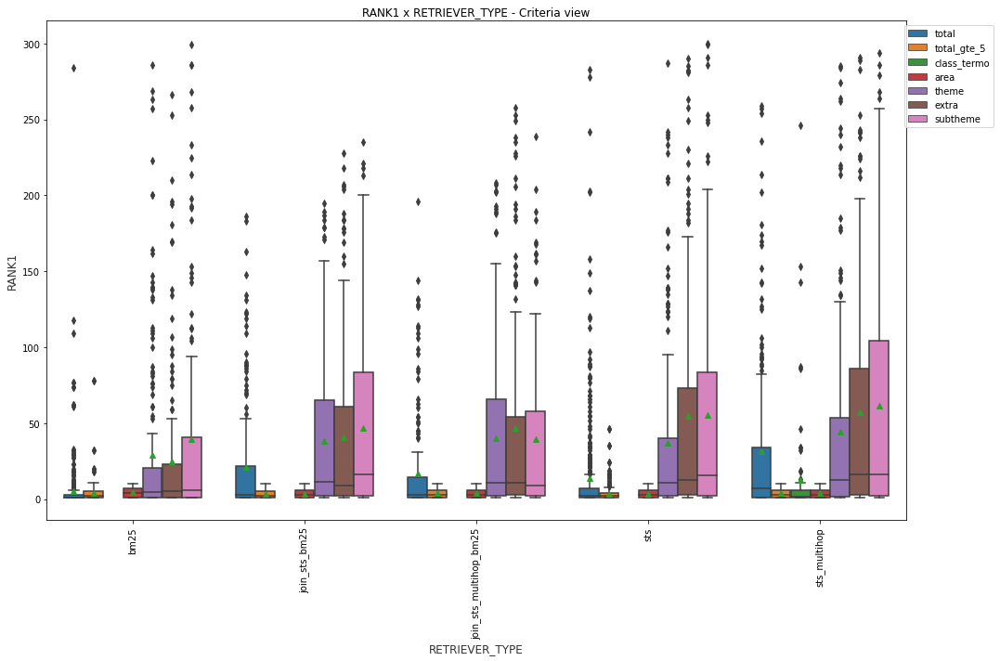

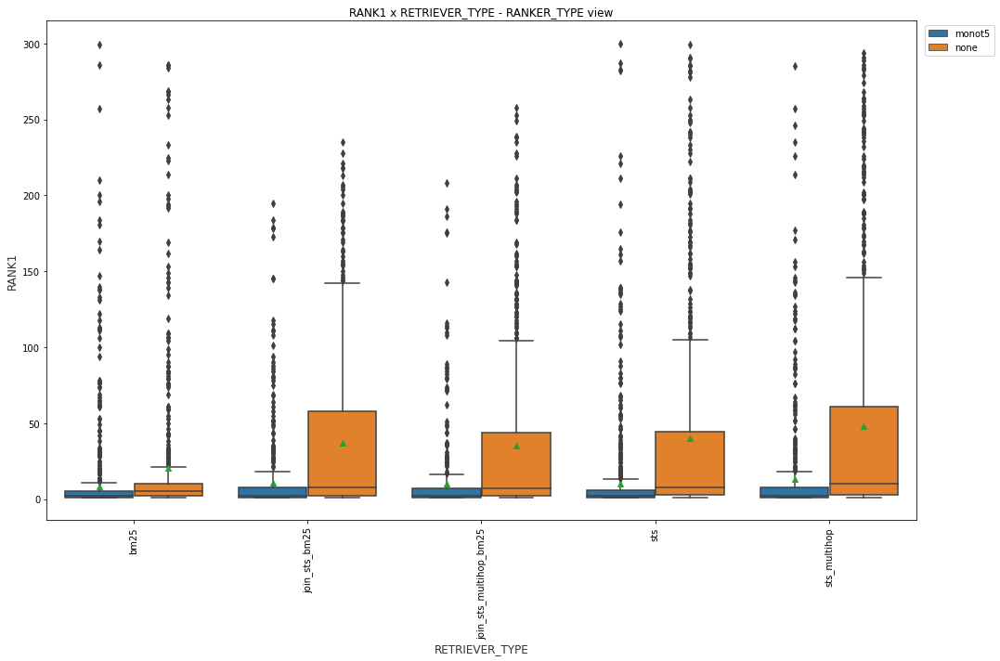

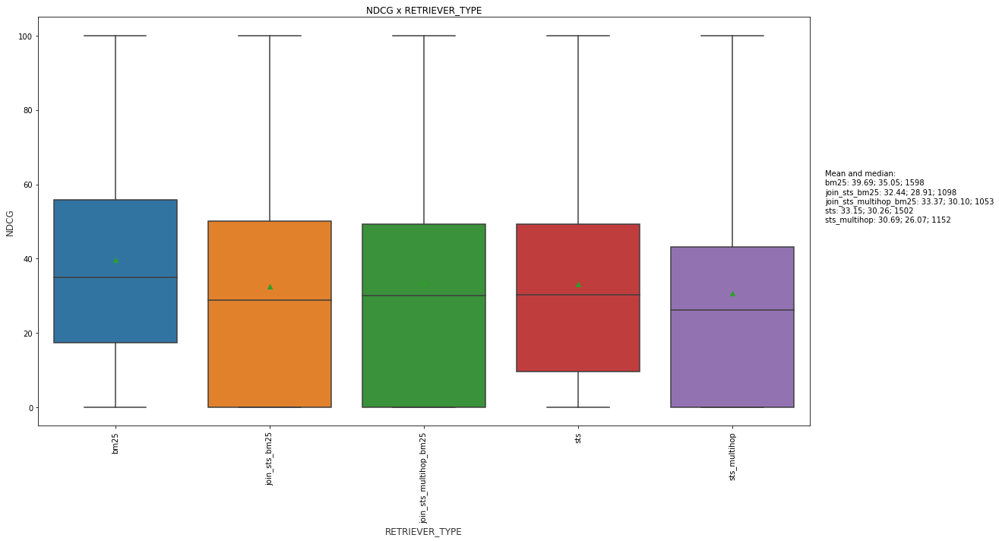

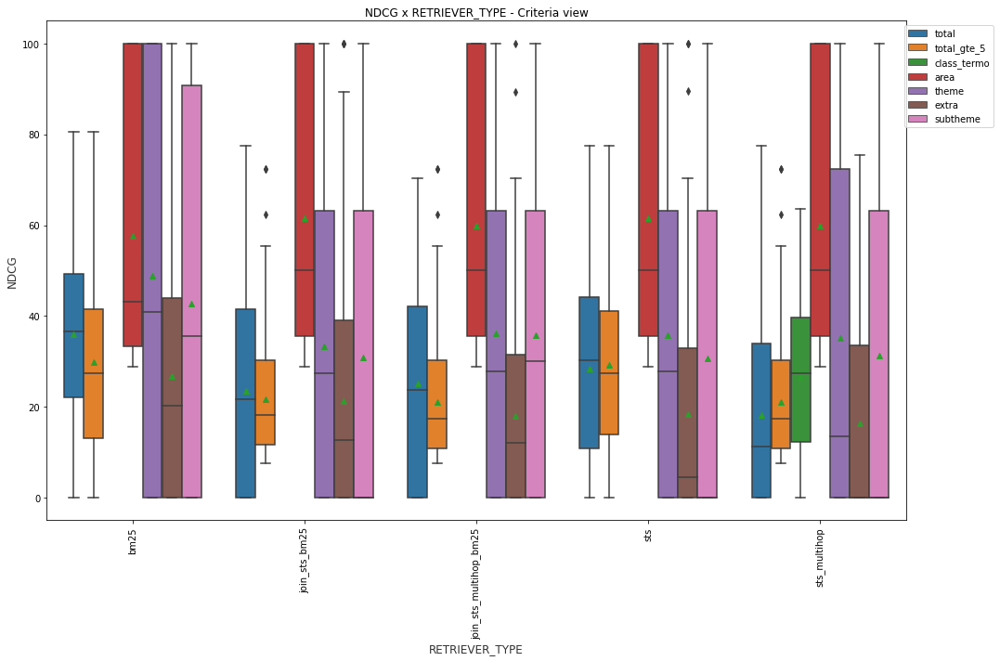

...

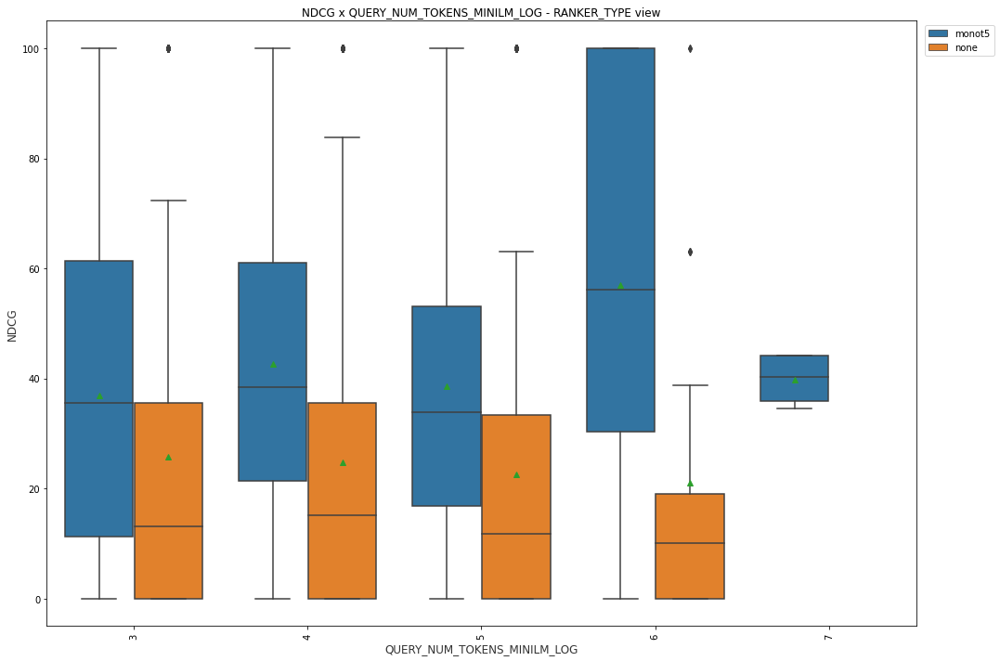

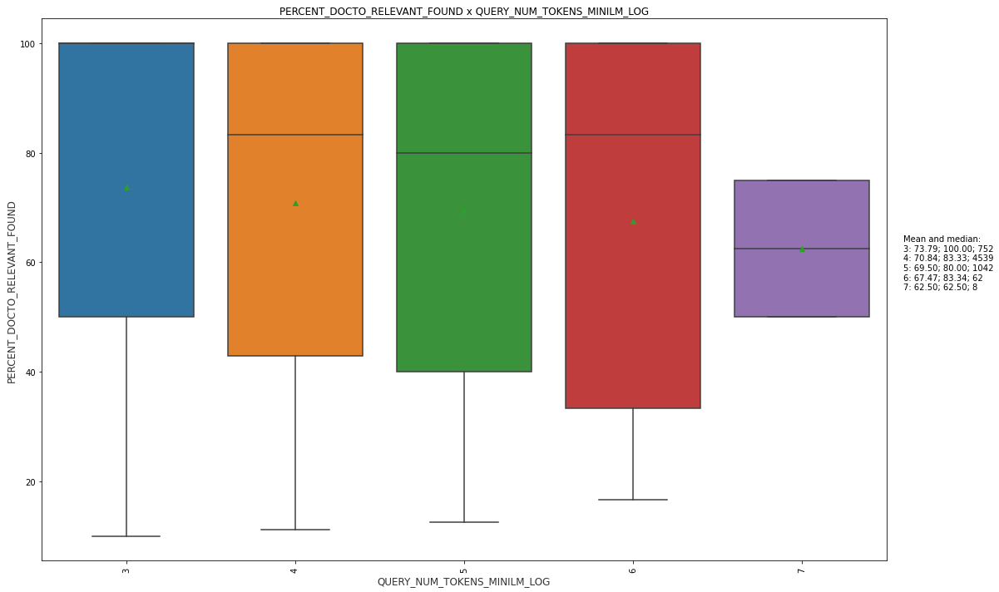

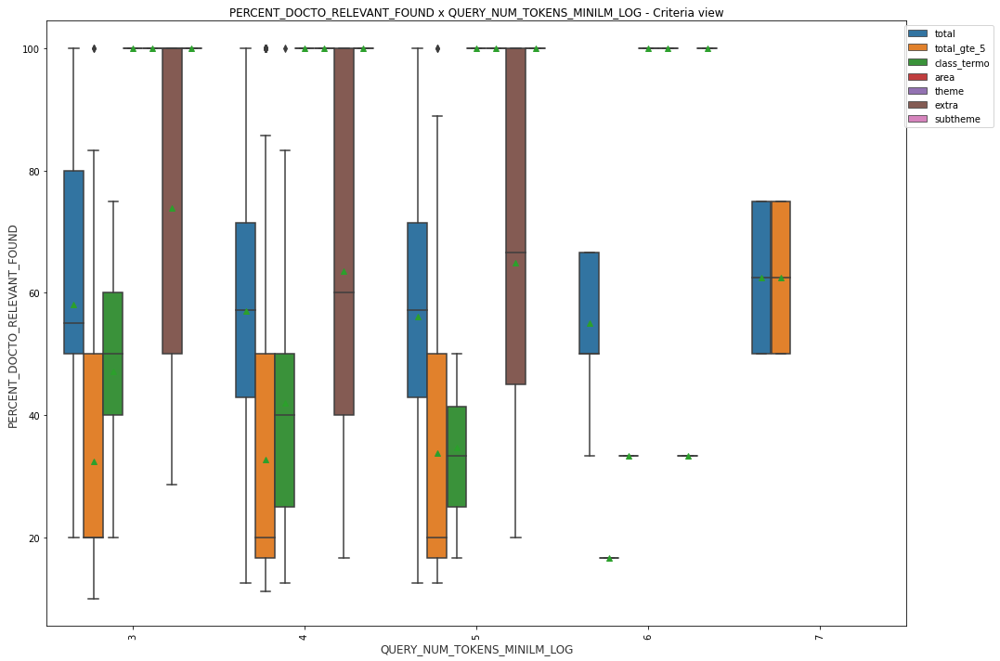

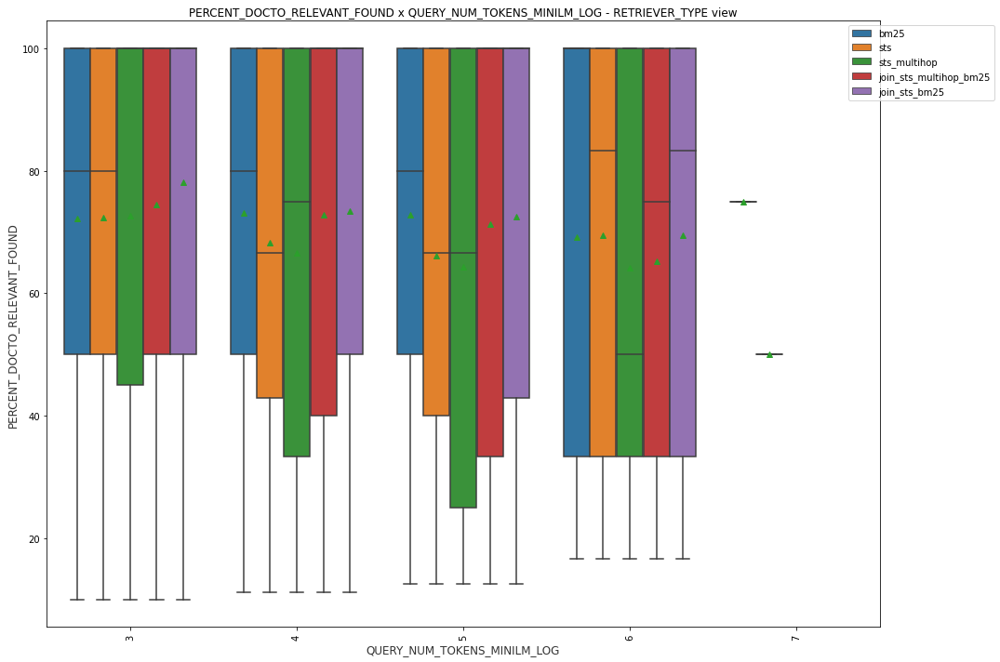

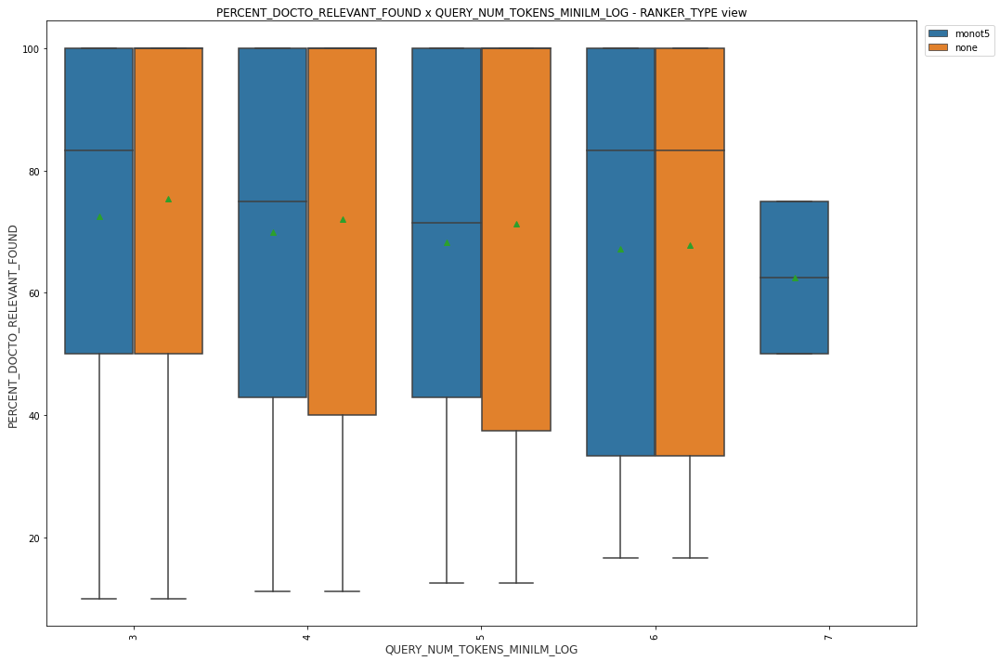

In [44]:
for context in list_category: 
    for metric in list_metric:
        
        # criar lista com valores únicos da coluna a ser ordenada
        # valores_unicos = sorted(df_result[context].unique())
        
        valores_unicos = sorted(df_result[context].dropna().unique())


        f, ax = plt.subplots(1, 1, figsize=(15,10))
        sns.boxplot(x=context, y=metric, data=df_result, showmeans=True, ax=ax, order=valores_unicos)
        ax.set_xlabel(context,size = 12,alpha=0.8)
        ax.set_ylabel(metric,size = 12,alpha=0.8)
        ax.set_title(f'{metric} x {context}')
        plt.xticks(rotation=90)
        plt.tight_layout()

        # Média e Mediana
        media = df_result.groupby(context)[metric].mean()
        mediana = df_result.groupby(context)[metric].median()
        count = df_result.groupby(context)[metric].count()
        mm_list = [f"{i}: {j:.2f}; {k:.2f}; {l:.0f}" for i,j,k,l in zip(media.index, media, mediana, count)]
        mm_str = "\n".join(mm_list)
        ax.text(1.02, 0.5, f"Mean and median:\n{mm_str}", transform=ax.transAxes)

        if context != 'CRITERIA':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='CRITERIA' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - Criteria view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RETRIEVER_TYPE':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RETRIEVER_TYPE' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RETRIEVER_TYPE view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RANKER_TYPE':
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RANKER_TYPE' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RANKER_TYPE view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

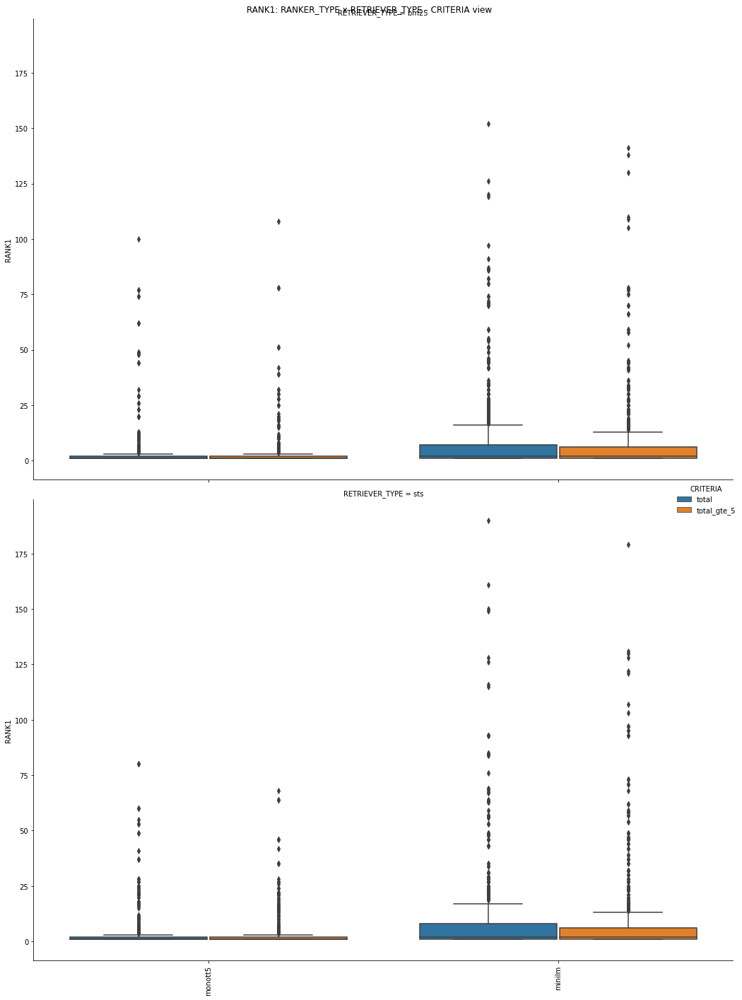

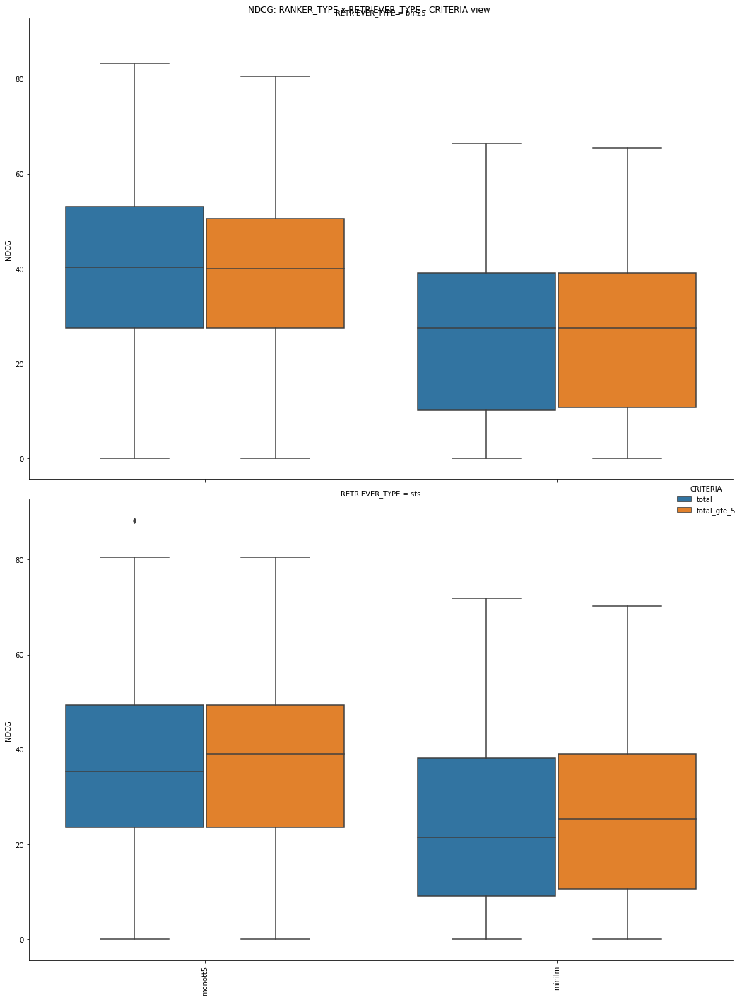

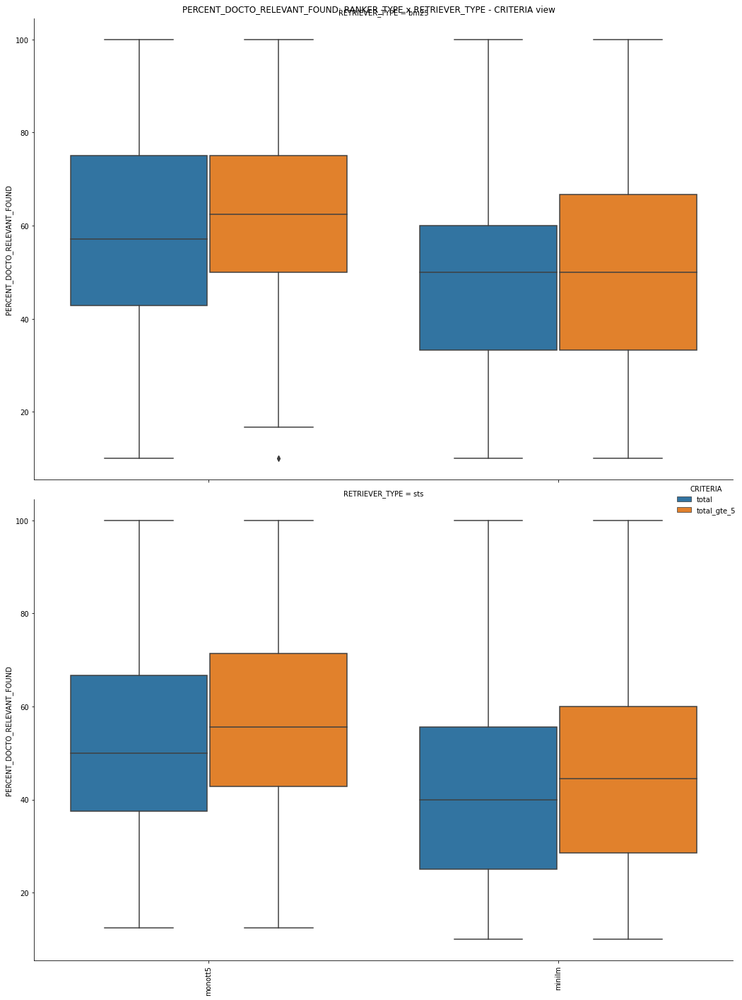

In [ ]:
for metric in list_metric:
    g = sns.catplot(x="RANKER_TYPE", sharex=True, y=metric, hue="CRITERIA", row="RETRIEVER_TYPE", kind="box", data=df_result, height=10, aspect=20/15)
    g.fig.suptitle(f"{metric}: RANKER_TYPE x RETRIEVER_TYPE - CRITERIA view")
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
plt.show()

## Correlation 

In [50]:
df_result.corr()

,TIME_SPENT,NDCG,RANK1,COUNT_DOCTO_FOUND,COUNT_DOCTO_RELEVANT,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,QUERY_ID,QUERY_ID_DOCTO,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND
TIME_SPENT,1.000000,0.159931,-0.146162,0.580922,0.184871,NaN,NaN,NaN,-0.026999,-0.011806,0.064791,0.034253,0.060449,0.061807,0.055349,0.043293,0.043780,0.389722,0.028134
NDCG,0.159931,1.000000,-0.452010,-0.159675,-0.258837,NaN,NaN,NaN,-0.001094,0.025774,0.000209,-0.011625,-0.006890,-0.001482,-0.001213,0.013206,0.000477,-0.023892,0.352164
RANK1,-0.146162,-0.452010,1.000000,0.248445,-0.187978,NaN,NaN,NaN,0.025705,-0.009795,-0.004898,0.004572,-0.000016,0.000815,0.002740,-0.018822,-0.011398,-0.155879,0.094290
COUNT_DOCTO_FOUND,0.580922,-0.159675,0.248445,1.000000,0.071178,NaN,NaN,NaN,-0.012129,-0.014716,0.027160,0.002580,0.024173,0.025392,0.021577,0.011356,0.010655,0.420311,0.167541
COUNT_DOCTO_RELEVANT,0.184871,-0.258837,-0.187978,0.071178,1.000000,NaN,NaN,NaN,-0.020157,0.062279,0.057586,0.071628,0.051134,0.051997,0.047090,0.065059,0.066102,0.629644,-0.768036
TOPK_RETRIEVER,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TOPK_RANKER,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NDCG_LIMIT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
QUERY_ID,-0.026999,-0.001094,0.025705,-0.012129,-0.020157,NaN,NaN,NaN,1.000000,0.000437,0.101806,0.106190,0.094546,0.092643,0.107483,0.179507,0.064543,-0.040700,-0.003191
QUERY_ID_DOCTO,-0.011806,0.025774,-0.009795,-0.014716,0.062279,NaN,NaN,NaN,0.000437,1.000000,0.054117,0.049030,0.046645,0.063167,0.061839,0.109567,0.107423,-0.024836,-0.060220


## Distribution of values

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


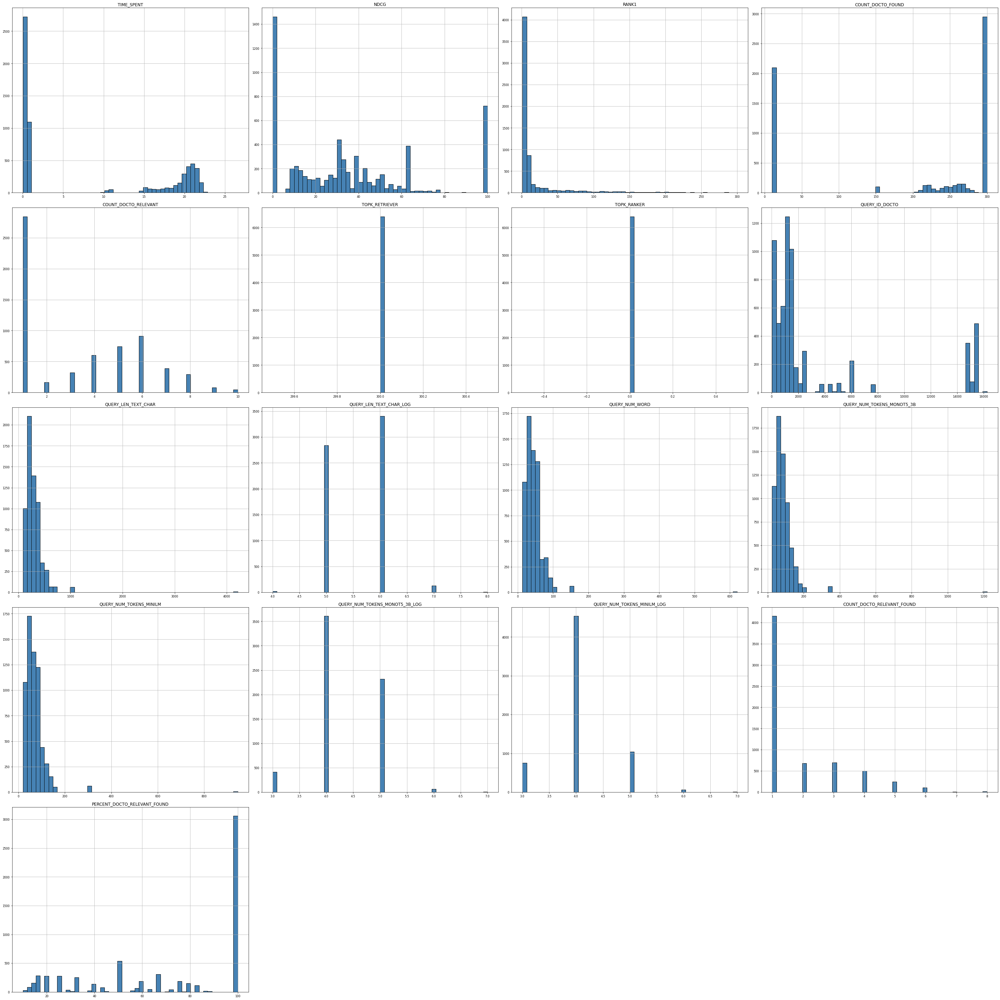

In [51]:
fig, ax = plt.subplots(1, 1, figsize=(40,40))
ax.set_title('Histogram')
df_result.drop(['QUERY_ID','NDCG_LIMIT'],axis=1).hist(bins=50, color='steelblue', edgecolor='black', linewidth=1.0,
           xlabelsize=8, ylabelsize=8, grid=True, ax=ax)  
plt.tight_layout()   

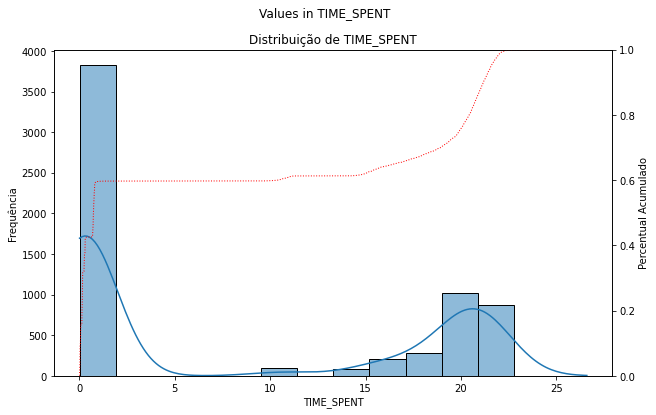

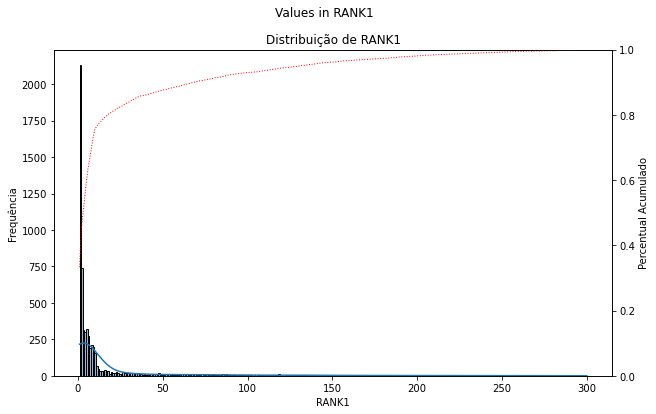

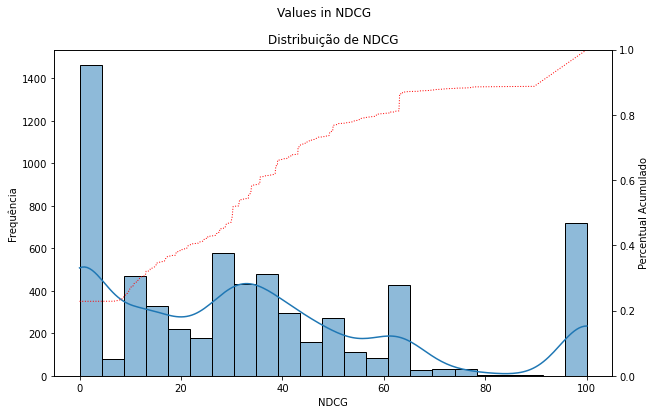

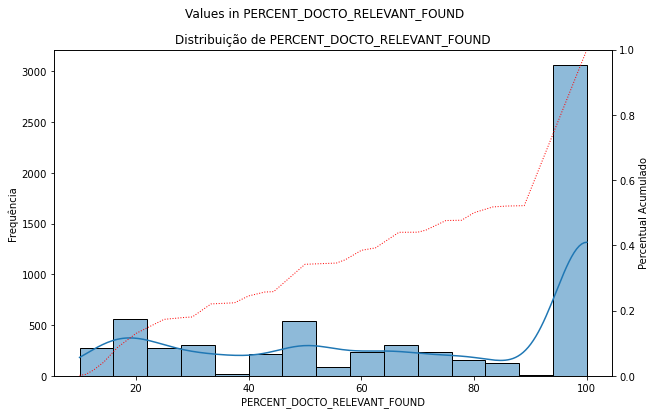

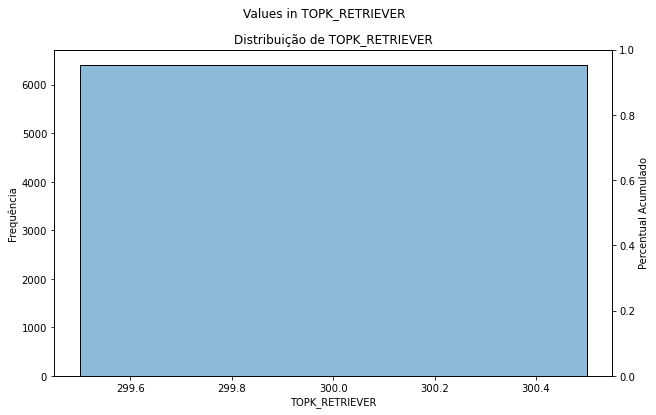

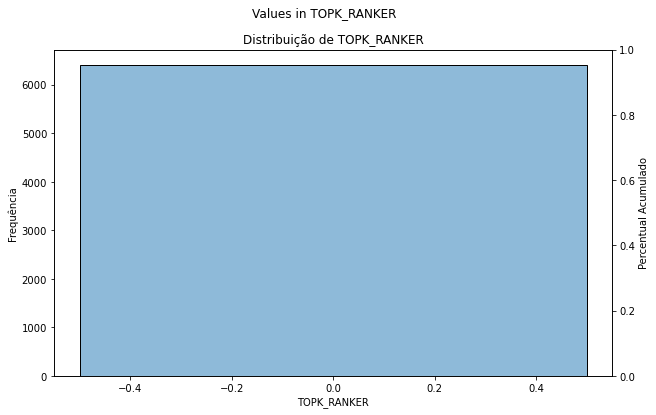

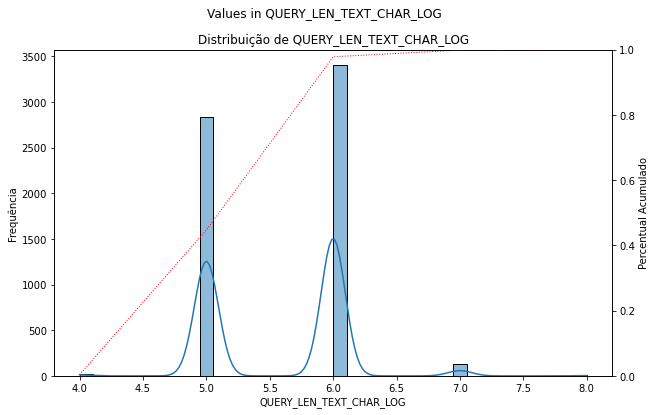

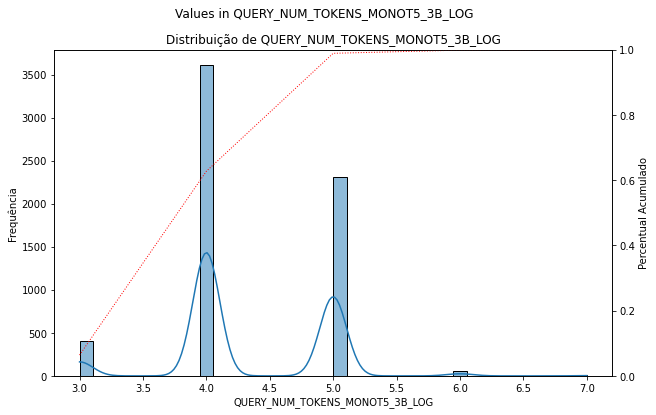

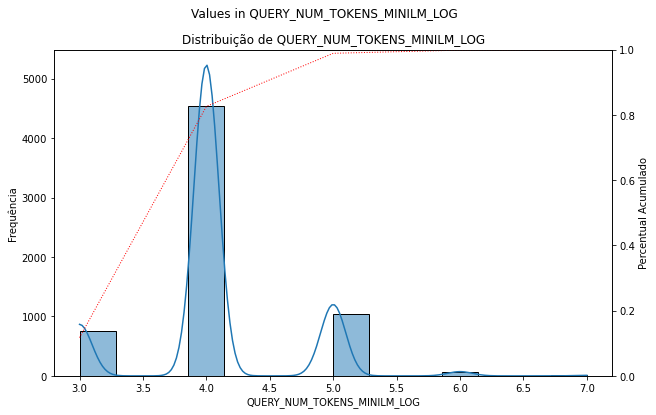

In [52]:
for column in ['TIME_SPENT'] + list_metric + list_category:
    if df_result[column].dtype != object:
        f, ax = plt.subplots(1, 1, figsize=(10,6))
        f.suptitle(f'Values in {column}')    
        # Plot o histograma normalizado com KDE
        sns.histplot(data=df_result[column], kde=True, ax=ax, linewidth=1)

        # Calcula o percentual acumulado
        cumulative = df_result[column].value_counts(normalize=True).sort_index().cumsum()

        # Cria um novo eixo y com o percentual acumulado
        ax2 = ax.twinx()
        ax2.plot(cumulative.index, cumulative.values, linestyle='dotted', marker='', color='red', linewidth=1)
        ax2.set_ylim([0, 1])
        ax2.set_ylabel('Percentual Acumulado')

        # Configurações do gráfico
        ax.set_title(f'Distribuição de {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Frequência')
# Exibe o gráfico
plt.show()

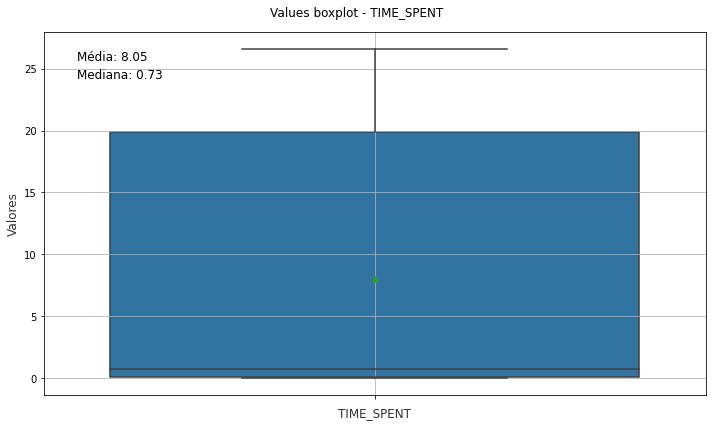

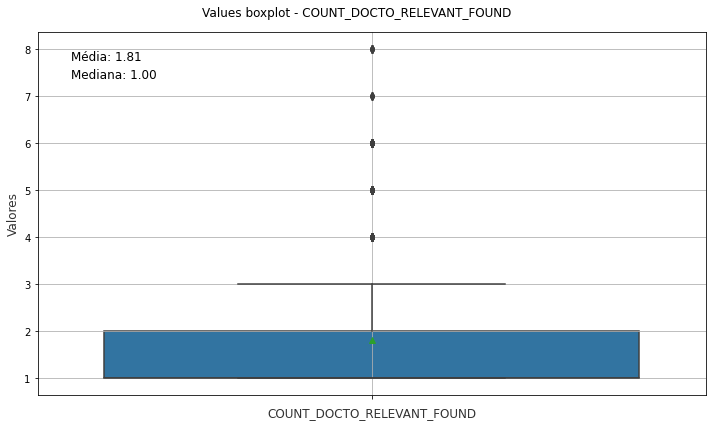

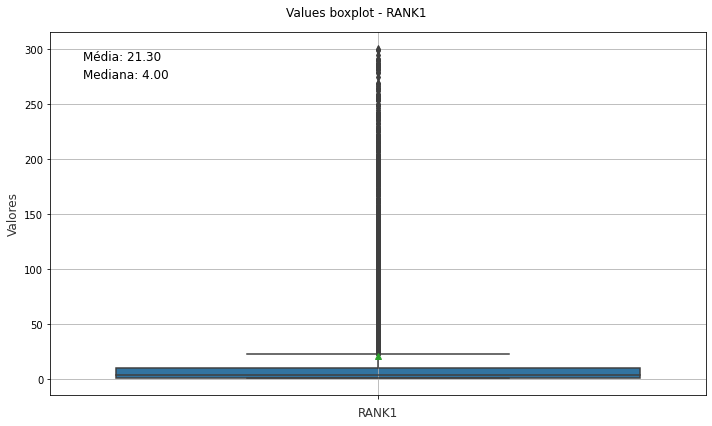

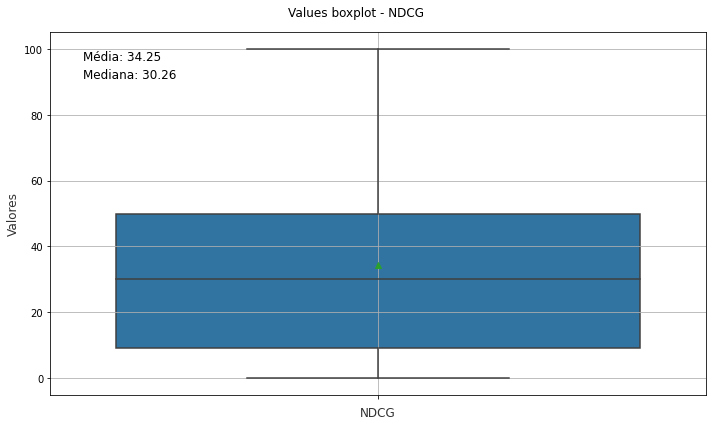

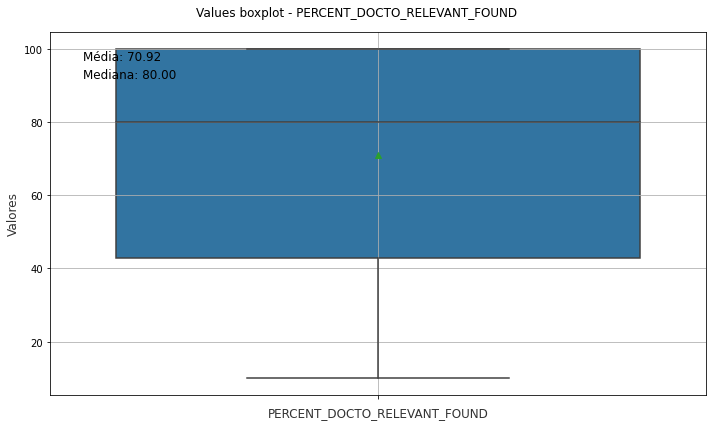

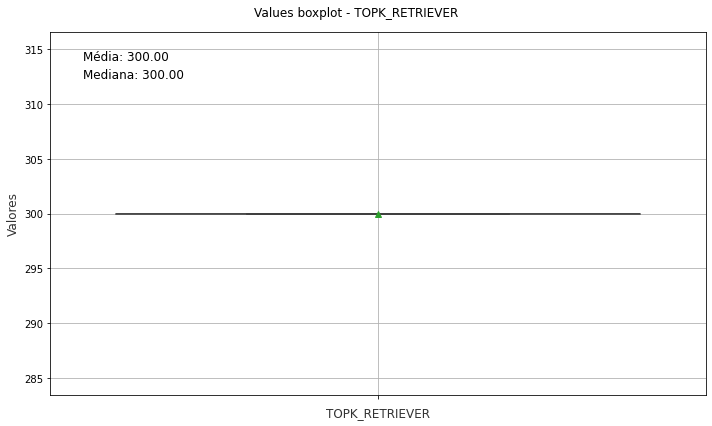

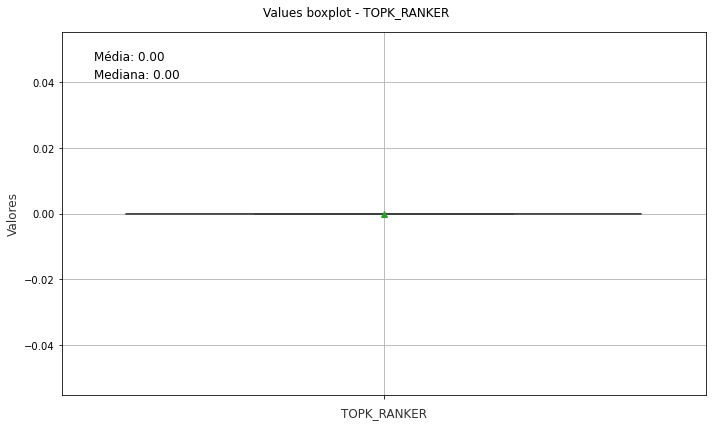

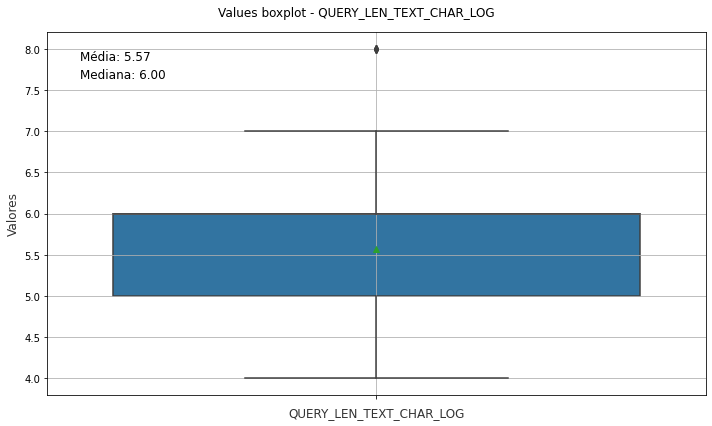

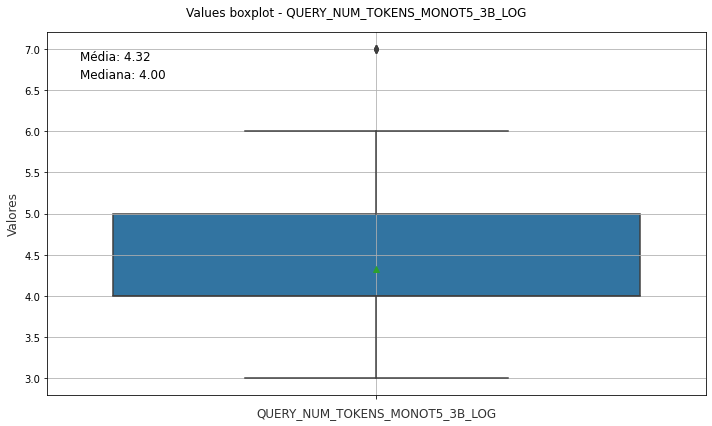

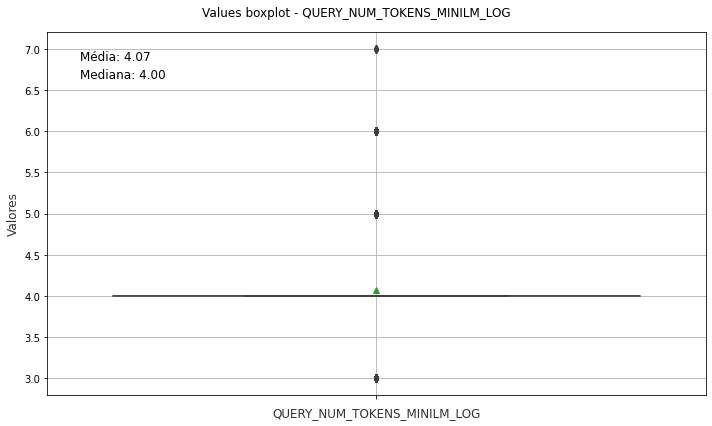

In [53]:
metrics = {}
for column in ['TIME_SPENT', 'COUNT_DOCTO_RELEVANT_FOUND'] + list_metric + list_category: 
  if df_result[column].dtype != object:
    f, ax = plt.subplots(1, 1, figsize=(10,6))
    f.suptitle(f'Values boxplot - {column}')
    ax = sns.boxplot(y=column, data=df_result, showmeans=True, ax=ax)
    # Gráfico de disperção
    # ax = sns.stripplot(y=column, data=df_result, ax=ax) 

    # Calcula a média e mediana
    mean_val = round(df_result[column].mean(), 3)
    median_val = df_result[column].median()
    metrics[column] = {'media': mean_val, 'mediana':median_val}
    # Imprime a média e mediana no gráfico
    ax.text(0.05, 0.95, f'Média: {mean_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')
    ax.text(0.05, 0.9, f'Mediana: {median_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')

    plt.grid() 
    # sns.boxplot(data=df_result['{column}'], showmeans=True,  ax=ax)
    ax.set_xlabel(f"{column}",size = 12,alpha=0.8)
    ax.set_ylabel("Valores",size = 12,alpha=0.8)
    plt.xticks(rotation=60)
    plt.tight_layout()  
plt.show()

## Best ndcg evaluation

In [54]:
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', None)

In [55]:
df_result.sort_values(by='NDCG', ascending=False).head(10)

,TIME_SPENT,NDCG,RANK1,COUNT_DOCTO_FOUND,LIST_RANK,COUNT_DOCTO_RELEVANT,GROUND_TRUTH,LIST_DOCTO_FOUND,RETRIEVER_TYPE,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,CRITERIA,RETRIEVER_MODEL_NAME,RANKER_MODEL_NAME,QUERY_ID,QUERY_RELEVANCE_DICT_ID_DOC,QUERY_RELEVANCE_DICT_TYPE,QUERY_PARADIGMATIC,QUERY_AREA_NAME,QUERY_ID_DOCTO,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND,RANKER_TYPE
9117,0.6998,100.0,1,10,[1],1,{342: 'AREA'},"[342, 5095, 331, 775, 629, 932, 15273, 414, 52...",bm25,300,0.0,12,area,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,15470,"{342: 'AREA', 631: 'INDEXACAO_EXTRA', 2553: 'T...","{'AREA': [342], 'INDEXACAO_EXTRA': [631], 'TEM...",NaN,Convênio,342,266,6,45,71,57,4,4,1,100.0,monot5
9695,0.0242,100.0,1,10,[1],1,{5095: 'AREA'},"[5095, 629, 414, 331, 932, 342, 775, 5288, 152...",sts,300,0.0,12,area,rufimelo/Legal-BERTimbau-sts-large-ma-v3,NaN,37176,"{1340: 'INDEXACAO_EXTRA', 4070: 'TEMA', 5095: ...","{'INDEXACAO_EXTRA': [1340, 15266, 1478], 'TEMA...",NaN,Competência do TCU,1340,324,6,51,91,72,5,4,1,100.0,none
9738,0.7222,100.0,1,10,[1],1,{5095: 'AREA'},"[5095, 629, 1131, 775, 331, 15273, 932, 342, 4...",join_sts_bm25,300,0.0,12,area,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,37176,"{1340: 'INDEXACAO_EXTRA', 4070: 'TEMA', 5095: ...","{'INDEXACAO_EXTRA': [1340, 15266, 1478], 'TEMA...",NaN,Competência do TCU,1340,324,6,51,91,72,5,4,1,100.0,monot5
12560,20.6935,100.0,1,300,[1],1,{41: 'TEMA'},"[41, 14871, 169, 724, 1451, 722, 617, 23, 435,...",sts_multihop,300,0.0,12,theme,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,38436,"{41: 'TEMA', 3213: 'SUBTEMA', 4070: 'INDEXACAO...","{'TEMA': [41], 'SUBTEMA': [3213], 'INDEXACAO_E...",NaN,Pessoal,41,195,5,30,52,44,4,4,1,100.0,monot5
9727,0.0308,100.0,1,10,[1],1,{5095: 'AREA'},"[5095, 629, 414, 331, 932, 342, 775, 5288, 152...",join_sts_bm25,300,0.0,12,area,rufimelo/Legal-BERTimbau-sts-large-ma-v3,NaN,37176,"{1340: 'INDEXACAO_EXTRA', 4070: 'TEMA', 5095: ...","{'INDEXACAO_EXTRA': [1340, 15266, 1478], 'TEMA...",NaN,Competência do TCU,1340,324,6,51,91,72,5,4,1,100.0,none
9726,0.0657,100.0,1,10,[1],1,{5095: 'AREA'},"[5095, 629, 932, 331, 414, 1131, 342, 775, 528...",join_sts_multihop_bm25,300,0.0,12,area,rufimelo/Legal-BERTimbau-sts-large-ma-v3,NaN,37176,"{1340: 'INDEXACAO_EXTRA', 4070: 'TEMA', 5095: ...","{'INDEXACAO_EXTRA': [1340, 15266, 1478], 'TEMA...",NaN,Competência do TCU,1340,324,6,51,91,72,5,4,1,100.0,none
12569,0.1282,100.0,1,300,[1],1,{41: 'TEMA'},"[41, 14871, 506, 295, 1451, 722, 1480, 1100217...",bm25,300,0.0,12,theme,NaN,NaN,38436,"{41: 'TEMA', 3213: 'SUBTEMA', 4070: 'INDEXACAO...","{'TEMA': [41], 'SUBTEMA': [3213], 'INDEXACAO_E...",NaN,Pessoal,41,195,5,30,52,44,4,4,1,100.0,none
9713,0.7174,100.0,1,10,[1],1,{5095: 'AREA'},"[5095, 629, 1131, 775, 331, 15273, 932, 342, 4...",sts,300,0.0,12,area,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,37176,"{1340: 'INDEXACAO_EXTRA', 4070: 'TEMA', 5095: ...","{'INDEXACAO_EXTRA': [1340, 15266, 1478], 'TEMA...",NaN,Competência do TCU,1340,324,6,51,91,72,5,4,1,100.0,monot5
9712,0.6927,100.0,1,10,[1],1,{5095: 'AREA'},"[5095, 629, 1131, 775, 331, 15273, 932, 342, 4...",bm25,300,0.0,12,area,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,37176,"{1340: 'INDEXACAO_EXTRA', 4070: 'TEMA', 5095: ...","{'INDEXACAO_EXTRA': [1340, 15266, 1478], 'TEMA...",NaN,Competência do TCU,1340,324,6,51,91,72,5,4,1,100.0,monot5
12584,19.9793,100.0,1,300,[1],1,{41: 'TEMA'},"[41, 14871, 169, 724, 1451, 722, 617, 23, 435,...",bm25,300,0.0,12,theme,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,38436,"{41: 'TEMA', 3213: 'SUBTEMA', 4070: 'INDEXACAO...","{'TEMA': [41], 'SUBTEMA': [3213], 'INDEXACAO_E...",NaN,Pessoal,41,195,5,30,52,44,4,4,1,100.0,monot5


In [56]:
df_top = df_result[df_result['NDCG'] >= 60].sort_values(by='NDCG', ascending=False)
df_top.shape

(1257, 31)

### Distribution of Values

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


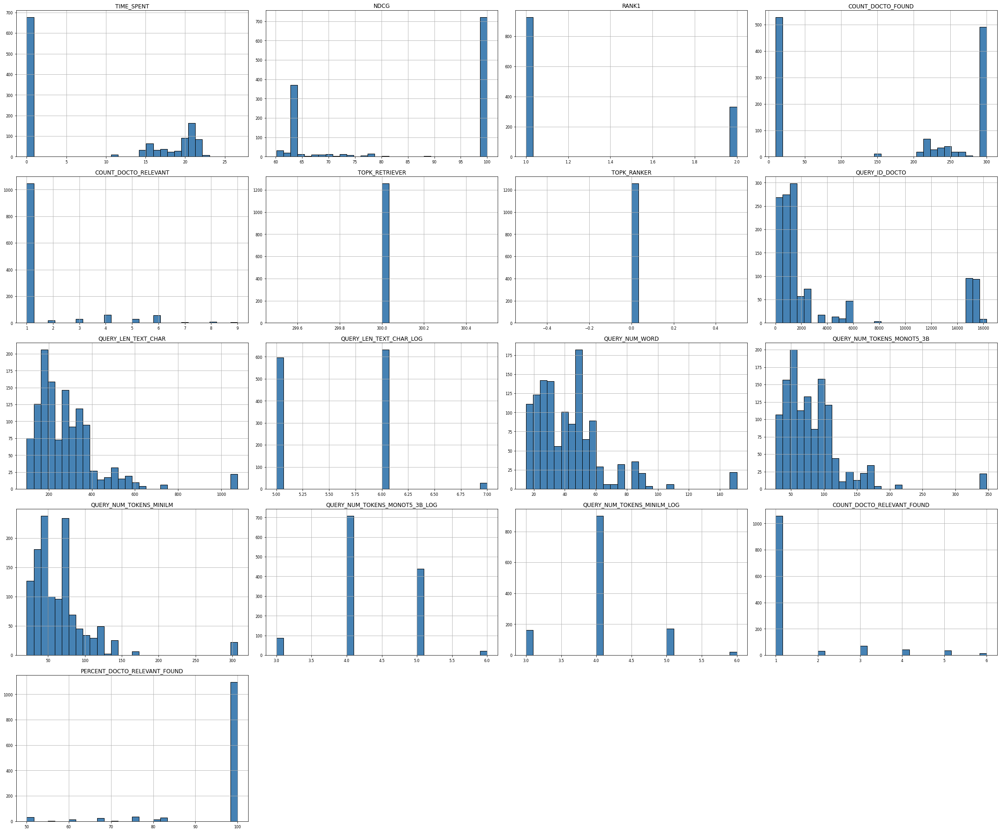

In [57]:

fig, ax = plt.subplots(1, 1, figsize=(30,25))
ax.set_title('Histogram')
df_top.drop(['QUERY_ID','NDCG_LIMIT'],axis=1).hist(bins=30, color='steelblue', edgecolor='black', linewidth=1.0,
           xlabelsize=8, ylabelsize=8, grid=True, ax=ax)  
plt.tight_layout() 

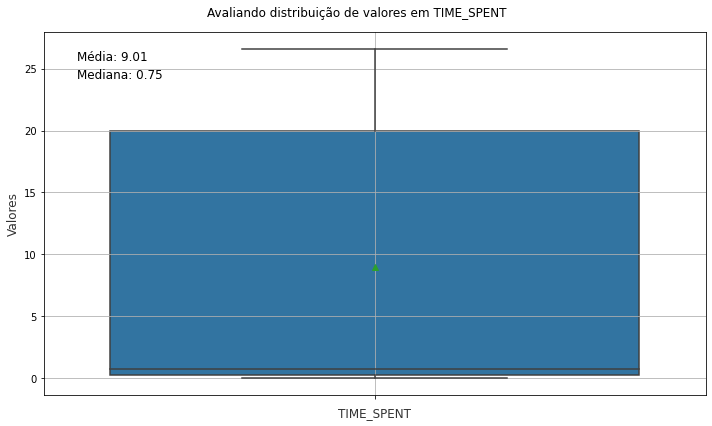

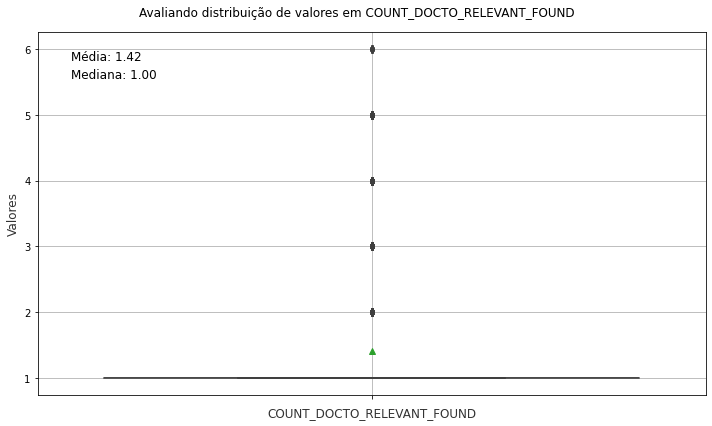

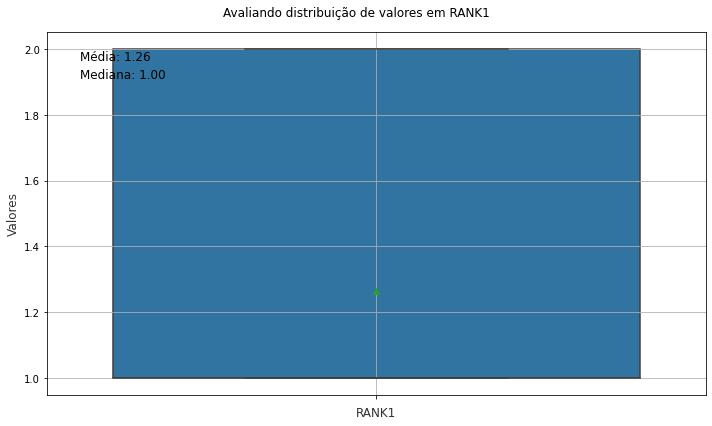

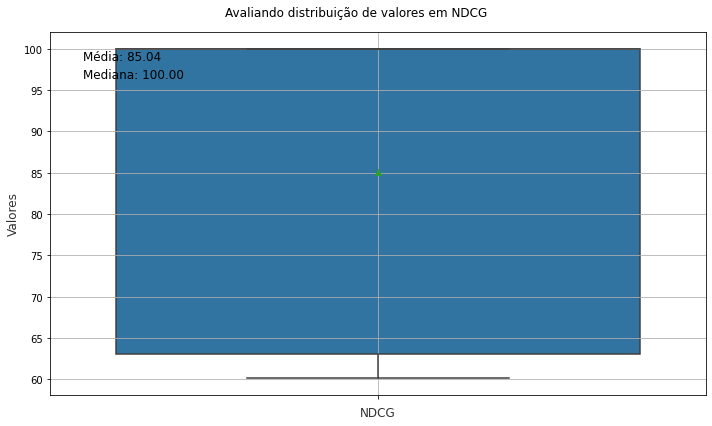

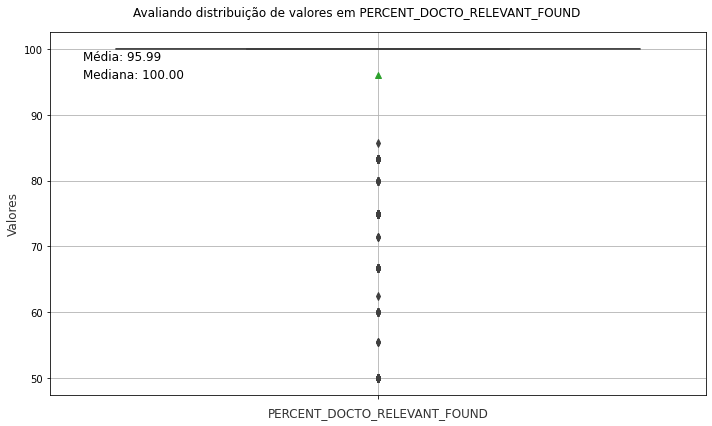

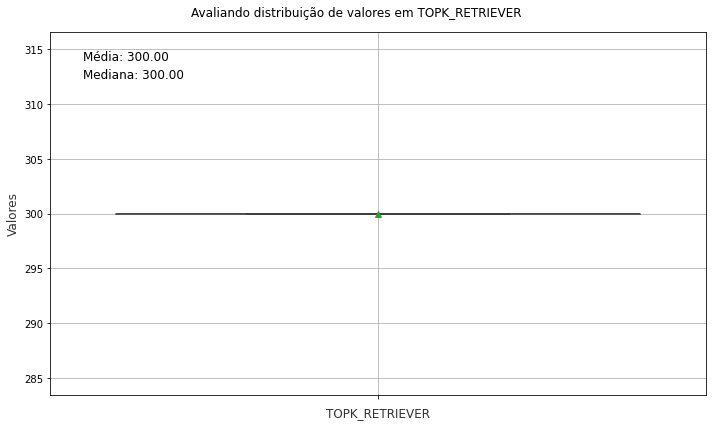

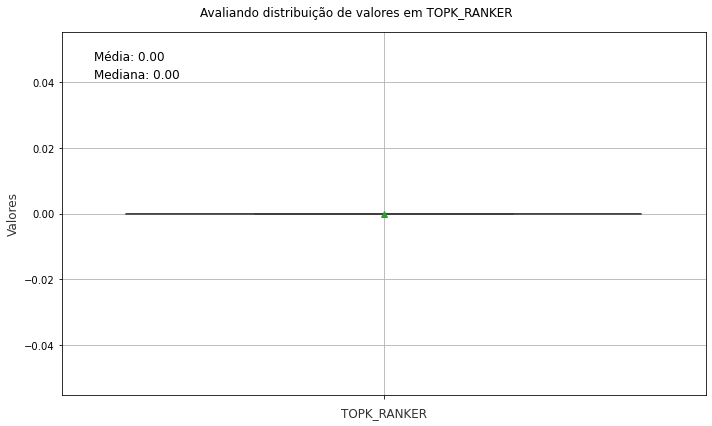

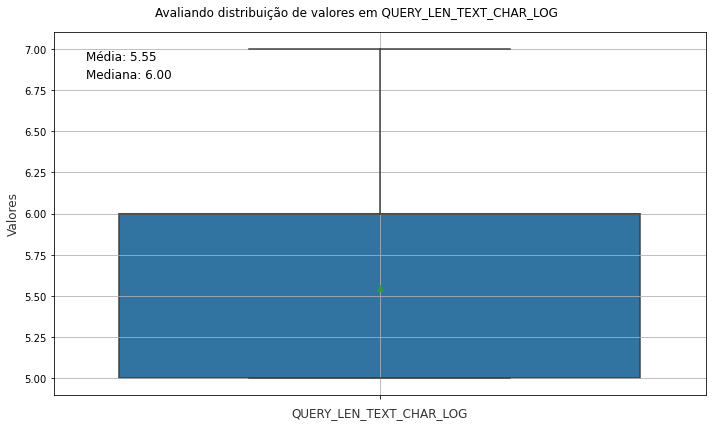

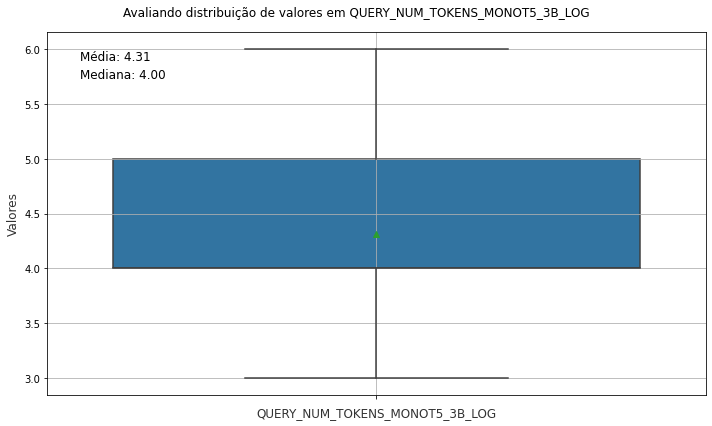

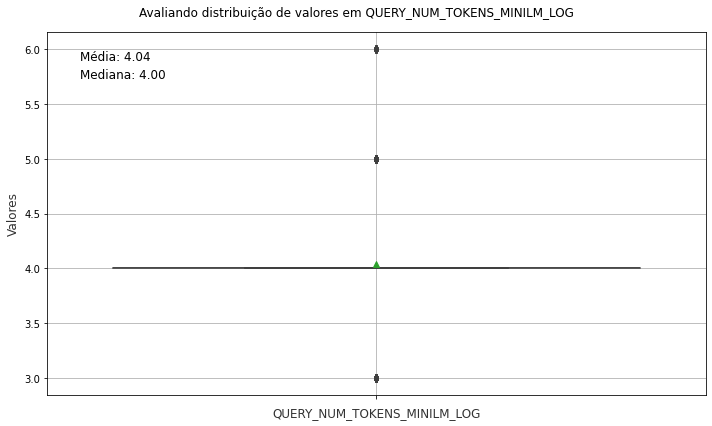

In [58]:
metrics = {}
for column in ['TIME_SPENT', 'COUNT_DOCTO_RELEVANT_FOUND'] + list_metric + list_category: 
  if df_top[column].dtype != object:
    f, ax = plt.subplots(1, 1, figsize=(10,6))
    f.suptitle(f'Avaliando distribuição de valores em {column}')
    ax = sns.boxplot(y=column, data=df_top, showmeans=True, ax=ax)
    # Gráfico de disperção
    # ax = sns.stripplot(y=column, data=df_top, ax=ax) 

    # Calcula a média e mediana
    mean_val = round(df_top[column].mean(), 3)
    median_val = df_top[column].median()
    metrics[column] = {'media': mean_val, 'mediana':median_val}
    # Imprime a média e mediana no gráfico
    ax.text(0.05, 0.95, f'Média: {mean_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')
    ax.text(0.05, 0.9, f'Mediana: {median_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')

    plt.grid() 
    # sns.boxplot(data=df_top['{column}'], showmeans=True,  ax=ax)
    ax.set_xlabel(f"{column}",size = 12,alpha=0.8)
    ax.set_ylabel("Valores",size = 12,alpha=0.8)
    plt.xticks(rotation=60)
    plt.tight_layout()  
plt.show()

### Category evaluation

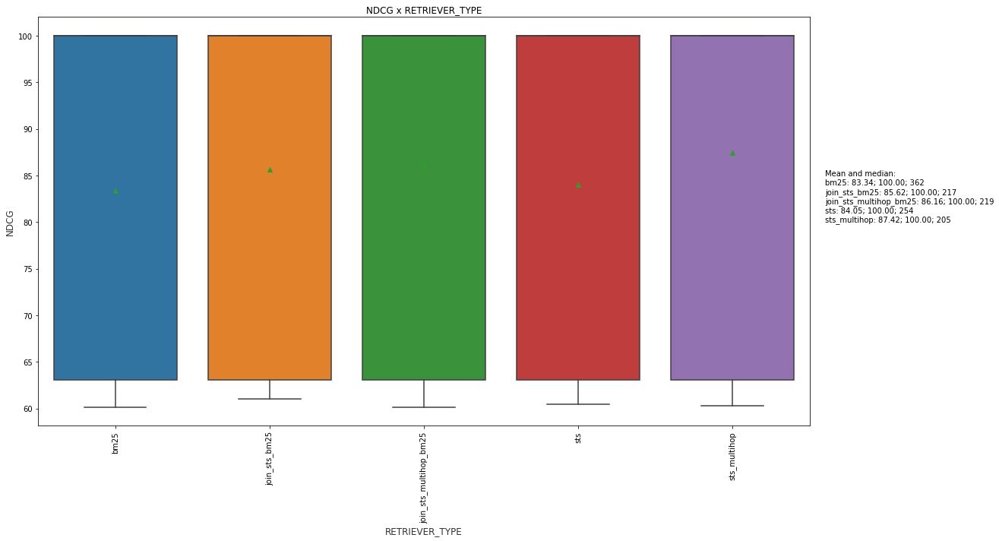

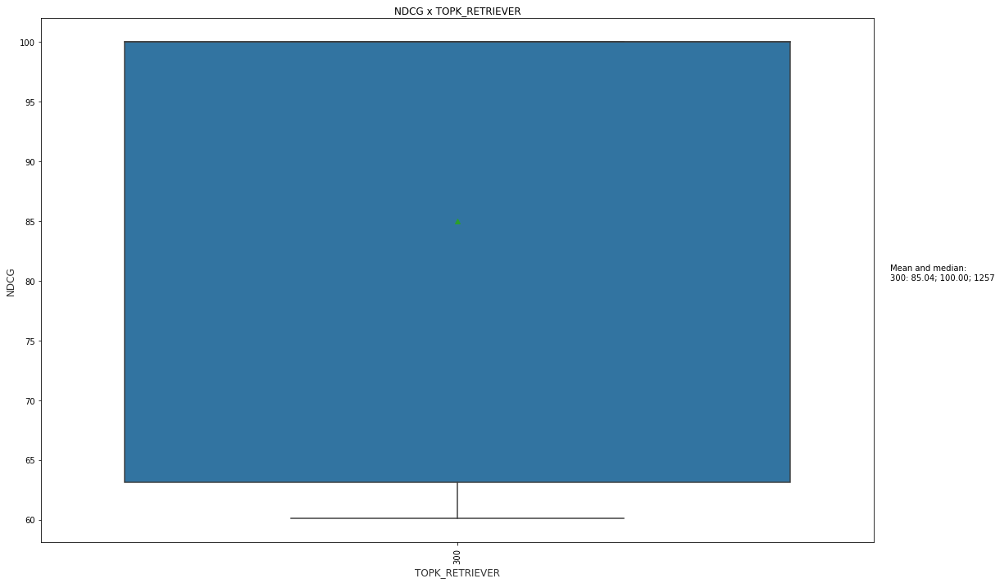

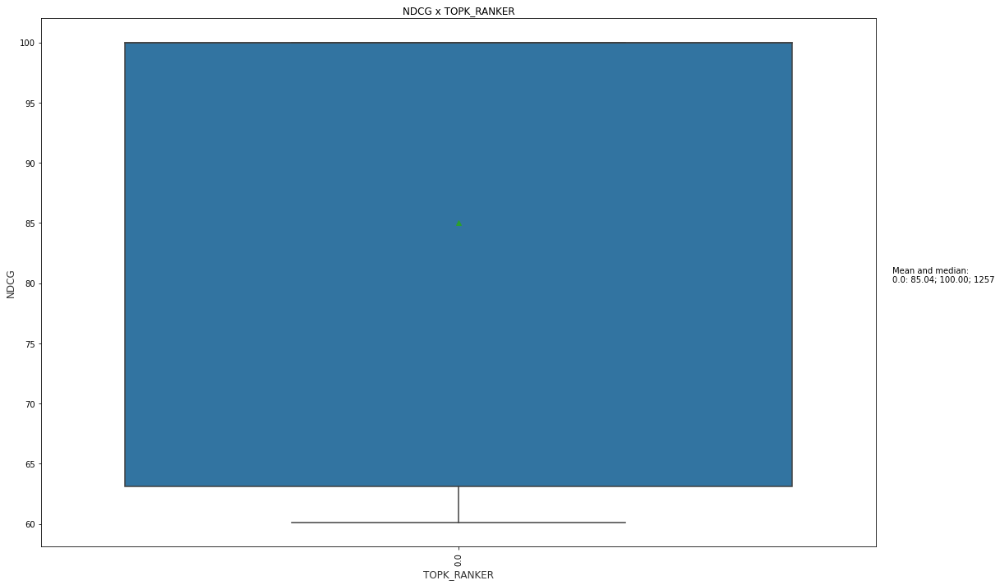

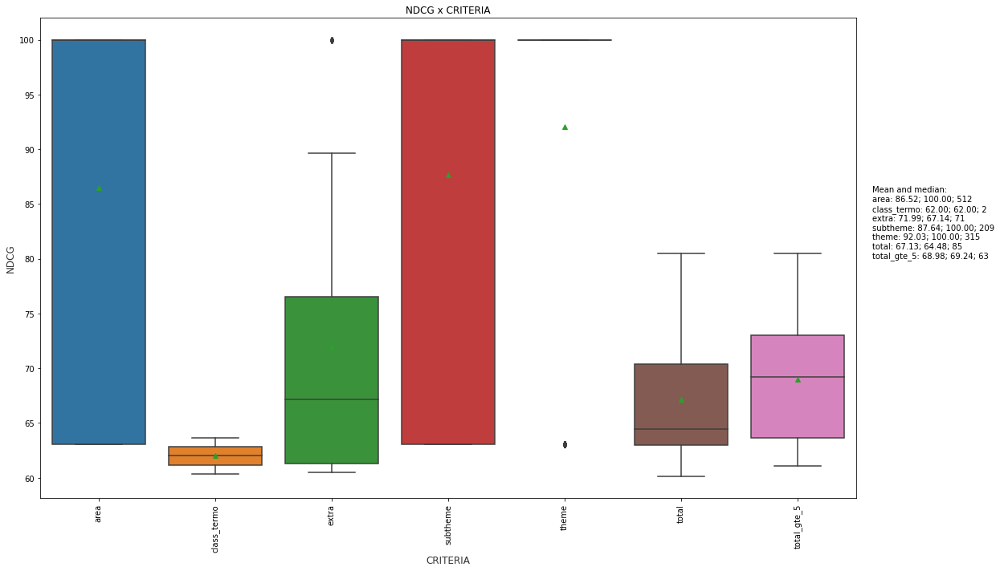

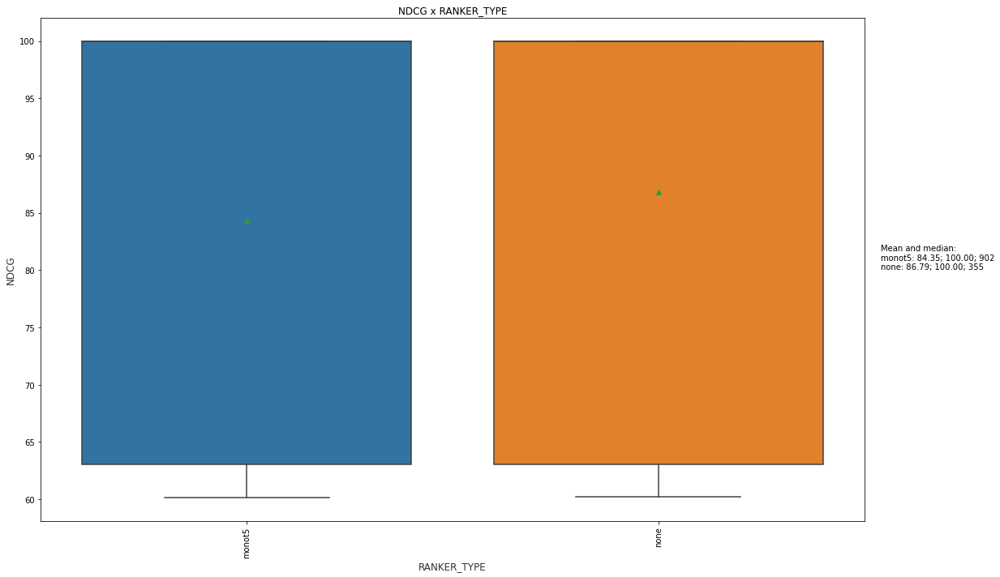

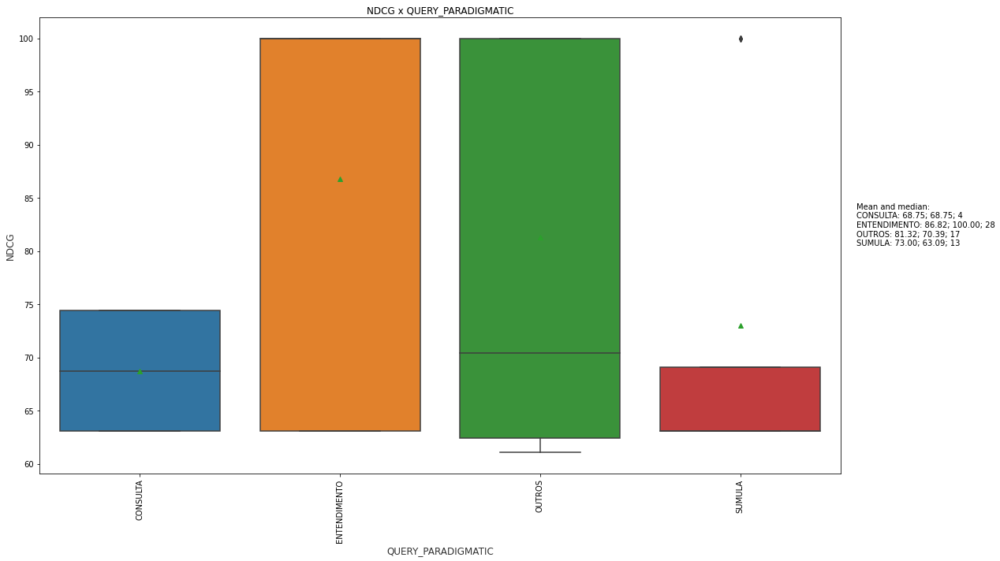

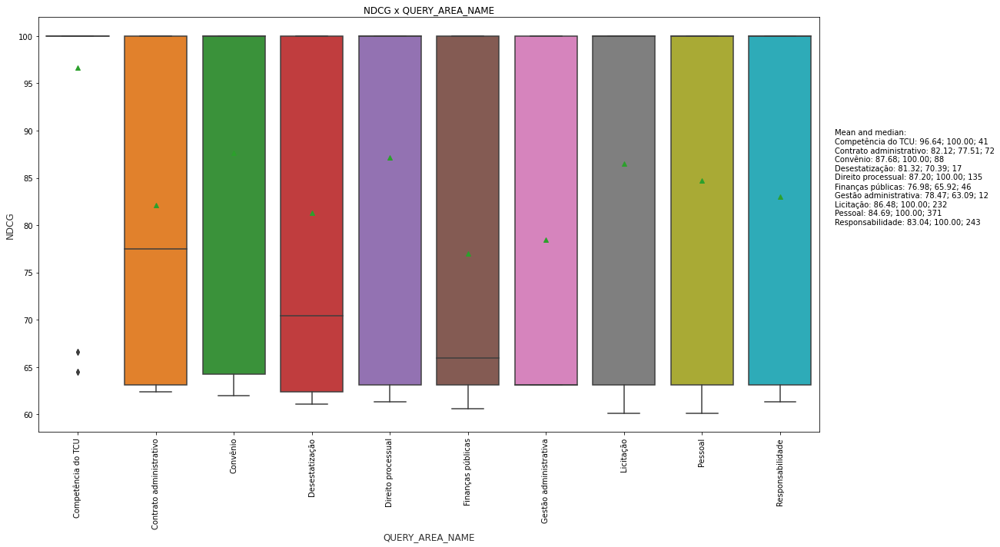

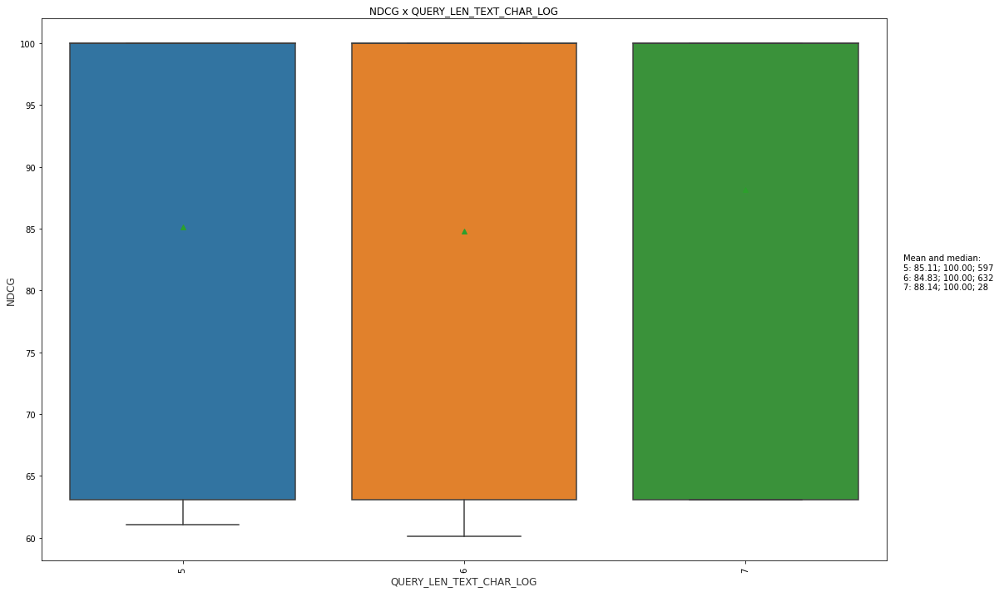

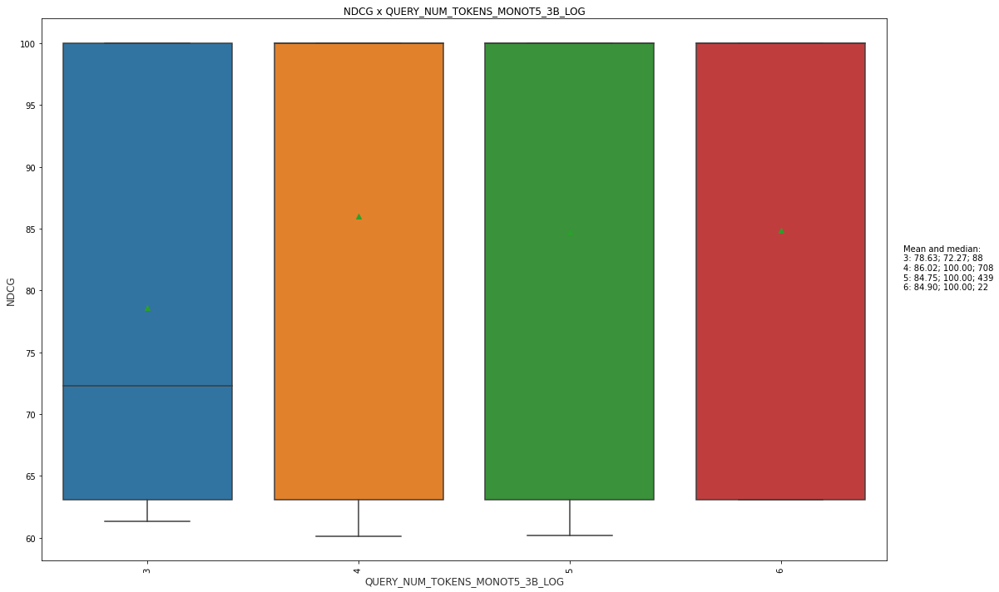

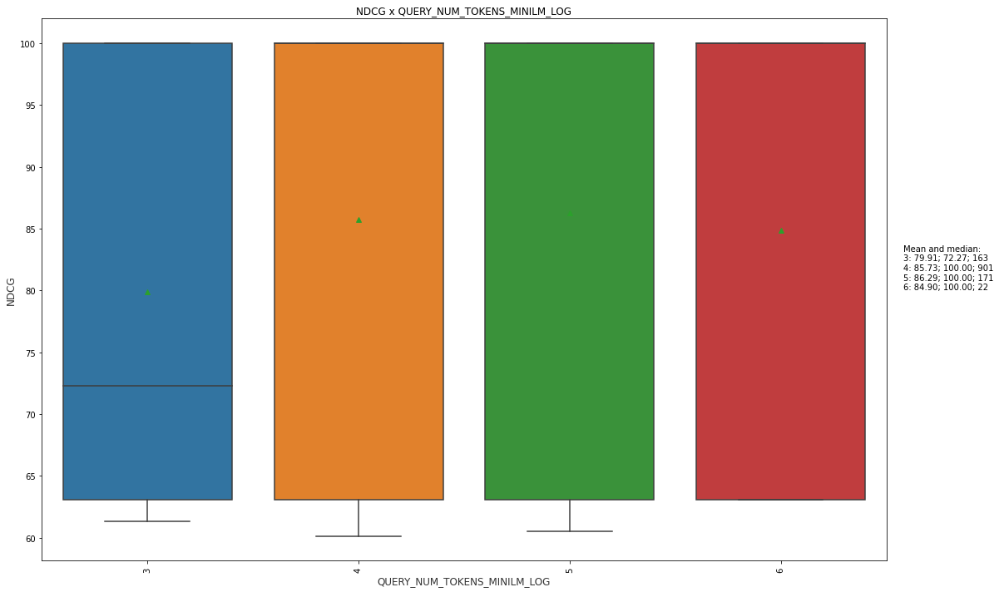

In [59]:
for context in list_category: 
    for metric in ['NDCG']:
        
        # criar lista com valores únicos da coluna a ser ordenada
        # valores_unicos = sorted(df_top[context].unique())
        
        valores_unicos = sorted(df_top[context].dropna().unique())


        f, ax = plt.subplots(1, 1, figsize=(15,10))
        sns.boxplot(x=context, y=metric, data=df_top, showmeans=True, ax=ax, order=valores_unicos)
        ax.set_xlabel(context,size = 12,alpha=0.8)
        ax.set_ylabel(metric,size = 12,alpha=0.8)
        ax.set_title(f'{metric} x {context}')
        plt.xticks(rotation=90)
        plt.tight_layout()

        # Média e Mediana
        media = df_top.groupby(context)[metric].mean()
        mediana = df_top.groupby(context)[metric].median()
        count = df_top.groupby(context)[metric].count()
        mm_list = [f"{i}: {j:.2f}; {k:.2f}; {l:.0f}" for i,j,k,l in zip(media.index, media, mediana, count)]
        mm_str = "\n".join(mm_list)
        ax.text(1.02, 0.5, f"Mean and median:\n{mm_str}", transform=ax.transAxes)


# Doc - evaluation


In [ ]:
import importlib
importlib.reload(util_evaluation)

<module 'util.util_evaluation' from '/home/borela/fontes/ind-ir/code/util/util_evaluation.py'>

In [ ]:
%%time
df_result_doc = util_evaluation.return_result_per_doc(DATASET_NAME)

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/transformers/convert_slow_tokenizer.py:447: UserWarning: The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.
  "The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option"


CPU times: user 1min, sys: 136 ms, total: 1min
Wall time: 1min


In [ ]:
df_result_doc.shape

(43560, 54)

In [ ]:
df_result_doc.columns

Index(['COUNT_DOCTO_RELEVANT', 'TIME_SPENT', 'NDCG', 'COUNT_DOCTO_FOUND',
       'RANK1', 'LIST_RANK', 'LIST_DOCTO_FOUND', 'RETRIEVER_TYPE',
       'TOPK_RETRIEVER', 'TOPK_RANKER', 'NDCG_LIMIT', 'CRITERIA',
       'RETRIEVER_MODEL_NAME', 'RANKER_MODEL_NAME', 'QUERY_ID',
       'QUERY_PARADIGMATIC', 'QUERY_AREA_NAME', 'QUERY_ID_DOCTO',
       'QUERY_LEN_TEXT_CHAR', 'QUERY_LEN_TEXT_CHAR_LOG', 'QUERY_NUM_WORD',
       'QUERY_NUM_TOKENS_MONOT5_3B', 'QUERY_NUM_TOKENS_MINILM',
       'QUERY_NUM_TOKENS_MONOT5_3B_LOG', 'QUERY_NUM_TOKENS_MINILM_LOG',
       'COUNT_DOCTO_RELEVANT_FOUND', 'PERCENT_DOCTO_RELEVANT_FOUND',
       'RANKER_TYPE', 'DOC_ID', 'TYPE_QREL', 'DOC_ID_FOUND', 'DOC_NAME',
       'DOC_CLASS', 'DOC_HAS_SCOPE_NOTE', 'DOC_HAS_DEFINITION',
       'DOC_HAS_SYNONYM', 'DOC_HAS_EXAMPLE', 'DOC_HAS_ENGLISH_TRANSLATION',
       'DOC_HAS_SPECIALIZATION', 'DOC_HAS_RELATED_TERM',
       'DOC_HAS_SPANISH_TRANSLATION', 'DOC_HAS_GENERALIZATION',
       'DOC_COUNT_INDEX_AREA', 'DOC_COUNT_INDEX_T

In [ ]:
# list_metric = ['RANK1', 'NDCG', 'PERCENT_DOCTO_RELEVANT_FOUND']
list_category_doc = [
       # about doc
       'TYPE_QREL', 'DOC_CLASS', 'DOC_HAS_SCOPE_NOTE', 'DOC_HAS_DEFINITION',
       'DOC_HAS_SYNONYM', 'DOC_HAS_EXAMPLE', 'DOC_HAS_ENGLISH_TRANSLATION',
       'DOC_HAS_SPECIALIZATION', 'DOC_HAS_RELATED_TERM',
       'DOC_HAS_SPANISH_TRANSLATION', 'DOC_HAS_GENERALIZATION',
       'DOC_LEN_TEXT_CHAR_LOG',
       'DOC_NUM_TOKENS_MONOT5_3B_LOG', 'DOC_NUM_TOKENS_MINILM_LOG'
]



## Found x not found

In [ ]:
df_result_doc_found = df_result_doc[df_result_doc['DOC_ID_FOUND']]

In [ ]:
df_result_doc_not_found = df_result_doc[-df_result_doc['DOC_ID_FOUND']]

In [ ]:
df_result_doc_found.shape, df_result_doc_not_found.shape

((20645, 54), (22915, 54))

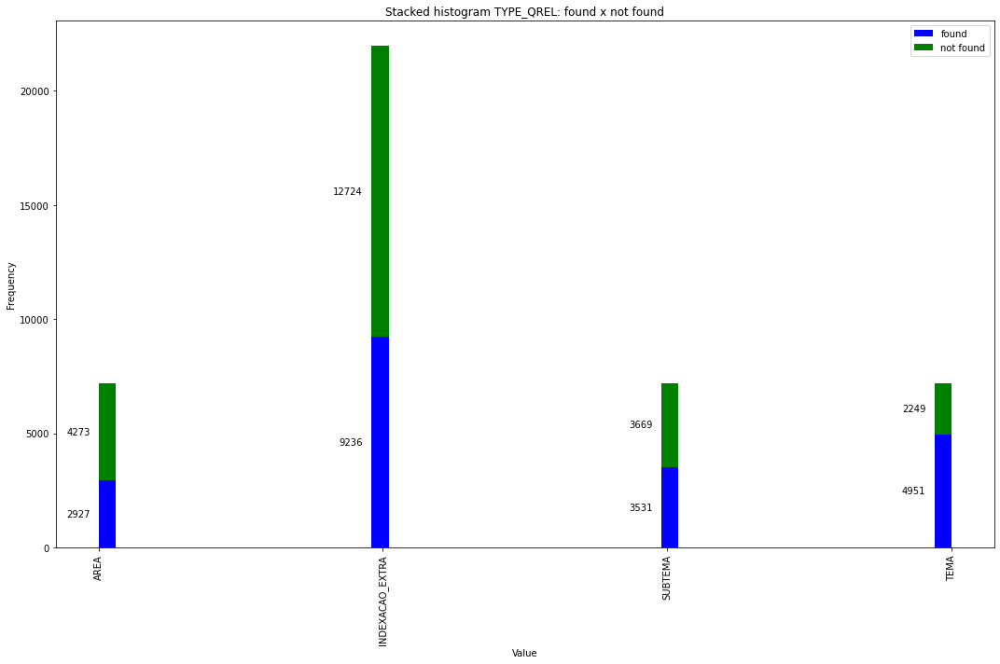

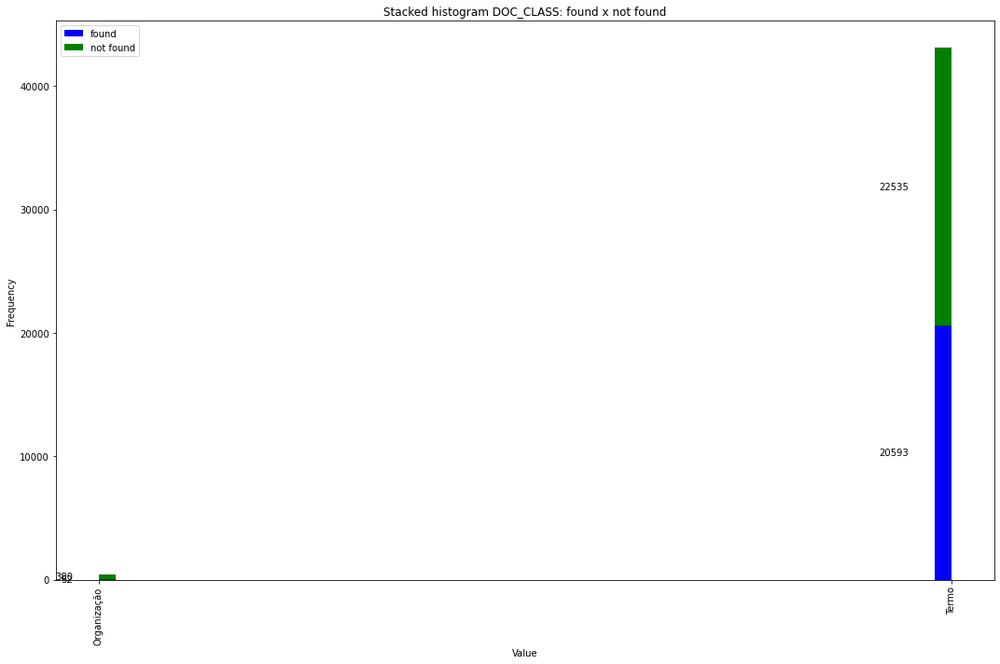

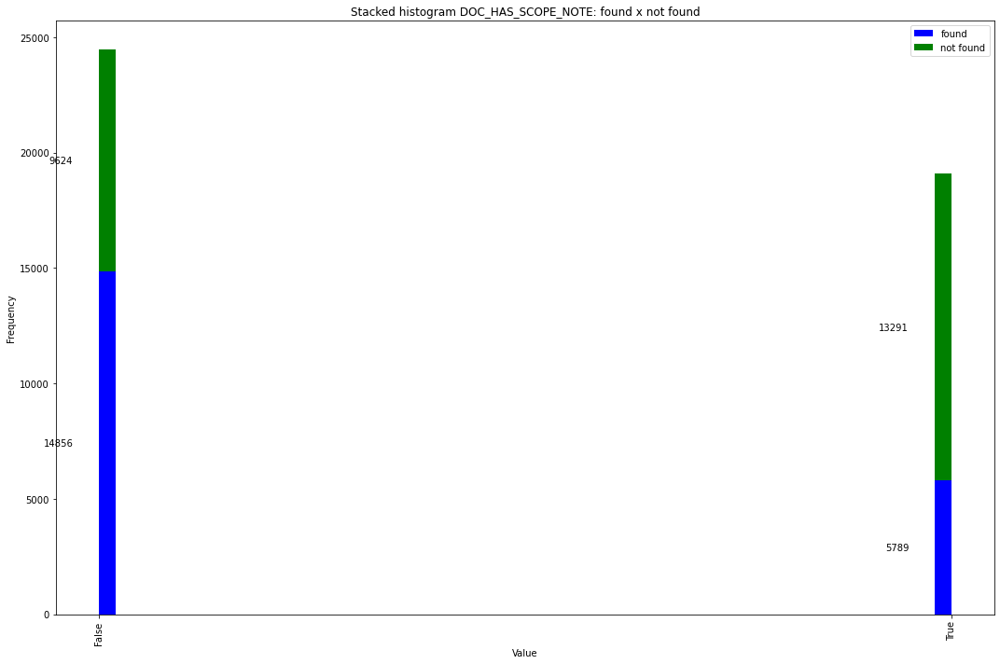

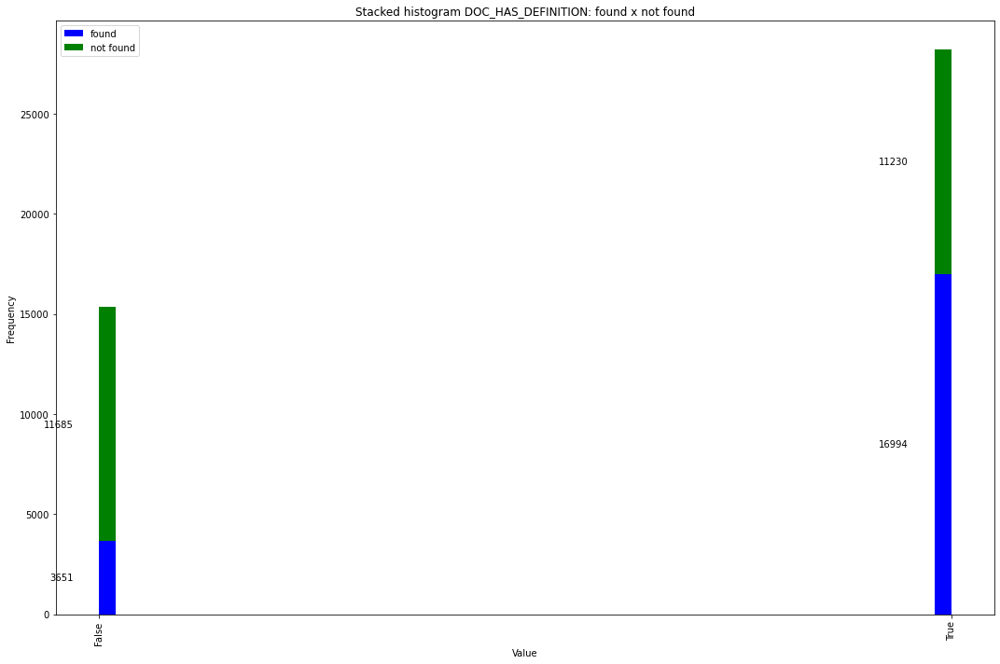

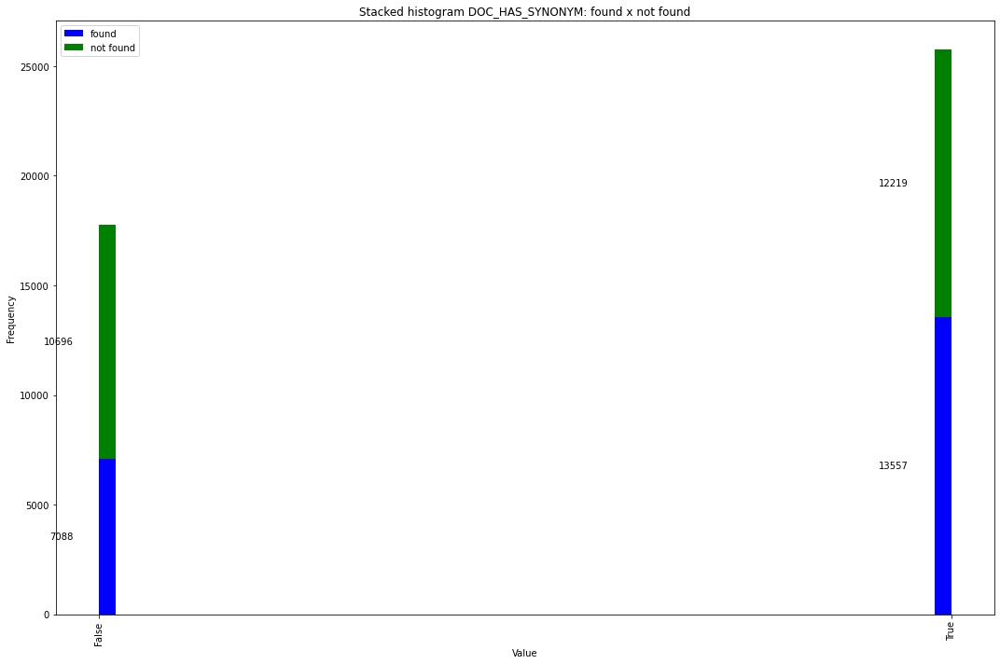

...

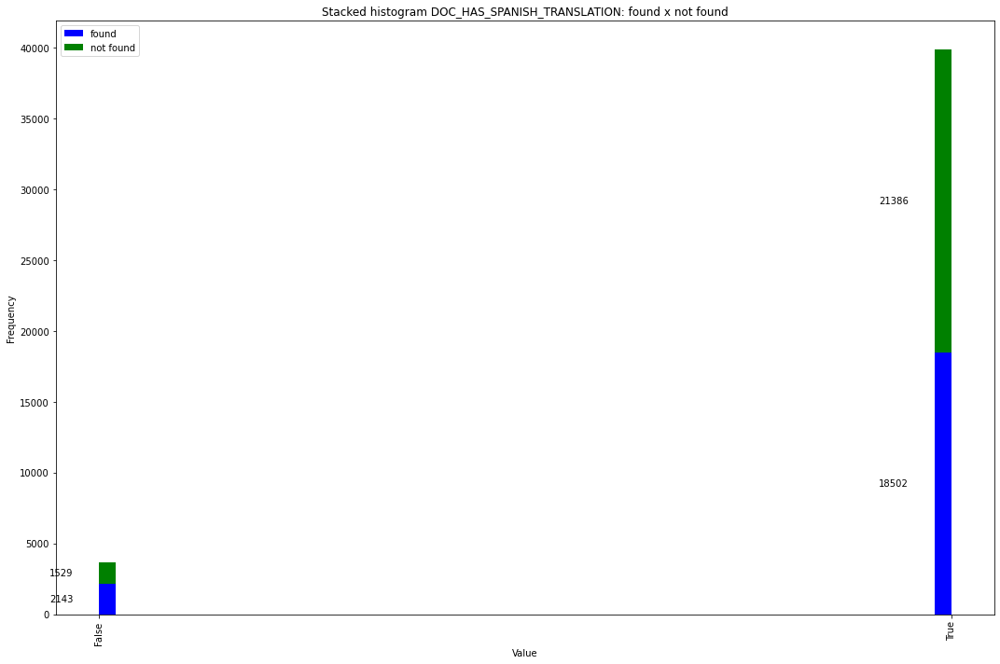

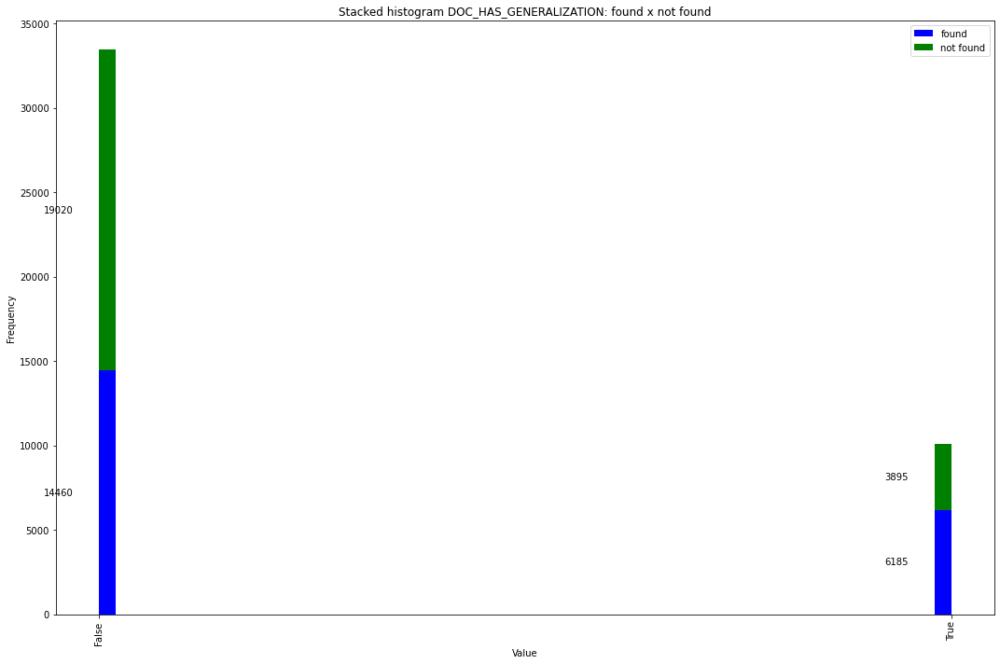

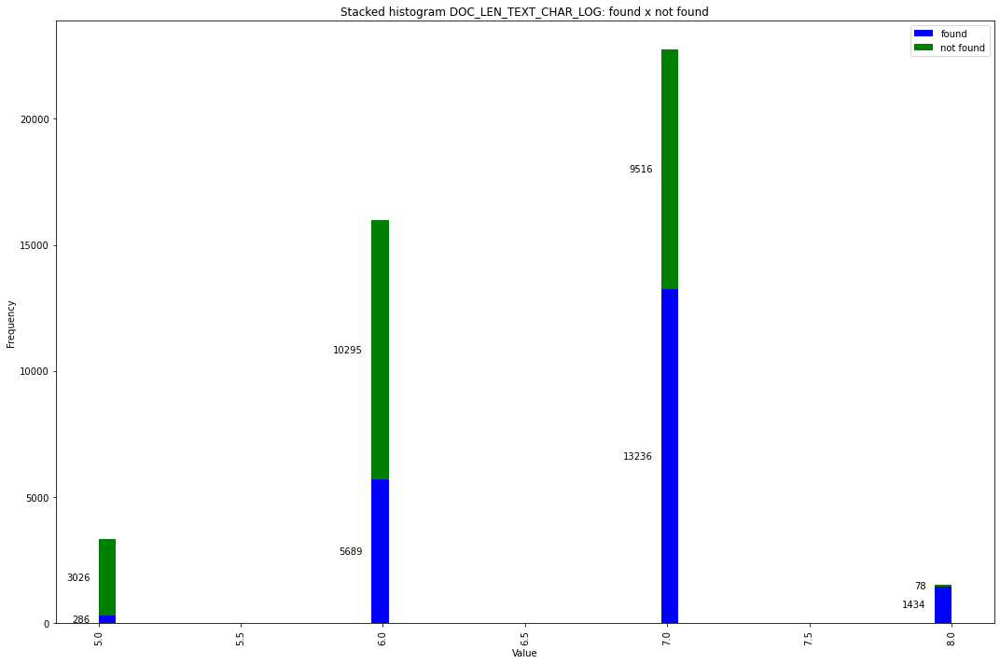

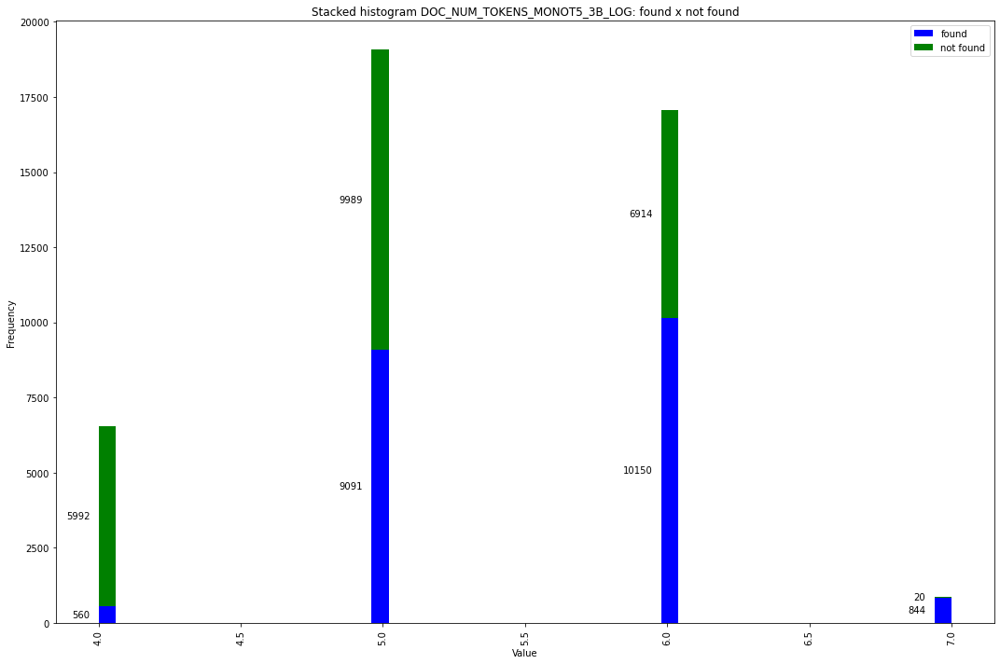

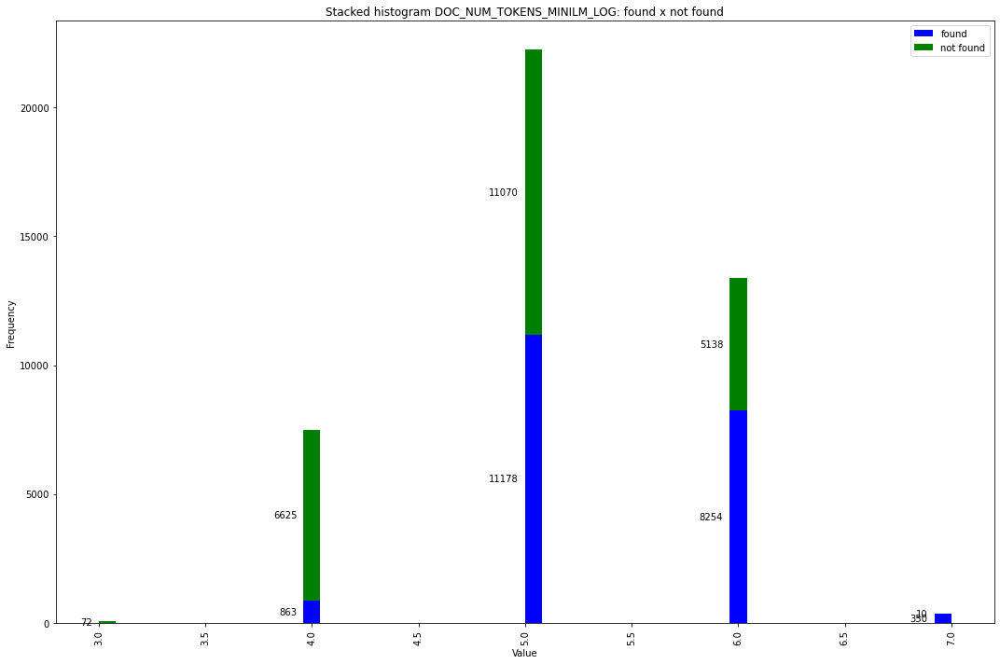

In [ ]:
for column in list_category_doc:
    f, ax = plt.subplots(1, 1, figsize=(15,10))
    plt.hist([df_result_doc_found.sort_values(by=column)[column].dropna(), df_result_doc_not_found.sort_values(by=column)[column].dropna()], color=['blue', 'green'], label=['found', 'not found'], stacked=True, bins=50)

    # Definir os rótulos do eixo X para columns booleanas
    if '_HAS_' in column:
        plt.xticks([0, 1], ['False', 'True'])

    for rect in ax.patches:
        height = rect.get_height()
        width = rect.get_width()
        x = rect.get_x()
        y = rect.get_y()

        if height > 0:
            # ax.text(x + width / 2, y + height + 0.01, int(height), ha='center', va='bottom')
            ax.text(x - 0.03, y + height / 2, int(height), ha='right', va='center')


    plt.legend()
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Stacked histogram {column}: found x not found')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

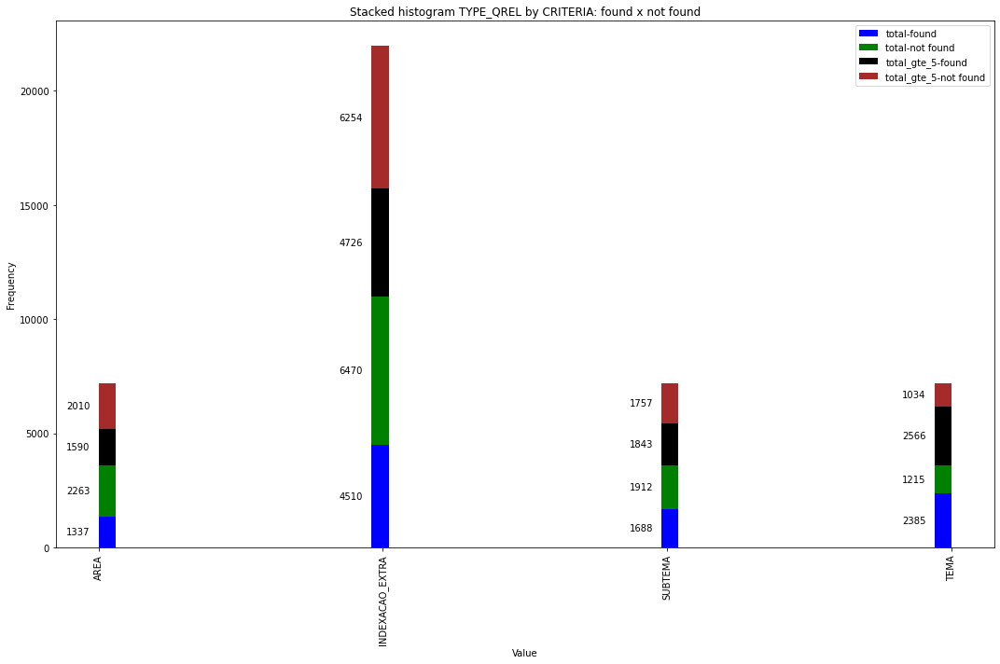

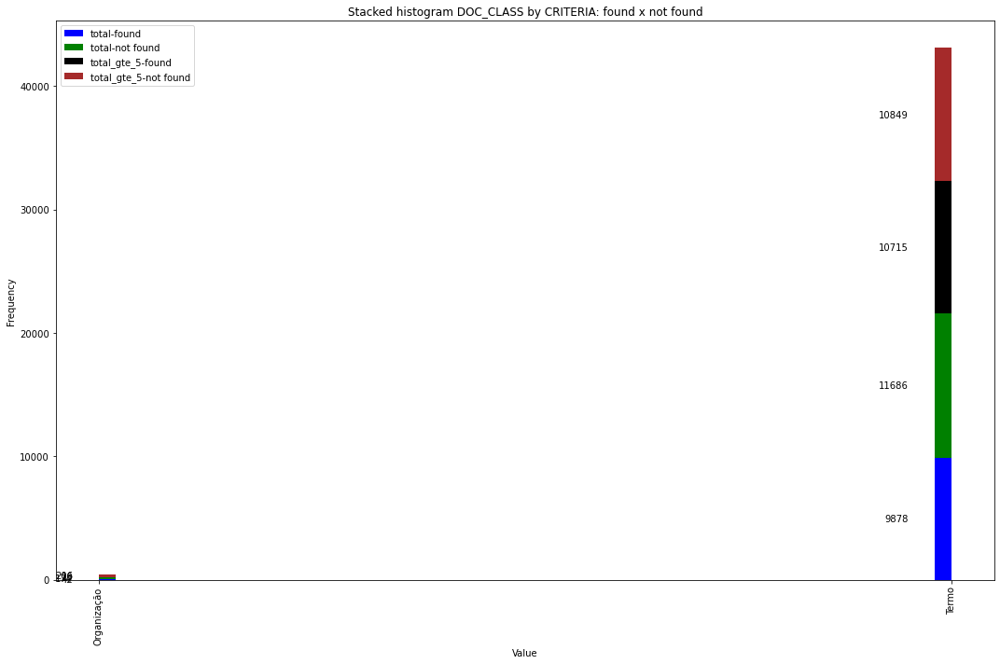

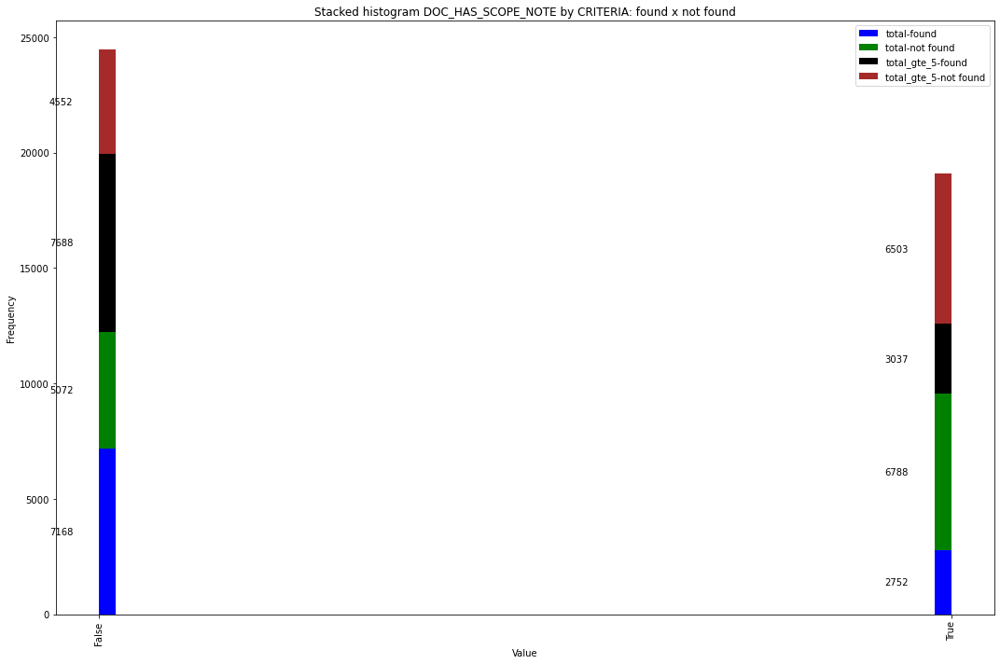

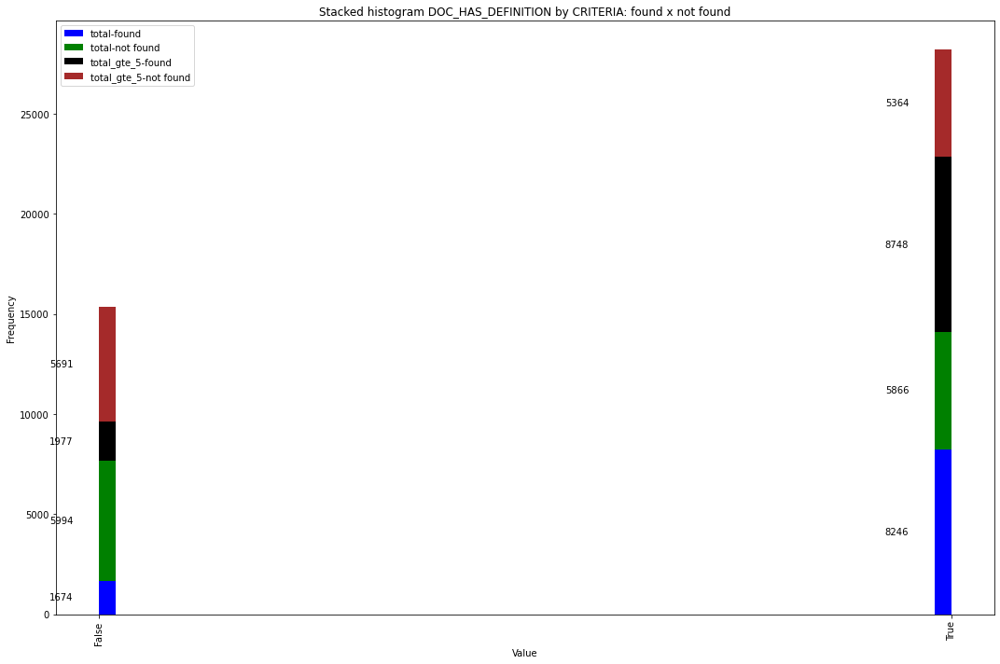

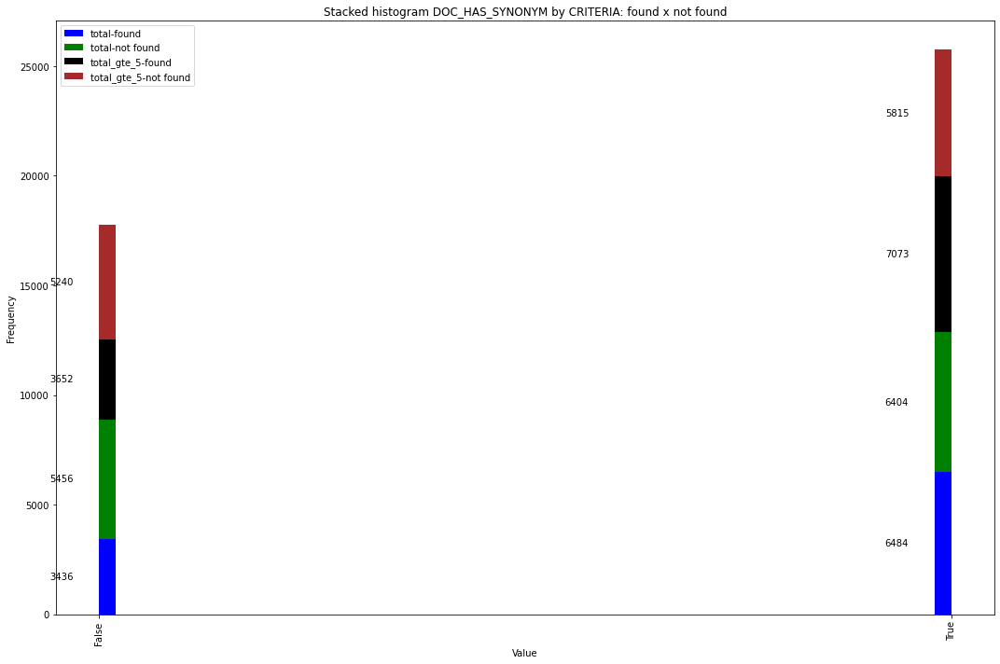

...

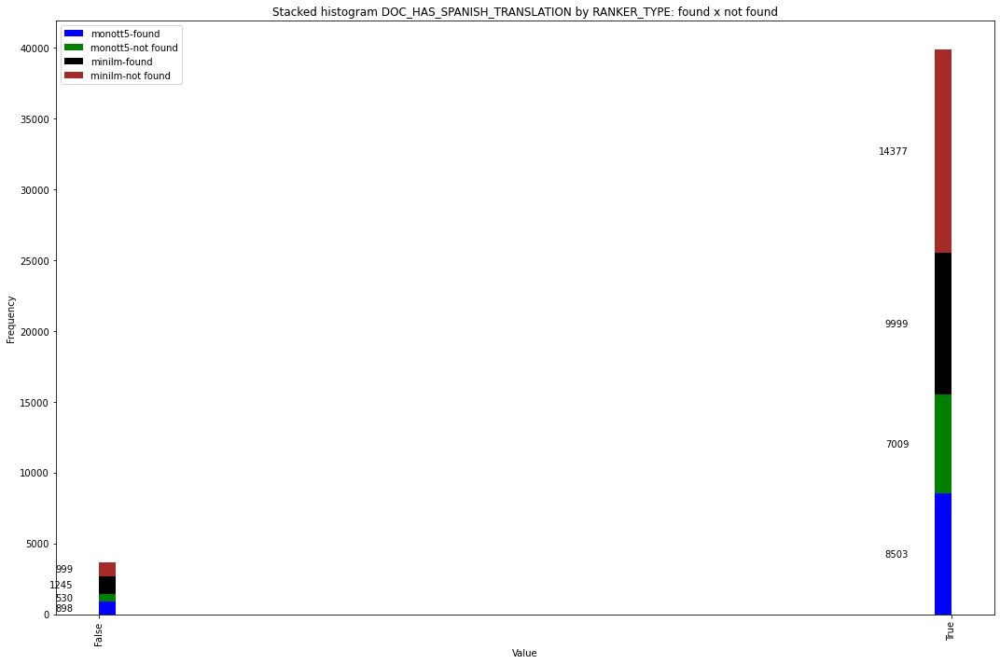

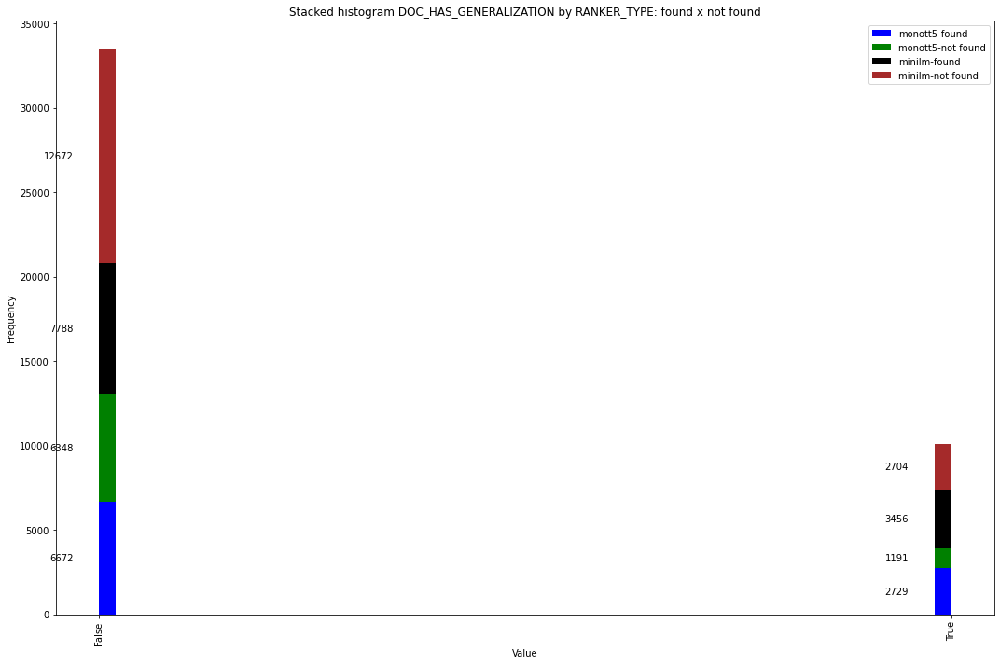

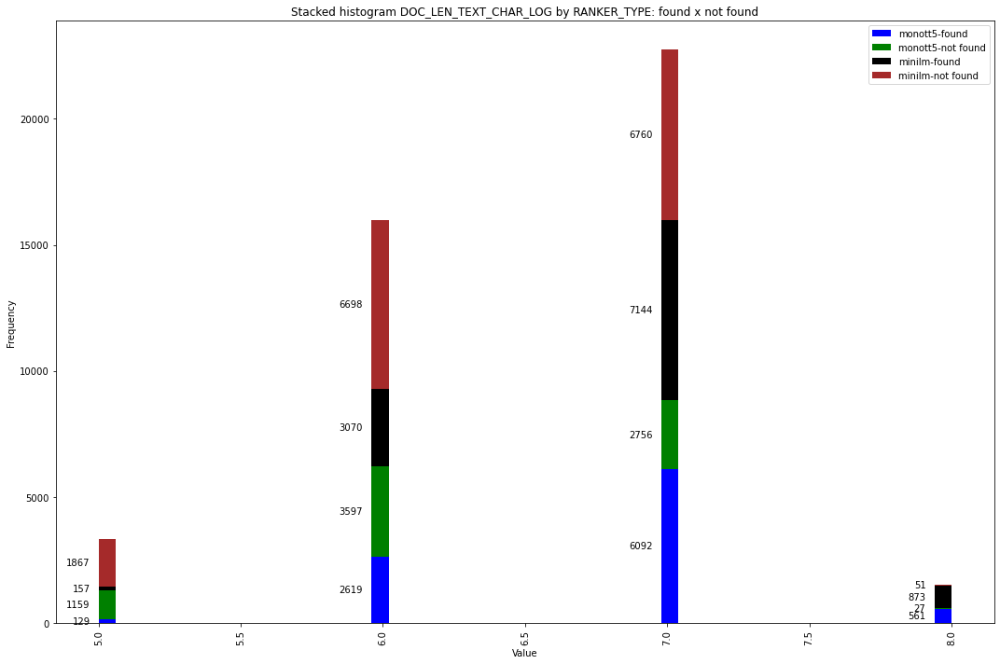

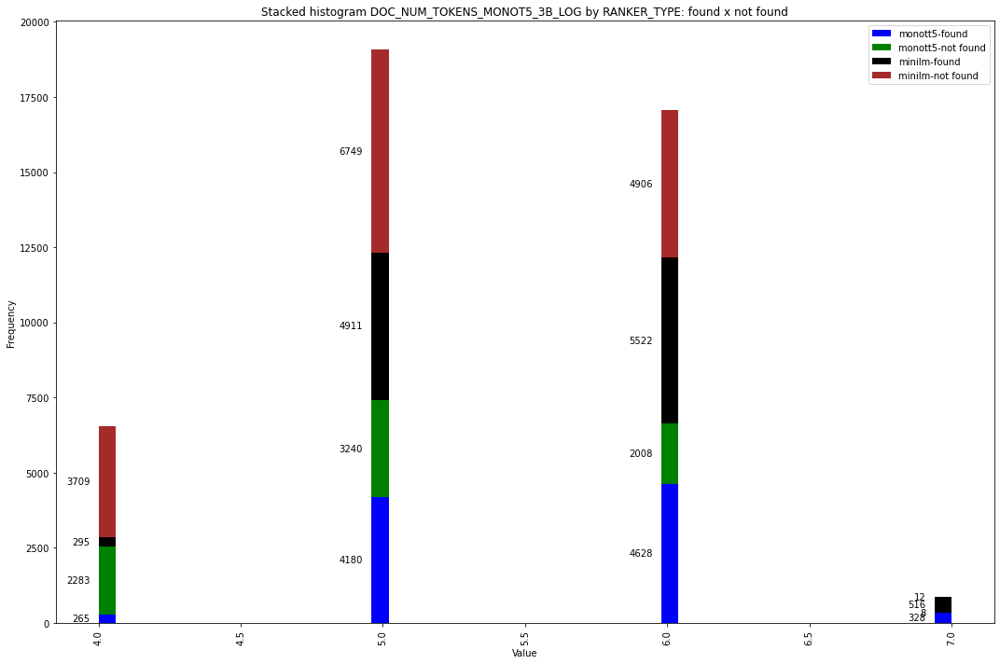

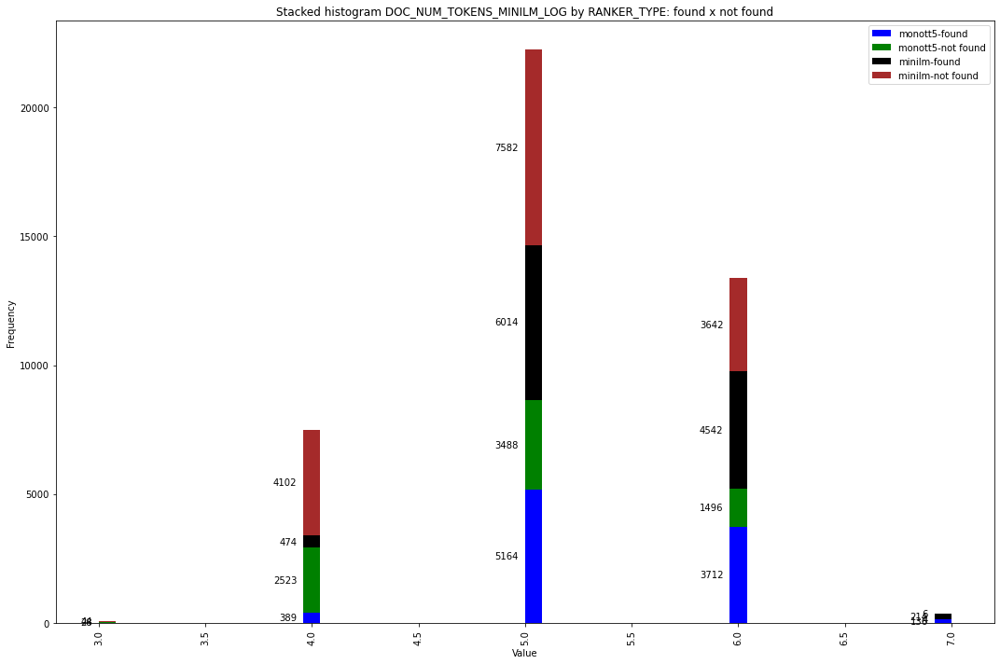

In [ ]:
for hue in ['CRITERIA', 'RETRIEVER_TYPE','RANKER_TYPE']:
    assert len(df_result_doc_found[hue].unique()) == 2, 'It only shows first 2 values'
    value1 = df_result_doc_found[hue].unique()[0]
    value2 = df_result_doc_found[hue].unique()[1]
    for column in list_category_doc:
        f, ax = plt.subplots(1, 1, figsize=(15, 10))
        plt.hist([
            df_result_doc_found[df_result_doc_found[hue] == value1].sort_values(by=column)[column].dropna(),
            df_result_doc_not_found[df_result_doc_not_found[hue] == value1].sort_values(by=column)[column].dropna(),
            df_result_doc_found[df_result_doc_found[hue] == value2].sort_values(by=column)[column].dropna(),
            df_result_doc_not_found[df_result_doc_not_found[hue] == value2].sort_values(by=column)[column].dropna(),
        ],
            color=['blue', 'green', 'black', 'brown'],
            label=[f'{value1}-found', f'{value1}-not found', f'{value2}-found', f'{value2}-not found'],
            stacked=True, bins=50)

        # Definir os rótulos do eixo X para colunas booleanas
        if '_HAS_' in column:
            plt.xticks([0, 1], ['False', 'True'])

        # Adicionar os valores das barras no topo e no lado esquerdo
        for rect in ax.patches:
            height = rect.get_height()
            width = rect.get_width()
            x = rect.get_x()
            y = rect.get_y()

            if height > 0:
                # ax.text(x + width / 2, y + height + 0.01, int(height), ha='center', va='bottom')
                ax.text(x - 0.03, y + height / 2, int(height), ha='right', va='center')

        plt.legend()
        plt.xlabel('Value')
        plt.ylabel('Frequency')
        plt.title(f'Stacked histogram {column} by {hue}: found x not found')
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()


/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


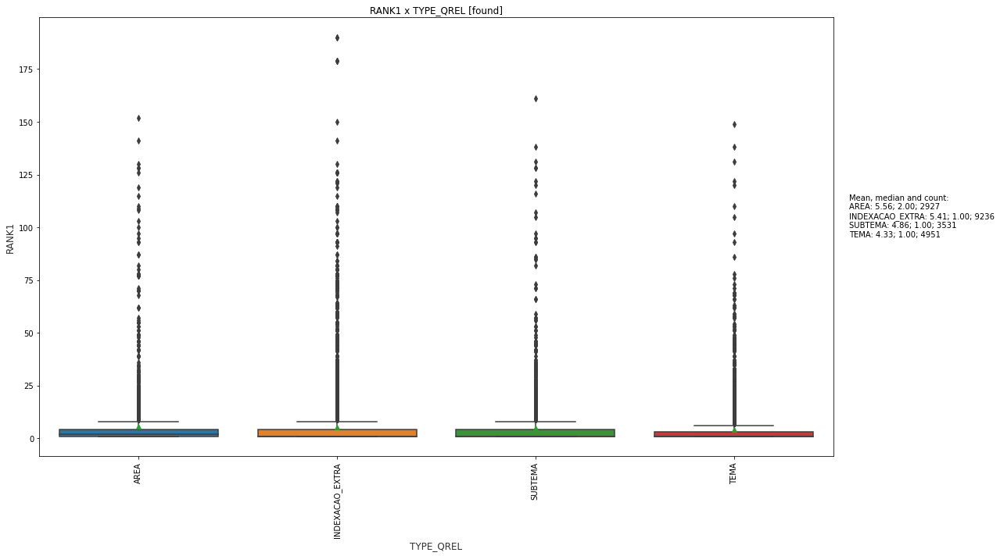

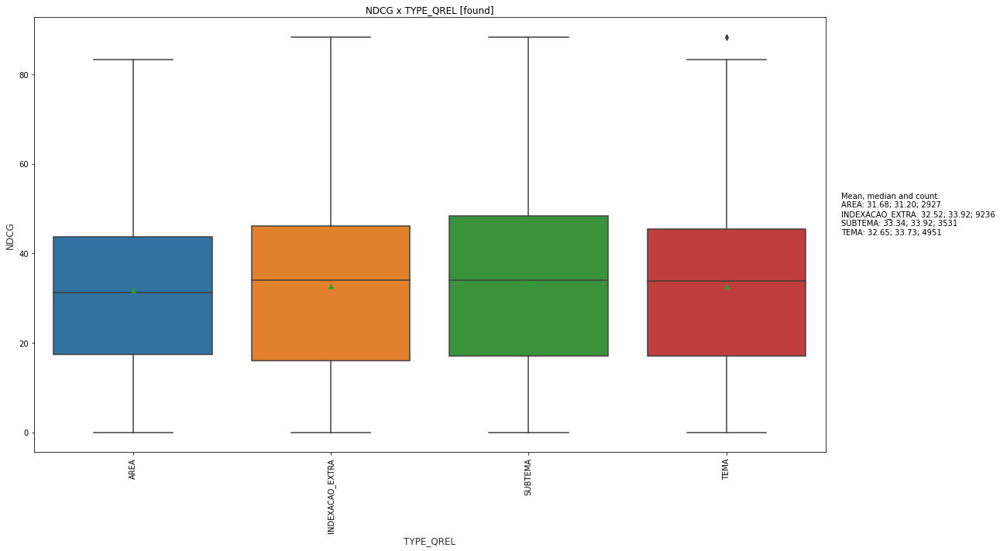

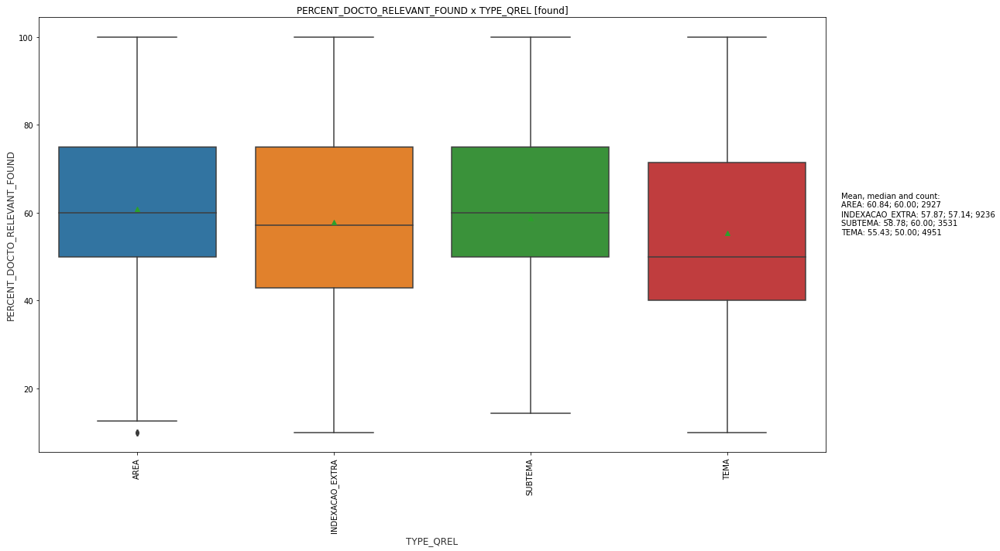

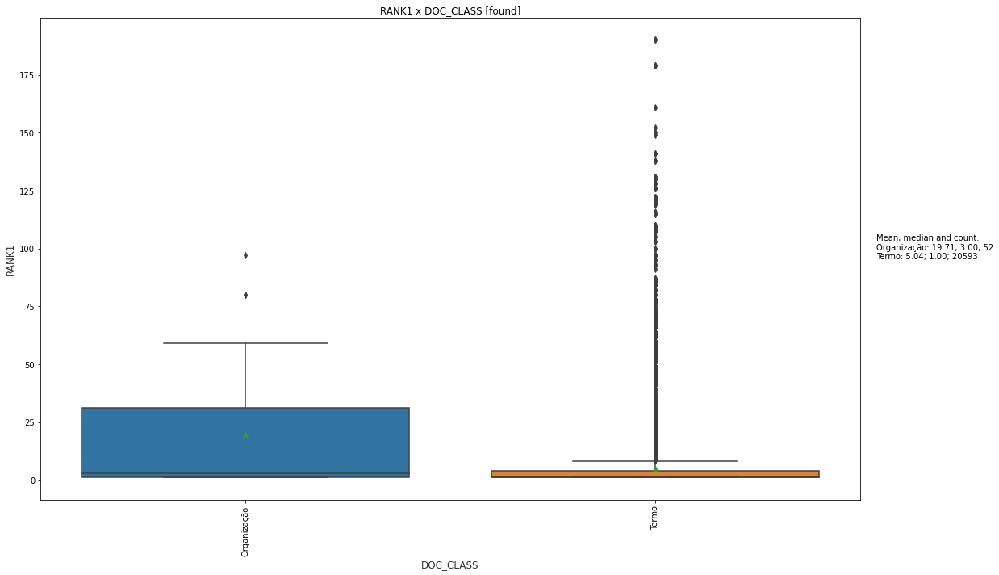

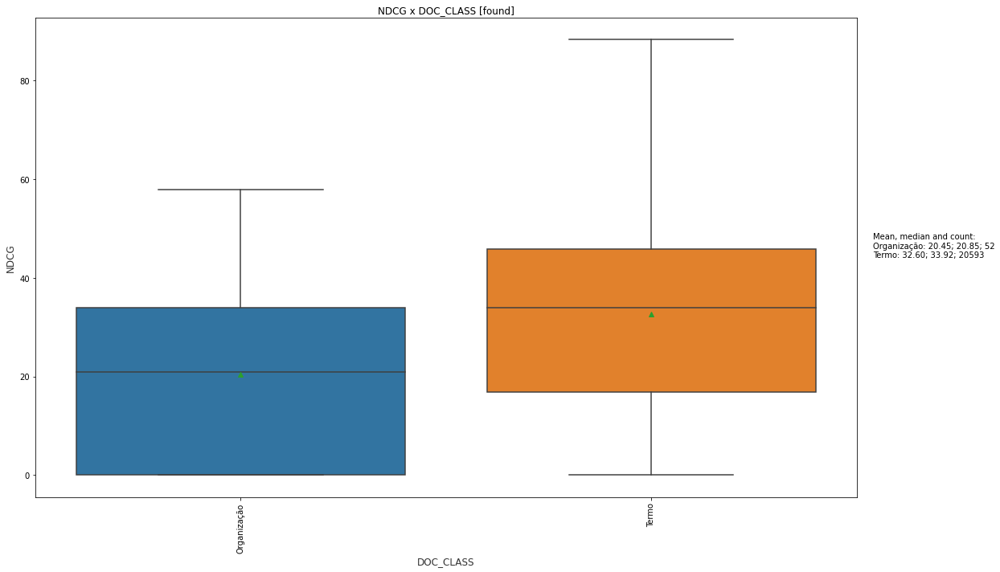

...

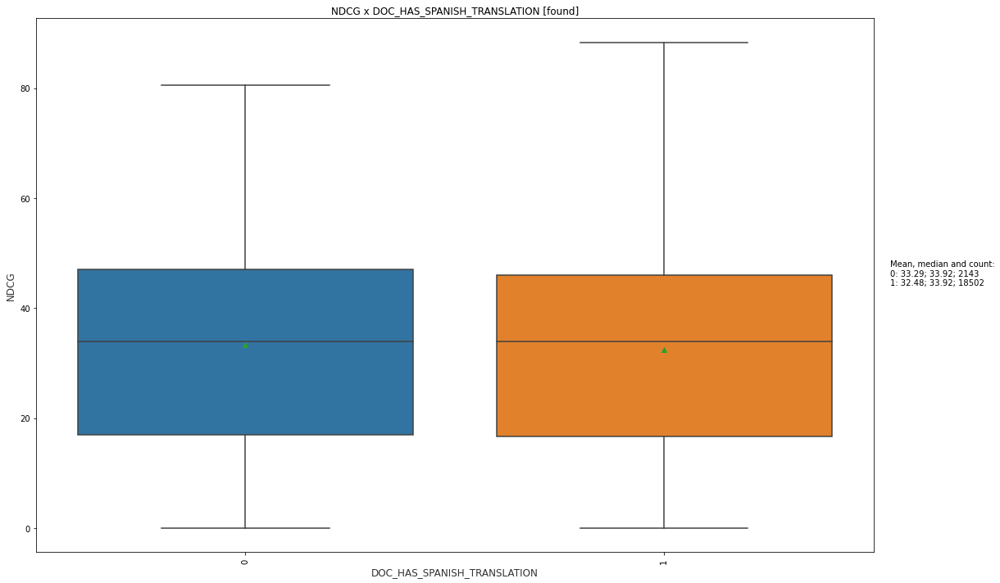

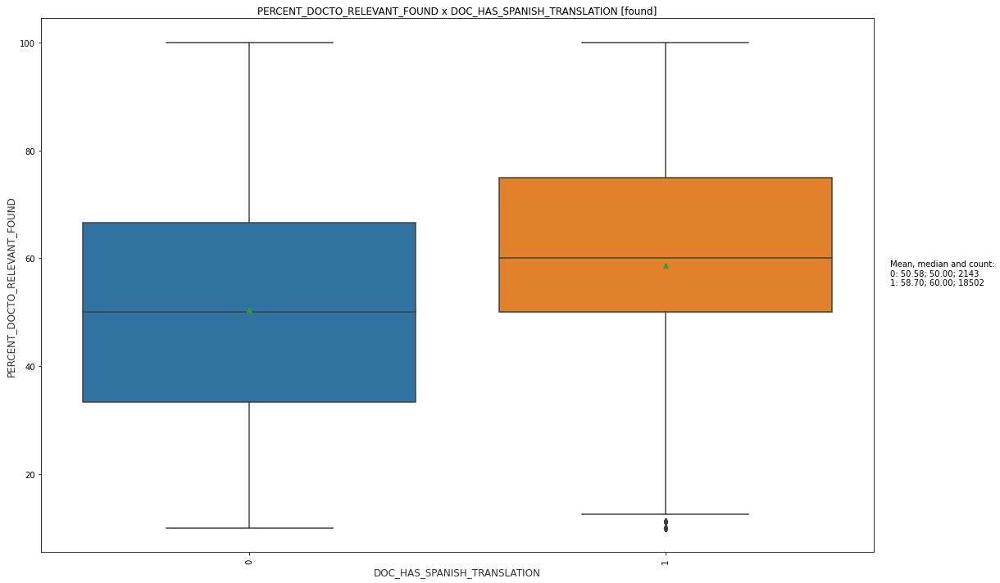

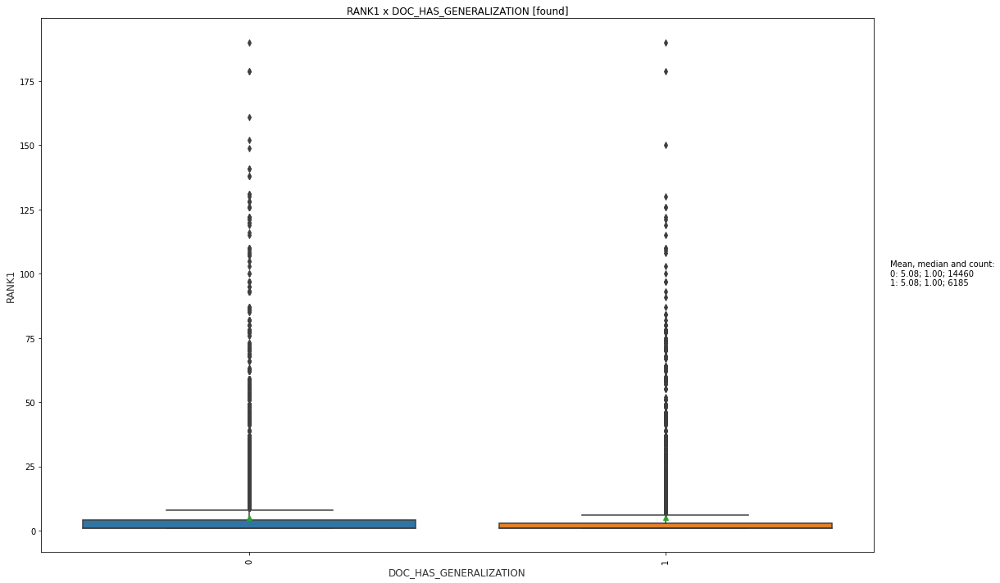

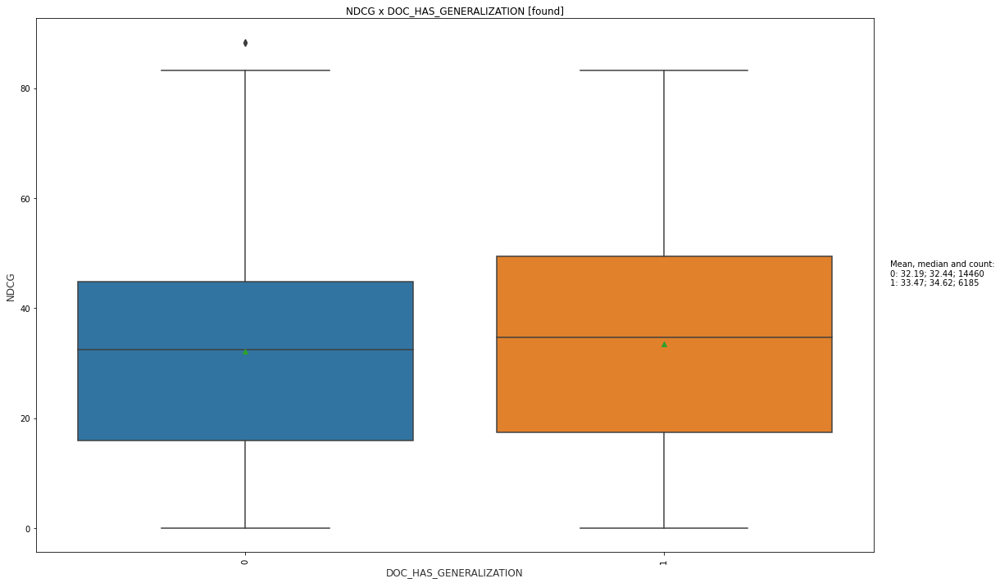

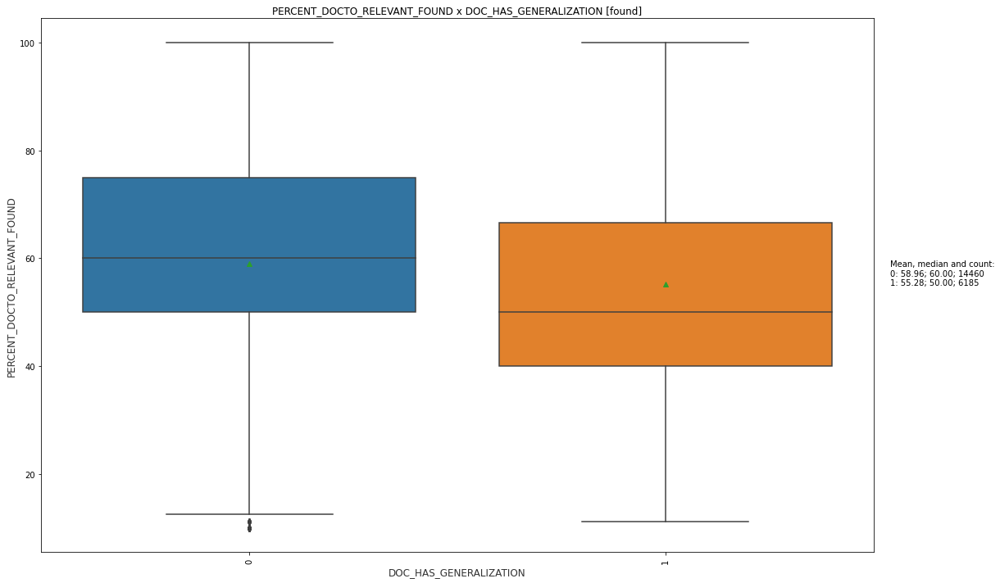

In [ ]:
for context in list_category_doc: 
    for metric in list_metric:
        
        # criar lista com valores únicos da coluna a ser ordenada
        # valores_unicos = sorted(df_result_doc_found[context].unique())
        
        valores_unicos = sorted(df_result_doc_found[context].dropna().unique())


        f, ax = plt.subplots(1, 1, figsize=(15,10))
        sns.boxplot(x=context, y=metric, data=df_result_doc_found, showmeans=True, ax=ax, order=valores_unicos)
        ax.set_xlabel(context,size = 12,alpha=0.8)
        ax.set_ylabel(metric,size = 12,alpha=0.8)
        ax.set_title(f'{metric} x {context} [found]')
        plt.xticks(rotation=90)
        plt.tight_layout()

        # Média e Mediana
        media = df_result_doc_found.groupby(context)[metric].mean()
        mediana = df_result_doc_found.groupby(context)[metric].median()
        count = df_result_doc_found.groupby(context)[metric].count()
        mm_list = [f"{i}: {j:.2f}; {k:.2f}; {l:.0f}" for i,j,k,l in zip(media.index, media, mediana, count)]
        mm_str = "\n".join(mm_list)
        ax.text(1.02, 0.5, f"Mean, median and count:\n{mm_str}", transform=ax.transAxes)

        """
        if context != 'CRITERIA':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='CRITERIA' , data=df_result_doc_found, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - Criteria view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RETRIEVER_TYPE':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RETRIEVER_TYPE' , data=df_result_doc_found, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RETRIEVER_TYPE view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RANKER_TYPE':
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RANKER_TYPE' , data=df_result_doc_found, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RANKER_TYPE view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()
        """

In [ ]:
len(df_result_doc_found['DOC_ID'].unique())

303

Creating validation data

In [ ]:
pd.DataFrame(df_result['QUERY_ID'].unique()).to_csv(f'../data/train_juris_tcu_index/validation_query_id.csv', index=False, header=['QUERY_ID'])